### Authorship
@author: Alexandre Pereira Santos <br>
alexandre.santos(at)lmu.de<br>
- uses OSMNx, pandas, geopandas, rasterio
- may include content from ChatGPT or GitHub Copilot

### Features
Prepare rasters as model inputs for the TI-City Model:
1. Density
- Import [WorldPop](https://www.worldpop.org/) data (tip: use [Google Earth Engine](https://developers.google.com/earth-engine/datasets/catalog/WorldPop_GP_100m_pop#description) data at 100 m resolution)
- Calculate density
- Resample to 150 m resolution [currently done in ArcGIS Pro]
- Ressample and co-register to 150 m grid
- Export to ASCII format

2. Real estate prices
- MUM and JAK: Import real estate empirical data from [Le Petit et al. (2023)](https://linkinghub.elsevier.com/retrieve/pii/S235234092300080X)
- MAN: scrap data from the [Lamudi](https://www.lamudi.com.ph/) real estate portal
- Select city in the AOI or clip to the AOI
- Interpolate point data [currently done in ArcGIS Pro, using [Empirical Bayesian Kriging](https://pro.arcgis.com/en/pro-app/latest/tool-reference/geostatistical-analyst/empirical-bayesian-kriging.htm)]
- Ressample and co-register to 30 m grid [currently done in ArcGIS Pro]
- Export to ASCII format

3. Built-up 2000 & built-up 2010
- Import [Global Urban Footprint](https://www.dlr.de/en/eoc/research-transfer/projects-missions/global-urban-footprint-guf) data
- Calculate distance raster
- Ressample and co-register to 150 m grid
- Export to ASCII format

4. Districts
- Rasterize [GADM4](https://gadm.org/data.html) polygons
- Export to ASCII format

5. Tenure status
- There is no global dataset
- For the Mumbai case, import the  MMRDA 2016 slum clusters
- For the Manila case, import the 2021 data census
- Convert to raster
- Ressample and co-register to 150 m grid
- Export to ASCII format

6. Exclusion layer
- Import water bodies from [HydroSHEDS](https://www.hydrosheds.org/)
- Convert to raster
- Ressample and co-register to 150 m grid
- Export to ASCII format

7. Attractiveness 2000 & 2020
- Calculate the centrality using [OSMnX](https://osmnx.readthedocs.io/en/stable/user-reference.html) data
- Select the top 15 percentile
- Calculate Euclidian distances to it
- Export to ASCII format

8. Calculate proximity using OSM data
- Fetch OSM data for health_facilities, schools, suburban_centres, shopping_malls, markets, airport, cbd
- Classify major features
- Rasterize and calculate Euclidian distance to major features
- Export to shapefile, TIFF and ASCII formats.

9. Slope
- calculated externally (ArcGIS) using TanDEM X data at 150 m resolution

### Prerequisites
- AOI vector file (i.e., shapefile or geopackage)
- Raster reference file with the same extent as the AOI

## Roadmap:

### Version 0.4
1. Update dates to JAK calibration data (2015-2025)
   - [X] Built up
   - [X] Population
   - [X] GDP
2. Review exclusion layer
   - [X] Golf courses
   - [X] Military installations
   - [X] incorporate Flood prone areas - as risk comparison
  
3. Include additional inputs for validation and analysis
   - [ ] 150 m reference grid for Tenure/informality
   - [ ] 150 m reference grid for Income/wealth
4. [ ] Incorporate utility quick-fix into the distance raster function
5. [ ] Test distance function sensitivity (to try to keep it all in Python, removing ArcGIS)
6. [X] Move quality check to a new file (this one is too large)
7. [X] Adopt a .py format functions file (to help Pylance)

### Version 0.5 (future)
1. [ ] Run the model_input notebook for MUM
- [ ] Population
- [ ] Built up
- [ ] Districts
- [ ] Distance to urban facilities [from OSM: roads, schools, suburban centres, shopping malls, markets, airports, CBD, attractive residential areas, water bodies]
- [ ] Cost-distance function
- [ ] Slope
- [ ] Tenure status/informality
- [ ] Exclusion and water layers
- [ ] Attractive areas
- [ ] Income
- [ ] Real estate
- [ ] Planning
- [ ] Hazards

### Version 0.3 
1. Simplify georeferencing procedure for 150 m resolution and corresponding grid
- [X] 150 m reference grid for Population
- [X] 150 m reference grid for Built up
- [X] 150 m reference grid for Districts
- [X] 150 m reference grid for OSM Distances
- [X] 150 m reference grid for slope
- [X] 150 m reference grid for DEM
- [X] 150 m reference grid for Exclusion
- [X] 150 m reference grid for Attractiveness
- [X] 150 m reference grid for Real Estate prices
- [X] 150 m reference grid for Planning
- [ ] 150 m reference grid for Hazards
- [X] Historical OSM distances (so far, for 2015)

2. [X] Combine model inputs with quality checks (i.e. ti_city_02_check_inputs.ipynb)

3. Remove the need for further AOI conversion (i.e., ti_city_04_convert_inputs_new_AOI.ipynb)
- [X] check max AOI dimensions in NetLogo

5. include a resolution variable across all functions
- [X] prepare_model_inputs notebook
- [X] raster_functions notebook

### Version 0.2 
on 02.03.2024
1. develop cost-distance function
2. clip contents to new MAN AOI, similar to the results from SLEUTH simulation by Dr Olabisi Obaitor
3. create inputs quality checks:
- [X] registration and number of cells
- [X] value type (integers, float, text)
- [X] remove negative values from normalised layers
- [X] export corrected outputs and overwrite old ones when necessary
- [X] rename ASCII files

on 02.12.2024
1. [X] Update data model documentation
- [X] move and group context-dependent functions to the end of the notebook
1. [X] Review data model for unused features and remove them
2. [X] Adjust model for AOI selection between MUM, JAK, and MAN
- [X] Adjust **real estate prices** imports for AOI selection

On 15.11.2024
1. [X] Create basic functions for each feature
- [X] (need to include all completed sub-features, e.g., 1. Population > Import and downscale population data from WorldPop)
2. [X] Adjust model for AOI selection between MUM, JAK, and MAN
- [X] create segmentation at the init 
- [X] Adjust **population** imports for AOI selection
- [X] Adjust **built-up** imports for AOI selection
- [X] Adjust **districts** imports for AOI selection
- [X] Adjust **tenure** imports for AOI selection for MAN
- [X] Adjust **exclusion** imports for AOI selection
- [X] Adjust **attractiveness** imports for AOI selection
- [X] Adjust **facilities distances** imports for AOI selection
- [X] Adjust **slope** imports for AOI selection
- [X] Standardise file names for the exclusion layer (water bodies, national parks, other limitations)
- [X] Standardise file names for the census districts/wards/tracts (depending on the case)
- [X] Adjust export functions to take the case_city as prefix

### Version 0.1
1. create import functions based on AOI: import, rasterize (when necessary), clip, export
2. create distance functions based on OSM (roads, health, schoolds, suburban centres, ...)

# imports

In [23]:
#%%time
# utils
import os
from pathlib import Path
import sys
import fnmatch
import shutil
from logging import error

# maths
import numpy as np
#import random 
import matplotlib.pyplot as plt
#import matplotlib.colors as mcolors
#import matplotlib.patches as mpatches
from scipy.ndimage import distance_transform_edt #, gaussian_filter
#from skimage.graph import route_through_array

# GIS
from shapely.geometry.polygon import Polygon
from shapely.geometry import MultiLineString #, LineString, MultiPolygon, Point, MultiPoint, GeometryCollection
import seaborn as sns
#import json
import pandas as pd
import geopandas as gpd
import osmnx as ox

# raster stuff
import rasterio
from rasterio import features
from rasterio.warp import Resampling #reproject, calculate_default_transform,
from rasterio.mask import mask
from rasterio.plot import show, plotting_extent #, show_hist
#from rasterio import plot
#from osgeo import gdal, osr    
#import ee
#import geemap

from ti_city_00_raster_functions import *
#from ti_city_00_raster_functions import majority_filter

# init

In [24]:
#%%time

case_city = 'JAK' #MUM MAN JAK
drop_path = r'C:\\Sciebo\\05_GIS\\' # adjust this to match the path on your computer, e.g. 'D:\\Dropbox\\x\\PostDoc\\GIS' or 'C:\\Users\\x\\Dropbox\\x\\PostDoc\\GIS'
external_data_path = Path(r'C:\\Sciebo\\00_data') # adjust this to match the path on your computer, e.g. 'D:\\Dropbox\\x\\PostDoc\\00_data' or 'C:\\Users\\x\\Dropbox\\x\\PostDoc\\00_data'
## ascii150_arcgis_path = Path(r"D:\\Dropbox\\x\\PostDoc\ASCII_150m") deprecated, ignore

#input a vector and a raster file for each city
AOI_path = Path(f'{drop_path}\\{case_city}\\processed\\')
AOI_file = f'{case_city}_LIM_AOI_reference_150m_A.shp' # APS: updated AOI 01.08.2024

AOI_gdf = gpd.read_file(AOI_path / AOI_file) #.to_crs(epsg=4326)
AOI_gdf_4326 = AOI_gdf.to_crs(epsg=4326) 

ref_raster_path = Path(f'../data/processed/{case_city}_LIM_reference_AOI_150m.tif')
ref_raster_150_path = Path(f'../data/processed/{case_city}_LIM_reference_AOI_150m.tif')

raw_path = Path(f'\\{case_city}\\raw\\')
interim_path = Path(drop_path + f'{case_city}\\interim\\')
processed_path = Path(drop_path + f'{case_city}\\processed\\')
external_path = Path(drop_path + f'{case_city}\\external\\')
model_inputs_30m_path = Path(drop_path + f'{case_city}\\model_inputs\\TIFF_30m\\')
model_inputs_150m_path = Path(drop_path + f'{case_city}\\model_inputs\\TIFF_150m\\')
model_inputs_SLEUTH_150m_path = Path(drop_path + f'{case_city}\\model_inputs\\TIFF_SLEUTH_150m')
ascii150_path = Path(drop_path + f'\\{case_city}\\model_inputs\\ASCII_150m')
ascii150_SLEUTH_path = Path(drop_path + f'\\{case_city}\\model_inputs\\ASCII_SLEUTH_150m')
ti_city_ascii_path = Path(f'../model/{case_city}/data/in/')
ti_city_out_path = Path(f'../model/{case_city}/data/out/')
ref_raster_sleuth_path = model_inputs_SLEUTH_150m_path / (case_city + '_URB_SLEUTH_input_2022.tif' )

if case_city == 'MUM':
    gadm_var = 'NAME_3'
    calibration_years = [2015,2025]

if case_city == 'MAN':    
    gadm_var = 'NAME_2'
    calibration_years = [2015,2025]

if case_city == 'JAK':
    gadm_var = 'NAME_3'
    calibration_years = [2015,2025]

##%run ./ti_city_00_raster_functions.ipynb

# read the reference raster
with rasterio.open(ref_raster_path,'r') as src: # APS 20.08.2025 using the 150 m raster
    ref_raster = src
    ref_meta = src.meta
    ref_height, ref_width, ref_area = get_transform(ref_raster)

# suppress deprecation warnings
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn


In [3]:
# print the AOI bound coordinates
bounds = AOI_gdf.total_bounds
print(f'AOI bounds (lon_min, lat_min, lon_max, lat_max): {bounds}')

AOI bounds (lon_min, lat_min, lon_max, lat_max): [ 639000. 9249000.  754800. 9351000.]


# Preparing rasters

# 1. Population density
- Import WorldPop data
- Calculate density
- Ressample and co-register to 150 m grid

### Ressampling the pop data from ca. 100 m to 150 m

ps: Daysimetric mapping:
Performin daysimetric mapping, as suggested in https://gis.stackexchange.com/questions/141763/after-turning-census-block-data-into-a-raster-how-do-i-redistribute-the-density
1. Create a density grid for the Census data by dividing each polygon's count by its area and converting that directly to raster format.
2. Create a relative density grid for the land cover data by joining the relative density table to the land cover type identifier.
3. Multiply the two grids (1) and (2).
4. Compute a zonal sum of the product in (3), using the Census regions as zones. Store this as a raster rather than a table.
5. Multiply (3) by the Census counts, divide by (4), and divide by the cell area.

In [ ]:
# type: ignore
# fetch population data from WorldPOP using gee
# data source: https://developers.google.com/earth-engine/datasets/catalog/WorldPop_GP_100m_pop
import ee
import geemap

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-alexandresantosgeographie') # Replace with your GEE project 
print(ee.__version__)



Successfully saved authorization token.
1.5.20


In [ ]:
# type: ignore
# check if the authentication is working
print(ee.Image("JRC/GHSL/P2023A/GHS_POP/1975").getInfo()) #.get("smod_code")

{'type': 'Image', 'bands': [{'id': 'population_count', 'data_type': {'type': 'PixelType', 'precision': 'double'}, 'dimensions': [360820, 180000], 'crs': 'PROJCS["World_Mollweide", \n  GEOGCS["WGS 84", \n    DATUM["WGS_1984", \n      SPHEROID["WGS 84", 6378137.0, 298.257223563, AUTHORITY["EPSG","7030"]], \n      AUTHORITY["EPSG","6326"]], \n    PRIMEM["Greenwich", 0.0], \n    UNIT["degree", 0.017453292519943295], \n    AXIS["Longitude", EAST], \n    AXIS["Latitude", NORTH]], \n  PROJECTION["Mollweide"], \n  PARAMETER["semi_minor", 6378137.0], \n  PARAMETER["false_easting", 0.0], \n  PARAMETER["false_northing", 0.0], \n  PARAMETER["central_meridian", 0.0], \n  UNIT["m", 1.0], \n  AXIS["Easting", EAST], \n  AXIS["Northing", NORTH]]', 'crs_transform': [100, 0, -18041000, 0, -100, 9000000]}], 'version': 1690185742435464, 'id': 'JRC/GHSL/P2023A/GHS_POP/1975', 'properties': {'system:time_start': 157766400000, 'system:footprint': {'type': 'LinearRing', 'coordinates': [[-180, -90], [180, -90], 

In [ ]:
# type: ignore
# select the image from the country at hand from https://developers.google.com/earth-engine/datasets/catalog/WorldPop_GP_100m_pop

if case_city == 'MUM':
    case_image2000 = ee.Image('WorldPop/GP/100m/pop/IND_2000') # India
    case_image2020 = ee.Image('WorldPop/GP/100m/pop/IND_2020') # India
    case_aoi_crs, case_roi, case_rec_roi, case_coi = get_coords(AOI_gdf.to_crs('EPSG:4326'))
if case_city == 'JAK':
    case_image2000 = ee.Image('WorldPop/GP/100m/pop/IDN_2000') # Indonesia
    case_image2020 = ee.Image('WorldPop/GP/100m/pop/IDN_2020') # Indonesia
    case_aoi_crs, case_roi, case_rec_roi, case_coi = get_coords(AOI_gdf.to_crs('EPSG:4326'))
if case_city == 'MAN':
    case_image2000 = ee.Image('WorldPop/GP/100m/pop/PHL_2000') # Philippines
    case_image2020 = ee.Image('WorldPop/GP/100m/pop/PHL_2020') # Philippines
    case_aoi_crs, case_roi, case_rec_roi, case_coi = get_coords(AOI_gdf.to_crs('EPSG:4326'))

print(case_city, '2000 stats:', check_image_stats(case_image2000, case_roi))
print(case_city, '2020 stats:', check_image_stats(case_image2020, case_roi))

JAK 2000 stats: {'population_max': 177.91664123535156, 'population_min': 0.12160186469554901}
JAK 2020 stats: {'population_max': 235.88604736328125, 'population_min': 0.3855913281440735}


In [ ]:
# type: ignore

Map = geemap.Map()
Map.centerObject(case_roi, zoom=9)

populationCountVis = {
  'min': 0.0,
  'max': 100.0,
  'palette':['000004', '320A5A', '781B6C', 'BB3654', 'EC6824', 'FBB41A', 'FCFFA4']
}

image2000 = case_image2000.updateMask(case_image2000.gt(0))
image2020 = case_image2020.updateMask(case_image2020.gt(0))

Map.addLayer(case_image2000, populationCountVis, 'Population count, 2000')
Map.addLayer(case_image2020, populationCountVis, 'Population count, 2020')
Map.addLayer(case_roi, {}, 'ROI', )
Map


Map(center=[-6.329038576274177, 106.78013104072295], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
# type: ignore

# create individual images for each of the AOIs

case_pop2000 = image2000.clip(case_rec_roi)
case_pop2020 = image2020.clip(case_rec_roi)
case_crs='EPSG:'+str(case_rec_roi)
print(case_city + '_pop2000 stats:', check_image_stats(case_pop2000, case_rec_roi))
print(case_city + '_pop2020 stats:', check_image_stats(case_pop2020, case_rec_roi))
Map = geemap.Map()
Map.centerObject(case_rec_roi, zoom=9)
Map.addLayer(case_pop2020, populationCountVis, 'Population count, 2020')
Map.addLayer(case_pop2000, populationCountVis, 'Population count, 2000')
Map.addLayer(case_roi, {}, 'ROI', )
Map


JAK_pop2000 stats: {'population_max': 177.91664123535156, 'population_min': 0.12160186469554901}
JAK_pop2020 stats: {'population_max': 235.88604736328125, 'population_min': 0.3855913281440735}


Map(center=[-6.329213585920722, 106.78013104072292], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
# type: ignore

# export the images for the case
# the function exports the images in the original CRS, as the reprojection caused a resampling error
# check the GEE tasks in the Earth Engine Code Editor 
##%run ./ti_city_00_raster_functions.ipynb
case_task_2000 = export_ee_image(case_pop2000, case_city + '_POP_population_2000_WDPoP_WGS84', case_rec_roi) 
case_task_2020 = export_ee_image(case_pop2020, case_city + '_POP_population_2020_WDPoP_WGS84', case_rec_roi) 

# check task status
tasks = [case_task_2000, case_task_2020]
for task in tasks: 
    if task: 
        print(f'Task {task.status()["id"]} is {task.status()["state"]}')
    else:
        print('Task failed')

NameError: name 'case_pop2000' is not defined

## GHSL

In [ ]:
##%run ./ti_city_00_raster_functions.ipynb
# APS 23.04.2026: updating years with calibration vars

ghsl_path = external_data_path / 'WD GHSL Pop'
if case_city == 'MUM':    
    ghsl_early_file = ghsl_path /('GHS_POP_E'+str(calibration_years[0])+'_GLOBE_R2023A_WGS84_43N_100_V1_0_R7_C26.tif')
    ghsl_late_file = ghsl_path /('GHS_POP_E'+str(calibration_years[1])+'_GLOBE_R2023A_WGS84_43N_100_V1_0_R7_C26.tif')
elif case_city == 'MAN':
    ghsl_early_file = ghsl_path / 'some_file.tif' # these names need replacing when we download the GHSL data
    ghsl_late_file = ghsl_path / 'some_file.tif'
elif case_city == 'JAK':
    # sample file name: #GHS_POP_E2015_GLOBE_R2023A_WGS84_48S_100_V1_0_R7_C26
    ghsl_early_file = ghsl_path /('GHS_POP_E'+str(calibration_years[0])+'_GLOBE_R2023A_WGS84_48S_150_V1_0_R7_C26.tif')
    ghsl_late_file = ghsl_path /('GHS_POP_E'+str(calibration_years[1])+'_GLOBE_R2023A_WGS84_48S_150_V1_0_R7_C26.tif')

ghsl_density_early, pop_raster_early_area, pop_raster_early_transform, pop_array_early = calculate_density(ghsl_early_file, AOI_gdf, pop_extract=True)
ghsl_density_late, pop_raster_late_area, pop_raster_late_transform, pop_array_late = calculate_density(ghsl_late_file, AOI_gdf, pop_extract=True)

print('Reference raster area', ref_area)
print(f'Population first calibration year raster area {calibration_years[0]}:', pop_raster_early_area)
print(f'Population second calibration year raster area {calibration_years[1]}:', pop_raster_late_area)
print(ghsl_density_early.shape, ghsl_density_late.shape)
print(ghsl_density_early.shape, ghsl_density_late.shape)

EPSG:32748
height:  150.0 
width:  150.0
EPSG:32748
height:  150.0 
width:  150.0
Reference raster area 22500.0
Population first calibration year raster area 2015: 22500.0
Population second calibration year raster area 2025: 22500.0
(1, 680, 772) (1, 680, 772)
(1, 680, 772) (1, 680, 772)


### export the raster

In [11]:
print(pop_raster_early_transform[4])

-150.0


In [ ]:
# export the early density raster to the interim folder
data_type = rasterio.float32
raster = ghsl_density_early
img_name_early = case_city + f'_POP_density_normal_{calibration_years[0]}_GHSL_temp_150m.tif'
url = interim_path / img_name_early
transform = pop_raster_early_transform

with rasterio.open(ghsl_early_file, 'r') as ref_export:
    try:
        with rasterio.open(
            url, "w",
            driver = "GTiff",
            crs = ref_export.crs,
            transform = transform,
            dtype = data_type,
            compress='lzw',
            count = 1,
            height = raster.shape[1],
            width = raster.shape[2]) as dst:
            dst.write(raster) #, indexes = 1
        print("Raster written successfully:\n", url)
    except Exception as e:
        print('Raster export error:', e)

# export the second calibration year density raster to the interim folder
data_type = rasterio.float32
raster = ghsl_density_late
img_name_late = f"{case_city}_POP_density_normal_{calibration_years[1]}_GHSL_temp_150m.tif"
url = interim_path / img_name_late

with rasterio.open(ghsl_late_file, 'r') as ref_export:
    try:
        with rasterio.open(
            url, "w",
            driver = "GTiff",
            crs = ref_export.crs,
            transform = transform,
            dtype = data_type,
            compress='lzw',
            count = 1,
            height = raster.shape[1],
            width = raster.shape[2]) as dst:
            dst.write(raster) #, indexes = 1
        print("Raster written successfully:\n", url)
    except Exception as e:
        print('Raster export error:', e)

Raster written successfully:
 D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_POP_density_normal_2015_GHSL_temp_150m.tif


In [6]:
# export the early population raster to the interim folder
data_type = rasterio.float32
raster = pop_array_early
img_name_early = case_city + f'_POP_population_{calibration_years[0]}_GHSL_temp_150m.tif'
url = interim_path / img_name_early
transform = pop_raster_early_transform

with rasterio.open(ghsl_early_file, 'r') as ref_export:
    try:
        with rasterio.open(
            url, "w",
            driver = "GTiff",
            crs = ref_export.crs,
            transform = transform,
            dtype = data_type,
            compress='lzw',
            count = 1,
            height = raster.shape[1],
            width = raster.shape[2]) as dst:
            dst.write(raster) #, indexes = 1
        print("Raster written successfully:\n", url)
    except Exception as e:
        print('Raster export error:', e)

# export the second calibration year population raster to the interim folder
data_type = rasterio.float32
raster = pop_array_late
img_name_late = f"{case_city}_POP_population_{calibration_years[1]}_GHSL_temp_150m.tif"
url = interim_path / img_name_late

with rasterio.open(ghsl_late_file, 'r') as ref_export:
    try:
        with rasterio.open(
            url, "w",
            driver = "GTiff",
            crs = ref_export.crs,
            transform = transform,
            dtype = data_type,
            compress='lzw',
            count = 1,
            height = raster.shape[1],
            width = raster.shape[2]) as dst:
            dst.write(raster) #, indexes = 1
        print("Raster written successfully:\n", url)
    except Exception as e:
        print('Raster export error:', e)

Raster written successfully:
 D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_POP_population_2015_GHSL_temp_150m.tif
Raster written successfully:
 D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_POP_population_2025_GHSL_temp_150m.tif


### if necessary check the transformations and co-register

In [ ]:
raster_file_early_150m =  case_city + f'_POP_density_normal_{calibration_years[0]}_GHSL_temp_150m.tif'
raster_file_early_100m =  case_city + f'_POP_density_normal_{calibration_years[0]}_GHSL_150m.tif'
raster_file_late_150m =  case_city + f'_POP_density_normal_{calibration_years[1]}_GHSL_temp_150m.tif'
raster_file_late_100m =  case_city + f'_POP_density_normal_{calibration_years[1]}_GHSL_150m.tif'

# check if raster transformation makes sense

with rasterio.open(interim_path/raster_file_early_100m,'r') as density_2000_100m:
    with rasterio.open(interim_path/raster_file_early_150m,'r') as density_2000_150m:
      print('\n2000 raster check:',
         '\nRessampled mean raster density',np.nanmean(density_2000_100m.read(1)), 
            '\nOriginal mean raster density',np.nanmean(density_2000_150m.read(1)), 
            '\nOld cell size:',density_2000_100m.transform[0],'x',-density_2000_100m.transform[4],
            '\nNew cell size:',density_2000_150m.transform[0],'x',-density_2000_150m.transform[4],'\n')
      
with rasterio.open(interim_path/raster_file_2020_100m,'r') as density_2020_100m:
    with rasterio.open(interim_path/raster_file_2020_150m,'r') as density_2020_150m:
      print('2020 raster check:',
         '\nRessampled mean raster density',np.nanmean(density_2020_100m.read(1)), 
         '\nOriginal mean raster density',np.nanmean(density_2020_150m.read(1)), 
         '\nOld cell size:',density_2020_100m.transform[0],'x',-density_2020_100m.transform[4],
         '\nNew cell size:',density_2020_150m.transform[0],'x',-density_2020_150m.transform[4])   

In [ ]:
# co-register the 100 m raster to the ref_raster
raster_file_early_100m =  case_city + '_POP_density_normal_2000_GHSL_100m.tif'
raster_file_late_100m =  case_city + '_POP_density_normal_2020_GHSL_100m.tif'

in_file_early = interim_path/raster_file_early_100m
in_file_late = interim_path/raster_file_late_100m

out_file_early = interim_path/raster_file_early_100m.replace('_100m','_150m')
out_file_late = interim_path/raster_file_late_100m.replace('_100m','_150m')

reproj_match(infile = in_file_early,
             match = ref_raster_path,
             outfile = out_file_early,
             resampling=Resampling.bilinear)

reproj_match(infile = in_file_late,
             match = ref_raster_path,
             outfile = out_file_late,
             resampling=Resampling.bilinear)

Coregistered to shape: 848 595 
 Affine | 150.00, 0.00, 253336.35|
| 0.00,-150.00, 2169031.02|
| 0.00, 0.00, 1.00|
Coregistered to shape: 848 595 
 Affine | 150.00, 0.00, 253336.35|
| 0.00,-150.00, 2169031.02|
| 0.00, 0.00, 1.00|


In [ ]:
# co-register the 150m density raster to the ref_raster

raster_file_early_150m =  case_city + f'_POP_density_normal_{calibration_years[0]}_GHSL_temp_150m.tif'
raster_file_late_150m =  case_city + f'_POP_density_normal_{calibration_years[1]}_GHSL_temp_150m.tif'

in_file_early = interim_path/raster_file_early_150m
in_file_late = interim_path/raster_file_late_150m

out_file_early = interim_path/raster_file_early_150m.replace('_temp_150m','_150m')
out_file_late = interim_path/raster_file_late_150m.replace('_temp_150m','_150m')

reproj_match(infile = in_file_early,
             match = ref_raster_path,
             outfile = out_file_early,
             resampling=Resampling.bilinear)

reproj_match(infile = in_file_late,
             match = ref_raster_path,
             outfile = out_file_late,
             resampling=Resampling.bilinear)

Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|
Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|


In [ ]:
# co-register the 150m population raster to the ref_raster

raster_file_early_150m =  case_city + f'_POP_population_{calibration_years[0]}_GHSL_temp_150m.tif'
raster_file_late_150m =  case_city + f'_POP_population_{calibration_years[1]}_GHSL_temp_150m.tif'

in_file_early = interim_path/raster_file_early_150m
in_file_late = interim_path/raster_file_late_150m
bilinear
out_file_early = interim_path/raster_file_early_150m.replace('_temp_150m','_150m')
out_file_late = interim_path/raster_file_late_150m.replace('_temp_150m','_150m')

reproj_match(infile = in_file_early,
             match = ref_raster_path,
             outfile = out_file_early,
             resampling=Resampling.)

reproj_match(infile = in_file_late,
             match = ref_raster_path,
             outfile = out_file_late,
             resampling=Resampling.bilinear)

Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|
Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|


### Copy the rasters to the model inputs folder

In [66]:
# early 
raster_file_early =  case_city + f'_POP_density_normal_{calibration_years[0]}_GHSL_150m.tif'
raster_file_late =  case_city + f'_POP_density_normal_{calibration_years[1]}_GHSL_150m.tif'

origin_path = interim_path / raster_file_early
destination_path = model_inputs_150m_path / raster_file_early

shutil.copy(src=origin_path, dst=destination_path)
print(str(destination_path))

# late
origin_path = interim_path / raster_file_late
destination_path = model_inputs_150m_path / raster_file_late

shutil.copy(origin_path, destination_path)
print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_POP_density_normal_2015_GHSL_150m.tif
D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_POP_density_normal_2025_GHSL_150m.tif


# 2. Built-up for calibration years
- Calculate distance raster
- Ressample and co-register to 150 m grid

## GHSL
The GSHL data extends until 2025.

In [ ]:
##%run ./ti_city_00_raster_functions.ipynb
# APS 23.04.2026: updating years with calibration vars

ghsl_path = external_data_path / 'WD GHSL Built S'
if case_city == 'MUM':    
    ghsl_early_file = ghsl_path /('GHS_BUILT_S_E'+str(calibration_years[0])+'_GLOBE_R2023A_WGS84_43N_100_V1_0_R7_C26.tif')
    ghsl_late_file = ghsl_path /('GHS_BUILT_S_E'+str(calibration_years[1])+'_GLOBE_R2023A_WGS84_43N_100_V1_0_R7_C26.tif')
elif case_city == 'MAN':
    ghsl_early_file = ghsl_path / 'some_file.tif' # these names need replacing when we download the GHSL data
    ghsl_late_file = ghsl_path / 'some_file.tif'
elif case_city == 'JAK':
    # sample file name: #GHS_BUILT_S_E2025_GLOBE_R2023A_WGS84_48S_150_V1_0_R10_C29
    ghsl_early_file = ghsl_path /('GHS_BUILT_S_E'+str(calibration_years[0])+'_GLOBE_R2023A_WGS84_48S_150_V1_0_R10_C29.tif')
    ghsl_late_file = ghsl_path /('GHS_BUILT_S_E'+str(calibration_years[1])+'_GLOBE_R2023A_WGS84_48S_150_V1_0_R10_C29.tif')

# reproject and co=register the GHSL rasters to the ref_raster:
out_file_early = interim_path/(case_city + f'_URB_urban_surface_{calibration_years[0]}_GHSL_150m.tif')
out_file_late = interim_path/(case_city + f'_URB_urban_surface_{calibration_years[1]}_GHSL_150m.tif')

reproj_match(infile = ghsl_early_file,
             match = ref_raster_path,
             outfile = out_file_early,
             resampling=Resampling.bilinear)

reproj_match(infile = ghsl_late_file,
             match = ref_raster_path,
             outfile = out_file_late,
             resampling=Resampling.bilinear)

Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|
Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|


### generate binary classifications for each year


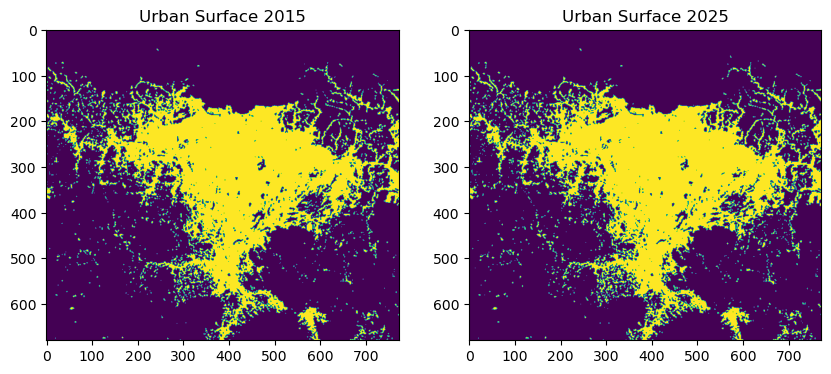

In [ ]:
bu_surface_file_early = interim_path/(case_city + f'_URB_urban_surface_{calibration_years[0]}_GHSL_150m.tif')
bu_surface_file_late = interim_path/(case_city + f'_URB_urban_surface_{calibration_years[1]}_GHSL_150m.tif')

# load the urban surface rasters, classify each cell using a majority filter
threshold = 0.3 
# APS 28.04.2026 I determined this threshold by testing different values and visually comparing the resulting binary rasters with World Urban Footprint binaries
# The threshold of 0.3 produced a binary raster that best captured the urban surface while minimizing noise and misclassification.

with rasterio.open(bu_surface_file_early,'r') as bu_surface_early:
    bu_surface_early_data = bu_surface_early.read(1)
    bu_surface_early_binary = majority_filter(bu_surface_early_data, size=3, threshold=threshold)

with rasterio.open(bu_surface_file_late,'r') as bu_surface_late:
    bu_surface_late_data = bu_surface_late.read(1)
    bu_surface_late_binary = majority_filter(bu_surface_late_data, size=3, threshold=threshold)

plot_ras_ras(bu_surface_early_binary, bu_surface_late_binary, title1=f'Urban Surface {calibration_years[0]}', title2=f'Urban Surface {calibration_years[1]}', AOI_gdf=AOI_gdf)


In [37]:
# export the binary rasters
data_type = rasterio.int16
no_data = 0
for raster, year in zip([bu_surface_early_binary, bu_surface_late_binary], calibration_years):
    out_file = case_city + f'_URB_urbanisation_{year}_GHSL_150m.tif'
    out_url = interim_path/out_file
    #print(out_url)
    
    with rasterio.open(ref_raster_path, 'r') as ref_export:
        try:
            transform = ref_export.transform
            with rasterio.open(
                out_url, "w",
                driver = "GTiff",
                crs = ref_export.crs,
                transform = transform,
                dtype = data_type,
                compress='lzw',
                count = 1,
                height = raster.shape[0],
                width = raster.shape[1]) as dst:
                dst.write(raster.astype(data_type), indexes=1)
            print("Raster written successfully:\n", out_url)
        except Exception as e:
            print('Raster export error:', e)

Raster written successfully:
 D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_URB_urbanisation_2015_GHSL_150m.tif
Raster written successfully:
 D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_URB_urbanisation_2025_GHSL_150m.tif


In [ ]:
#from ti_city_00_raster_functions import majority_filter
# import and reproject the GHSL raster to one specific year
year = '2010'
ghsl_path = external_data_path / 'WD GHSL Built S'
ghsl_file_single = ghsl_path /('GHS_BUILT_S_E'+str(year)+'_GLOBE_R2023A_WGS84_48S_150_V1_0_R10_C29.tif')
out_file_single = interim_path/(case_city + f'_URB_urban_surface_{year}_GHSL_150m.tif')
reproj_match(infile = ghsl_file_single,
             match = ref_raster_path,
             outfile = out_file_single,
             resampling=Resampling.bilinear)


root = Path.cwd()
if root.name == "notebooks":
    sys.path.insert(0, str(root))
else:
    sys.path.insert(0, str(root / "notebooks"))

threshold = 0.3 
with rasterio.open(out_file_single,'r') as bu_surface_single:
    bu_surface_single_data = bu_surface_single.read(1)
    bu_surface_single_binary = majority_filter(bu_surface_single_data, size=3, threshold=threshold)

out_file_binary = case_city + f'_URB_urbanisation_{year}_GHSL_150m.tif'
out_url = interim_path/out_file_binary
data_type = rasterio.int16
no_data = 0

# export the binary raster for the single year
with rasterio.open(ref_raster_path, 'r') as ref_export:
        try:
            transform = ref_export.transform
            with rasterio.open(
                out_url, "w",
                driver = "GTiff",
                crs = ref_export.crs,
                transform = transform,
                dtype = data_type,
                compress='lzw',
                count = 1,
                height = bu_surface_single_binary.shape[0],
                width = bu_surface_single_binary.shape[1]) as dst:
                dst.write(bu_surface_single_binary.astype(data_type), indexes=1)
            print("Raster written successfully:\n", out_url)
        except Exception as e:
            print('Raster export error:', e)

Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|
Raster written successfully:
 C:\Sciebo\05_GIS\JAK\interim\JAK_URB_urbanisation_2010_GHSL_150m.tif


In [ ]:
# generate a binary classification for that year
bu_surface_file_single = interim_path/(case_city + f'_URB_urban_surface_{year}_GHSL_150m.tif')


## calculate distances

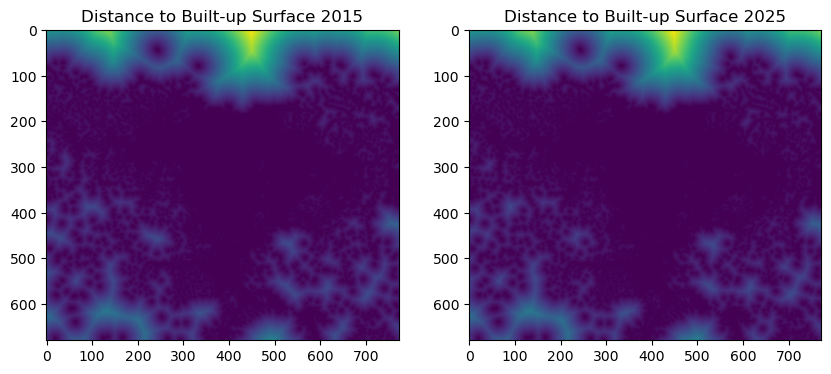

In [44]:
# import the files recently exported
data_source = 'GHSL' # options are 'WUF' or 'GHSL'
if data_source == 'WUF':
     #case_urb_1985 = case_city + '_URB_urbanisation_1985_EOC_WUF_150m.tif'
     case_urb_early = case_city + '_URB_urbanisation_2000_EOC_WUF_150m.tif'
     case_urb_late = case_city + '_URB_urbanisation_2015_EOC_WUF_150m.tif'

elif data_source == 'GHSL':
     case_urb_early = case_city + '_URB_urbanisation_' + str(calibration_years[0]) + '_GHSL_150m.tif'
     case_urb_late = case_city + '_URB_urbanisation_' + str(calibration_years[1]) + '_GHSL_150m.tif'
     #case_urb_2015 = None # we only have two calibration years for GHSL, so we won't have a raster for 2015


builtup_early_path = interim_path / case_urb_early
builtup_late_path = interim_path / case_urb_late

def calculate_distance(raster):
    with rasterio.open(raster, 'r') as src:
        data = src.read(1)
        data_inverted = np.where(data == 1, 0, 1)
        
        # Calculate the distance to the nearest road for each cell
        distance_raster = distance_transform_edt(data_inverted)
        # Assuming the raster's resolution is in meters, the distance_to_roads array now contains the distance in meters to the nearest road for each cell
        
        # normalize the raster by the min-max method
        distance_raster_normalized = (distance_raster - np.nanmin(distance_raster))/(np.nanmax(distance_raster) - np.nanmin(distance_raster))
        return distance_raster_normalized
#print(builtup_early_path,'\n', builtup_late_path)
distance_builtup_early = calculate_distance(builtup_early_path)
distance_builtup_late = calculate_distance(builtup_late_path)
plot_ras_ras(distance_builtup_early, distance_builtup_late, title1=f'Distance to Built-up Surface {calibration_years[0]}', title2=f'Distance to Built-up Surface {calibration_years[1]}', AOI_gdf = AOI_gdf)

## transform distance into utility

shape: (680, 772)
shape: (680, 772)


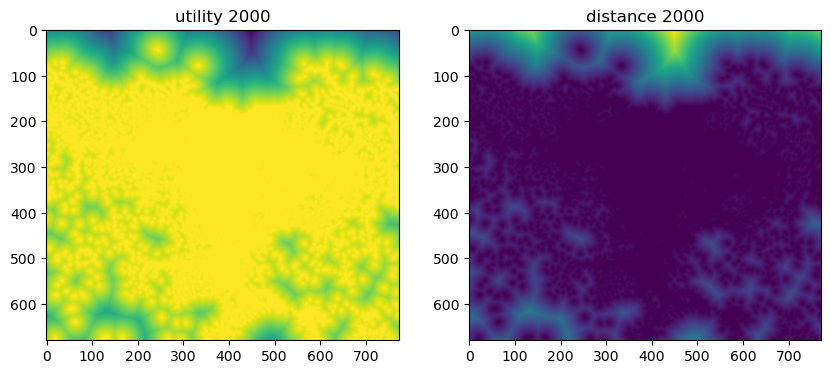

In [ ]:
##%run ./ti_city_00_raster_functions.ipynb
utility_builtup_early = utility_from_distance(distance_builtup_early)
utility_builtup_late = utility_from_distance(distance_builtup_late)
#plot_continuous_raster(utility_builtup_2000)
plot_ras_ras(utility_builtup_early, distance_builtup_early, title1='utility 2000', title2='distance 2000', AOI_gdf = AOI_gdf)

## export distances to tiff

In [ ]:
if data_source == 'WUF':
    distance_2000_file = case_city + '_URB_urbanisation_EOC_WUF_2000_distance_normal_150m.tif'
    distance_2015_file = case_city + '_URB_urbanisation_EOC_WUF_2015_distance_normal_150m.tif'
    #utility_2000_file = case_city + '_URB_utility_urbanisation_2000_EOC_WUF_150m.tif'
    #utility_2015_file = case_city + '_URB_utility_urbanisation_2015_EOC_WUF_150m.tif'
elif data_source == 'GHSL':
    distance_early_file = case_city + '_URB_urbanisation_' + str(calibration_years[0]) + '_GHSL_distance_normal_150m.tif'
    distance_late_file = case_city + '_URB_urbanisation_' + str(calibration_years[1]) + '_GHSL_distance_normal_150m.tif'
    utility_early_file = case_city + '_URB_utility_urbanisation_' + str(calibration_years[0]) + '_GHSL_150m.tif'
    utility_late_file = case_city + '_URB_utility_urbanisation_' + str(calibration_years[1]) + '_GHSL_150m.tif'
    

# export to tiff
# 2000 distance raster
raster_obj = distance_builtup_early
export_path = interim_path/distance_early_file
raster_data_type=rasterio.float32
export_raster(raster_obj,export_path,raster_data_type)

# 2015 distance raster
raster_obj = distance_builtup_late
export_path = interim_path/distance_late_file
raster_data_type=rasterio.float32
export_raster(raster_obj,export_path,raster_data_type)

# 2000 utility raster
raster_obj = utility_builtup_early
export_path = interim_path/utility_early_file
ref_raster=ref_raster
raster_data_type=rasterio.float32
export_raster(raster_obj,export_path,raster_data_type)

# 2015 utility raster
raster_obj = utility_builtup_late
export_path = interim_path/utility_late_file
ref_raster=ref_raster
raster_data_type=rasterio.float32
export_raster(raster_obj,export_path,raster_data_type)

## Copy the rasters to the model inputs folder

In [48]:
# APS, 01.11.2024: need to update the code below to use generic AOI definition
if data_source == 'WUF':
    #urb_raster_file_1985 = case_city + '_URB_urbanisation_1985_EOC_WUF_30m.tif'
    urb_raster_file_early = case_city + '_URB_urbanisation_2000_EOC_WUF_30m.tif'
    urb_raster_file_late = case_city + '_URB_urbanisation_2015_EOC_WUF_30m.tif'
    dist_raster_file_early = case_city + '_URB_distance_urbanisation_2000_EOC_WUF_30m.tif'
    dist_raster_file_late = case_city + '_URB_distance_urbanisation_2015_EOC_WUF_30m.tif'
elif data_source == 'GHSL':
    urb_raster_early_file = case_city + f'_URB_urbanisation_{(calibration_years[0])}_GHSL_150m.tif'
    urb_raster_late_file = case_city + f'_URB_urbanisation_{(calibration_years[1])}_GHSL_150m.tif'
    distance_early_file = case_city + f'_URB_urbanisation_{(calibration_years[0])}_GHSL_150m_distance_normal.tif'
    distance_late_file = case_city + f'_URB_urbanisation_{(calibration_years[1])}_GHSL_150m_distance_normal.tif'
    utility_early_file = case_city + f'_URB_utility_urbanisation_{(calibration_years[0])}_GHSL_150m.tif'
    utility_late_file = case_city + f'_URB_utility_urbanisation_{(calibration_years[1])}_GHSL_150m.tif'

file_copy_list = [urb_raster_early_file, urb_raster_late_file, distance_early_file, distance_late_file, utility_early_file, utility_late_file]
for file in file_copy_list:
    origin_path = interim_path / file
    destination_path = model_inputs_150m_path / file
    shutil.copy(origin_path, destination_path)
    print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_URB_urbanisation_2015_GHSL_150m.tif
D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_URB_urbanisation_2025_GHSL_150m.tif
D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_URB_urbanisation_2015_GHSL_150m_distance_normal.tif
D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_URB_urbanisation_2025_GHSL_150m_distance_normal.tif
D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_URB_utility_urbanisation_2015_GHSL_150m.tif
D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_URB_utility_urbanisation_2025_GHSL_150m.tif


# 4. Districts

## import and clip

In [ ]:
# import the GADM4 level 3 polygons from the shapefile
gadm_file_name = case_city + '_LIM_admin_boundaries_GADM_A.shp'

gadm_path = external_path / gadm_file_name
gadm_gdf = gpd.read_file(gadm_path)

# convert 'NAME_3' to a sequential number
gadm_gdf[gadm_var] = gadm_gdf[gadm_var].astype('category')
gadm_gdf['NAME_num'] = gadm_gdf[gadm_var].cat.codes
print('The max was', gadm_gdf['NAME_num'].max())

# Change the district with code 0 to one position after the max value.
# we'll use 0 as the NaN value in the urban growth model 
gadm_gdf.loc[gadm_gdf.NAME_num == 0, 'NAME_num'] = gadm_gdf['NAME_num'].max() + 1

print('The max is now', gadm_gdf['NAME_num'].max(),
      '. The values are\n',gadm_gdf['NAME_num'].sort_values().unique())

# plot the clipped vectors with random colours. 
# random colous script from https://www.statology.org/matplotlib-random-color/

var = 'NAME_num'
df = gadm_gdf
df.plot(var, color=np.random.rand(len(df[var]),3), label=var,legend=True)
plt.show()



NameError: name 'case_city' is not defined

## rasterize

Unique values [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185] 
Min value 0 , Type: int16
Too many unique values to plot a legend


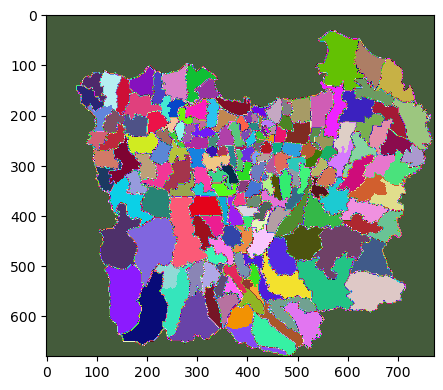

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb
# rasterize the clipped vectors
varray = rasterise_vector(
    vector=gadm_gdf, 
    ref_raster_path=ref_raster_path, 
    col='NAME_num', 
    default_value=0, 
    dtype=rasterio.int16)

# replace the nodata value with -9999
#varray_9999 = np.where(varray == 0, -9999, varray)

# plot the result
plot_unique_value_raster(varray)
#plot_unique_value_raster(varray_9999)

## export

In [80]:
file_name = case_city + '_LIM_districts_GADM4_150m.tif'

# export to tiff, interim folder
raster_obj = varray
export_path = interim_path/file_name
raster_data_type=rasterio.int16
export_raster(raster_obj,export_path,raster_data_type)

In [82]:
# export to ascii
file_name = case_city + '_LIM_districts_GADM4_150m.asc'

export_path = interim_path/file_name
ref_raster_path=ref_raster_path
raster_data_type=rasterio.int16
export_raster_to_ascii(varray, export_path, ref_raster_path,raster_data_type)

## Copy the rasters to the model inputs folder

In [83]:
file_copy_list = [file_name]

for file in file_copy_list:
    origin_path = interim_path / file
    destination_path = model_inputs_150m_path / file
    shutil.copy(origin_path, destination_path)
    print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_LIM_districts_GADM4_150m.asc


# 5. Calculate distances to urban facilities

In [3]:
# suppress deprecation warnings
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

distance_raster_list = []

### Roads

#### fetch roads

Features fetched 396330
Features without duplicates 394747
is_multilinestring
False    394169
Name: count, dtype: int64


<Axes: >

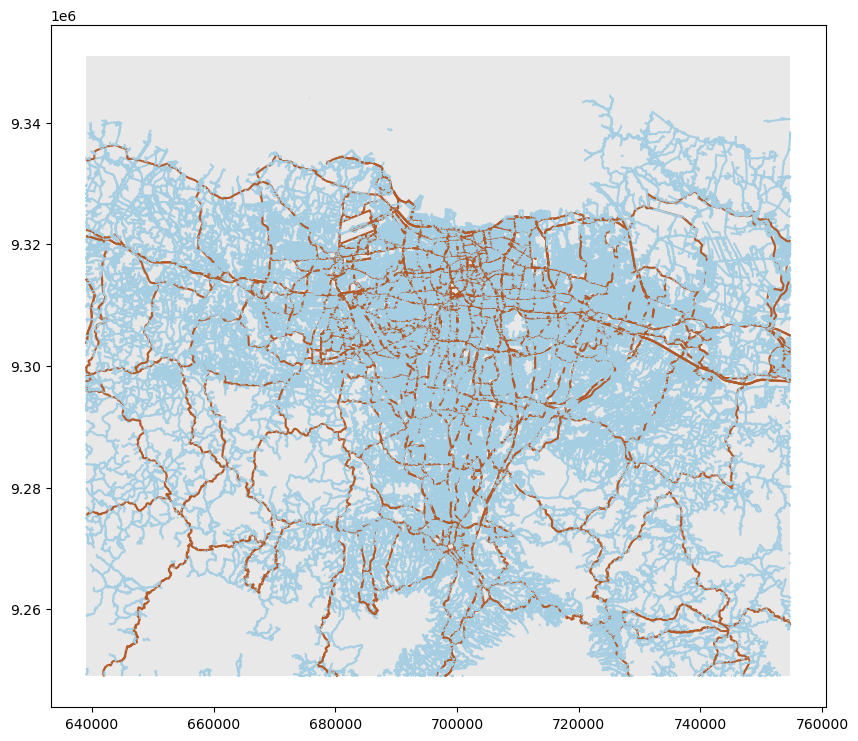

In [4]:
#%run ./ti_city_00_raster_functions.ipynb
# get road LineStrings from OSM
# List key-value pairs for tags
# more info at https://wiki.openstreetmap.org/wiki/Key:highway
tags = {'highway': ['primary', 'secondary', 'tertiary', 'residential', 'unclassified', 'trunk', 'motorway']} 
col_list = ['id','name','source','geometry', 'highway','surface','lanes','incline'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns
major_crit = {'highway': ['primary', 'secondary','trunk', 'motorway']} # when two keys are provided, the values are combined with an OR operator (i.e., union)
geom_type = 'LineString' # alternatives 'Point', 'LineString', 'Polygon', 'Mixed'

roads = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf) # the funciton converts the CRS to EPSG:4326

# convert the multistring geometries to simple linestrings
def is_multilinestring(geometry):
    return isinstance(geometry, MultiLineString)

roads = roads.explode()
roads['is_multilinestring'] = roads['geometry'].apply(is_multilinestring)
print(roads['is_multilinestring'].value_counts()) # if any MultiLineString remains, check again

roads.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) #linewidth=1,'place',

#### rasterize

In [9]:
print(ref_raster_150_path)
with rasterio.open(ref_raster_150_path, 'r') as ref_raster:
    ref_transform = ref_raster.transform
    ref_crs = ref_raster.crs
    ref_shape = (ref_raster.height, ref_raster.width)
    print('Reference raster shape:', ref_shape)
    print('Reference raster CRS:', ref_crs)
    print('Reference raster transform:', ref_transform)

..\data\processed\JAK_LIM_reference_AOI_150m.tif
Reference raster shape: (680, 772)
Reference raster CRS: EPSG:32748
Reference raster transform: | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|


In [10]:
#%run ./ti_city_00_raster_functions.ipynb
roads_major_raster, roads_full_raster, roads_distance_raster, roads_distance_raster_normalized = get_distance_raster(roads, ref_raster_150_path) #ref_raster_path)
#ref_raster_150_path
# Plot the outputs
#plot_vec_vec_ras_ras(roads, roads_full_raster, roads_distance_raster_normalized, 'roads')



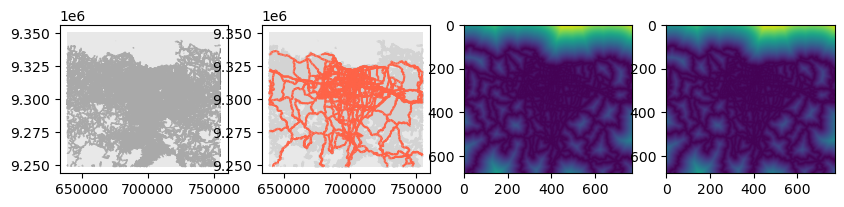

In [15]:
#plot_vec_vec_ras_ras(roads, roads_full_raster, roads_distance_raster_normalized, 'roads')
vector = roads
dist_raster = roads_distance_raster
norm_raster = roads_distance_raster_normalized

fig, ax = plt.subplots(nrows=1, ncols = 4, figsize = (10, 40))
vector.plot('major',ax=ax[0],color='grey', linewidth=1, zorder=1)
vector.loc[vector.major==0].plot(ax=ax[1],color='lightgrey', zorder=3)
vector.loc[vector.major==1].plot(ax=ax[1],color='tomato', zorder=4)
AOI_gdf.plot(ax=ax[0],  alpha=0.5, color='lightgray', zorder=1)
AOI_gdf.plot(ax=ax[1],  alpha=0.5, color='lightgray', zorder=1)
show(dist_raster, ax = ax[2])
show(norm_raster, ax = ax[3])

plt.show()


shape: (680, 772)


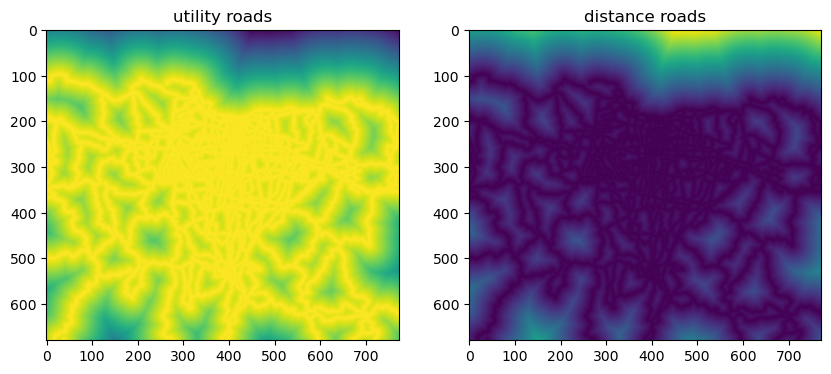

In [11]:
utility_roads = utility_from_distance(roads_distance_raster_normalized)
plot_ras_ras(utility_roads, roads_distance_raster_normalized, title1='utility roads', title2='distance roads', AOI_gdf = AOI_gdf)

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb
export_roads = True
roads_file_name = ''

if export_roads:
    roads_file_name = case_city + '_TRA_roads_OSM_2025'

    export_files(gdf=roads, 
                major_raster=roads_major_raster, 
                full_raster=None, 
                distance_raster=None, 
                utility_raster=None,
                out_path=interim_path, 
                file_name = roads_file_name)
    #export_files(gdf, major_raster=None, full_raster=None, distance_raster=None, utility=None, out_path=Path('./'), file_name='out_file'): #=interim_path

### health facilities

#### fetch health facilities

Features fetched 1165
Features without duplicates 1165


<Axes: >

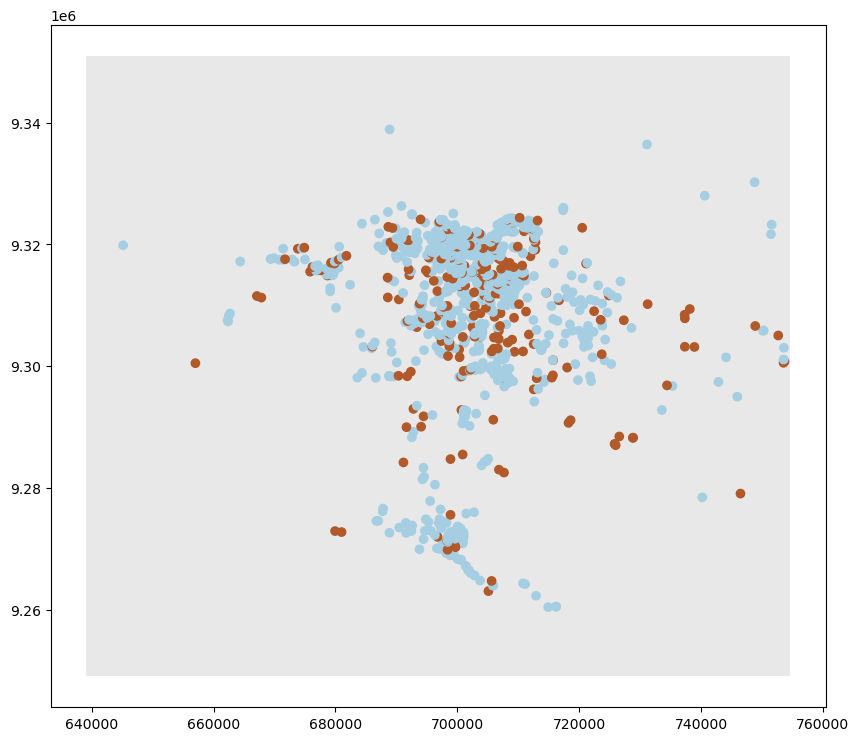

In [ ]:
# get health facility points from OSM
# List key-value pairs for tags
tags = {'healthcare': ['birthing_centre','centre', 'clinic', 'dentist', 'doctor','hospice','hospital','midwife','rehabilitation'], # see https://wiki.openstreetmap.org/wiki/Key:healthcare for more info
        'amenity':['clinic','doctors','dentist','hospital']}  # see https://wiki.openstreetmap.org/wiki/Key:amenity for more info
col_list = ['id','name','geometry','amenity','healthcare'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns'source',
major_crit = {'healthcare': ['hospital'],'amenity':['hospital']} # when two keys are provided, the values are combined with an OR operator (i.e., union)
geom_type = 'Point'

health = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)

health.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) #linewidth=1,'place',

#### rasterize health

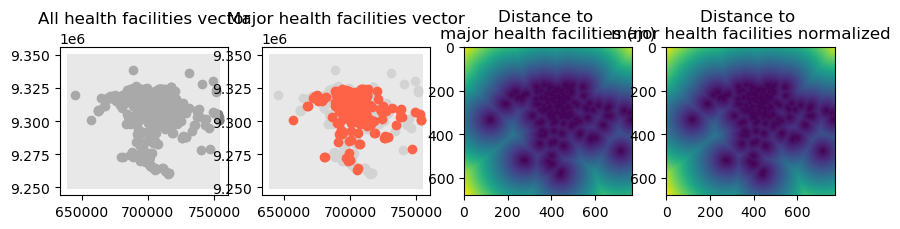

In [5]:
# rasterize and calculate Euclidian distances
health_major_raster, health_full_raster, health_distance_raster, health_dist_normalized = get_distance_raster(health, ref_raster_path)

# Plot the outputs
plot_vec_vec_ras_ras(health, health_distance_raster, health_dist_normalized, 'health facilities')



#### export health facilities

In [32]:
health_file_name = case_city + '_LOC_health_OSM_2025'

export_files(gdf=health, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=health_dist_normalized, 
             out_path=interim_path, 
             file_name = health_file_name)

#### 2015 data

In [30]:
def get_osm_attic_features(aoi, tag_dict, date, geom_type, major_dict, col_list):
    ox.settings.use_cache = False
    ox.settings.log_console = True # this does not work in a notebook setting

    if aoi.crs != 'EPSG:4326':
        aoi = aoi.to_crs(epsg=4326) 
    bbox = (aoi.bounds.values[0][0], # left
                aoi.bounds.values[0][1], # old south, now bottom
                aoi.bounds.values[0][2], # old east, now right
                aoi.bounds.values[0][3]) # old north, now top

    date = date
    ox.settings.overpass_settings = f'[out:json][timeout:{{timeout}}][date:"{date}"]{{maxsize}}'
    ox.settings.requests_timeout=720
    # increasing overpass memory to allow the low-efficiency query of OSM 'attic' data
    # WARNING: the ox.settings is a global setting and will affect all subsequent queries
    ox.settings.overpass_memory = "3G"

    # initialize an empty geodataframe
    temp_places = gpd.GeoDataFrame(columns=col_list, crs='EPSG:4326')

    
    for key, values in tag_dict.items():
        print(key, values)
        #print(type(values), values)
        tag_list = values
        for tag in range(len(tag_list)):
            print('Fetching', tag_list[tag])
            tags = {key: tag_list[tag]}
            print(tags)
            try:
                single_feature_from_tag = ox.features_from_bbox(bbox=bbox, # old north, now top
                                                        tags=tags)
                # append each tag to the features GeoDataFrame
                temp_places = pd.concat([temp_places, single_feature_from_tag], ignore_index=True)
            except Exception as e:
                print(f"Error retrieving data for tag '{tag}': {e}")
        
        # reset overpass settings to default
        ox.settings.overpass_settings = '[out:json][timeout:{timeout}]{maxsize}'
        geom_list = []

        for feature in temp_places["geometry"]:
                if isinstance(feature, Polygon):
                        geom_list.append('Polygon')
                else:
                        geom_list.append('Point')
        
        if (geom_type == 'Mixed') & ('Polygon' in geom_list) & ('Point' in geom_list): # I am not sure we need this. Perhaps leave only the "catch all" conversion to points as the default
            temp_places["geometry"] = temp_places.centroid 
            temp_places = temp_places.loc[:, col_list]
            #temp_places.drop_duplicates('osmid',inplace=True)
            print('Attention: Mixed geometry types found, will be converted to points')
        elif (geom_type == 'Mixed'):
            print(temp_places["geometry"].type.unique())
            temp_places["geometry"] = temp_places.centroid 
            temp_places = temp_places.loc[:, col_list]
            print('Attention: Mixed geometry types found, only centroids will be fetched')
        else: 
            temp_places = temp_places.loc[(temp_places.geometry.type==geom_type), col_list]
        
        print('Features fetched',temp_places.shape[0])
        temp_places.reset_index(inplace=True)
        # filtering out the repeated entries
        temp_places.drop_duplicates('id', inplace=True) # the calls to drop_duplicates are separate to avoid getting the union of all conditions
        temp_places.drop_duplicates('geometry', inplace=True) # 
        temp_places.loc[temp_places['name'].notnull(),:].drop_duplicates('name', inplace=True) # 
        
        print('Features without duplicates',temp_places.shape[0])
        #convert the CRS of roads to the same as AOI
        temp_places.to_crs(aoi.crs,inplace=True)
        
        # clip features to the AOI
        places = gpd.clip(temp_places, mask=aoi, keep_geom_type=True)
        
        places['major'] = 0
        
        # identify major features based on the criteria dictionary
        for key, value in major_dict.items():
            places.loc[places[key].isin(value), 'major'] = 1
            
        return places

tags = {'healthcare': ['birthing_centre','centre', 'clinic', 'dentist', 'doctor','hospice','hospital','midwife','rehabilitation','yes'], # see https://wiki.openstreetmap.org/wiki/Key:healthcare for more info
        'amenity':['clinic','doctors','dentist','hospital']}  # see https://wiki.openstreetmap.org/wiki/Key:amenity for more info
col_list = ['id','name','geometry','amenity','healthcare'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns'source',
major_crit = {'healthcare': ['hospital'],'amenity':['hospital']} # when two keys are provided, the values are combined with an OR operator (i.e., union)
geom_type = 'Point'
date = "2015-01-01T00:00:00Z"

health_2015 = get_osm_attic_features(
     aoi = AOI_gdf, 
     tag_dict = tags, 
     date = date, 
     geom_type = geom_type, 
     major_dict = major_crit, 
     col_list = col_list)

#health_2015.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray')) #linewidth=1,'place',

healthcare ['birthing_centre', 'centre', 'clinic', 'dentist', 'doctor', 'hospice', 'hospital', 'midwife', 'rehabilitation', 'yes']
Fetching birthing_centre
{'healthcare': 'birthing_centre'}
Error retrieving data for tag '0': No matching features. Check query location, tags, and log.
Fetching centre
{'healthcare': 'centre'}
Error retrieving data for tag '1': No matching features. Check query location, tags, and log.
Fetching clinic
{'healthcare': 'clinic'}
Error retrieving data for tag '2': No matching features. Check query location, tags, and log.
Fetching dentist
{'healthcare': 'dentist'}
Error retrieving data for tag '3': No matching features. Check query location, tags, and log.
Fetching doctor
{'healthcare': 'doctor'}
Error retrieving data for tag '4': No matching features. Check query location, tags, and log.
Fetching hospice
{'healthcare': 'hospice'}
Error retrieving data for tag '5': No matching features. Check query location, tags, and log.
Fetching hospital
{'healthcare': 'hos

#### Distance cost function

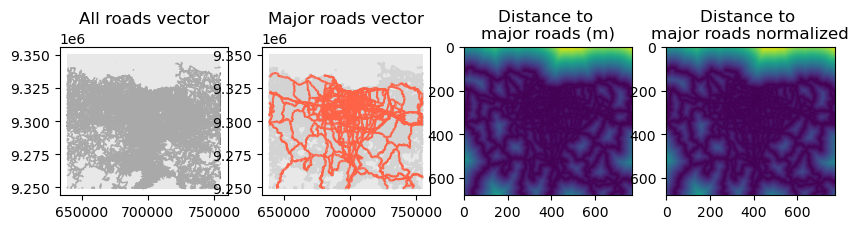

In [ ]:
# rasterize roads with 150 m resolution
#%run ./ti_city_00_raster_functions.ipynb
roads_major_raster_150, roads_full_raster_150, roads_distance_raster_150, roads_distance_raster_normalized_150 = get_distance_raster(roads, ref_raster_150_path)

# Plot the outputs
plot_vec_vec_ras_ras(roads, roads_distance_raster_150, roads_distance_raster_normalized_150, 'roads')



In [10]:
# calculate the cost raster
# we'll add the slope, landuse classes (urban = 1, vegetated =2, and forest 4, each with a weight)
"""Calculate accumulated cost raster using slope, land use, waterbodies, and road network

    Args:
        roads_full_raster: Pre-calculated raster of road network, paved=1, unpaved=2, and no road=10
        landuse_raster: Pre-calculated raster of land use, urban=1, vegetated=2, and forest=4
        slope_raster_path: Path to slope raster file, in percent
        riverbeds_raster: Pre-calculated raster of riverbeds (100 m buffer around rivers)
        

        ref_raster_path: Path to reference raster for alignment
        wt_roads: Weight for road cells (default=1)
        wt_no_roads: Weight for non-road cells (default=100)
        wt_slope: Weight multiplier for slope influence (default=1)

    Returns:
        Accumulated cost raster and normalized accumulated cost raster
    """

'Calculate accumulated cost raster using slope, land use, waterbodies, and road network\n\n    Args:\n        roads_full_raster: Pre-calculated raster of road network, paved=1, unpaved=2, and no road=10\n        landuse_raster: Pre-calculated raster of land use, urban=1, vegetated=2, and forest=4\n        slope_raster_path: Path to slope raster file, in percent\n        riverbeds_raster: Pre-calculated raster of riverbeds (100 m buffer around rivers)\n        \n\n        ref_raster_path: Path to reference raster for alignment\n        wt_roads: Weight for road cells (default=1)\n        wt_no_roads: Weight for non-road cells (default=100)\n        wt_slope: Weight multiplier for slope influence (default=1)\n\n    Returns:\n        Accumulated cost raster and normalized accumulated cost raster\n    '

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb

raster_file=case_city + '_DEM_slope_pct_TanDEM_X_150m.tif'
slope_raster_path = model_inputs_150m_path / raster_file

acc_cost, acc_norm_cost = get_weight_distance_raster(path_raster=roads_full_raster_150,
                                                       gdf_origin_points=health[health.major == 1], 
                                                       slope_raster_path=slope_raster_path,
                                                       ref_raster_path=ref_raster_150_path,
                                                       wt_roads=1, wt_no_roads=100, wt_slope=1)	

# Plot the outputs
plot_continuous_raster(acc_norm_cost, title='Accumulated cost raster')

RasterioIOError: D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_150m\JAK_DEM_slope_pct_TanDEM_X_150m.tif: No such file or directory

(1078, 846)
Min value: 0.0 , Max value: 361671.0551403034


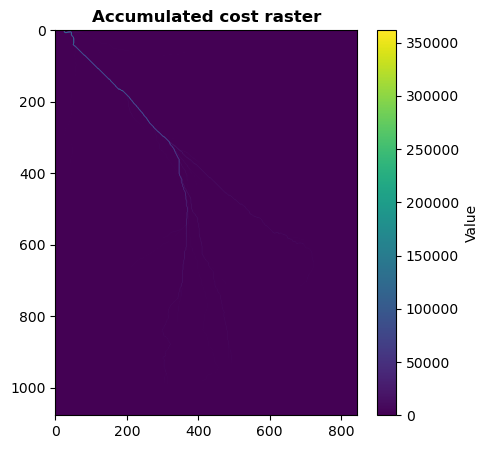

In [ ]:
print(acc_cost.shape)
plot_continuous_raster(acc_cost, title='Accumulated cost raster')

In [ ]:
# export to tiff
file_name = case_city + '_LOC_acc_cost_distance_health_30m.tif'

with rasterio.open(ref_raster_150_path, 'r') as ref_raster:
    export_geotiff(
        raster= acc_cost, 
        out_transform = ref_raster.transform,
        out_meta = ref_raster.meta,
        export_path = interim_path / file_name,
        data_type = rasterio.float32)

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MAN\interim\MAN_LOC_acc_cost_distance_health_30m.tif


In [ ]:
#run ./ti_city_00_raster_functions.ipynb

origin_points = health[health.major == 1]
raster_file = case_city + '_DEM_slope_deg_TanDEM_X_30m.tif'
slope_raster_path = processed_path / raster_file

healht_cost_distance_raster, healht_cost_dist_raster_norm = get_weight_distance_raster_6(path_raster=roads_full_raster, 
                                                                                                 slope_raster_path = slope_raster_path,
                                                                                                 gdf_origin_points = origin_points, 
                                                                                                 ref_raster_path=ref_raster_path, 
                                                                                                 wt_roads=1, 
                                                                                                 wt_no_roads=100)

slope: (4235, 2975)
slope normal: (4235, 2975)
path (4235, 2975)
origin: (4235, 2975)
cost: (4235, 2975)
origin length 1564 , 
origin first index: (28, 1451) , 
origin last index: (4106, 1811) , 
origin type <class 'tuple'>
densest_point: (0, 302)
empty cost raster: (4235, 2975)
Error in function: start points must all be within the costs array


In [ ]:
healht_cost_dist_raster_norm.show()

AttributeError: 'NoneType' object has no attribute 'show'

AttributeError: 'NoneType' object has no attribute 'ndim'

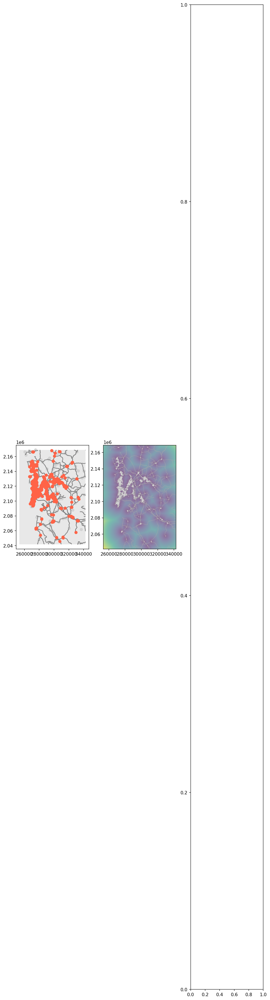

In [ ]:
plot_compare_rasters(vector = health, 
                     roads_vector = roads, 
                     dist_raster = health_dist_normalized, 
                     norm_raster = healht_cost_dist_raster_norm, 
                     title = 'health',
                     AOI_gdf = AOI_gdf,
                     ref_raster_path = ref_raster_path)

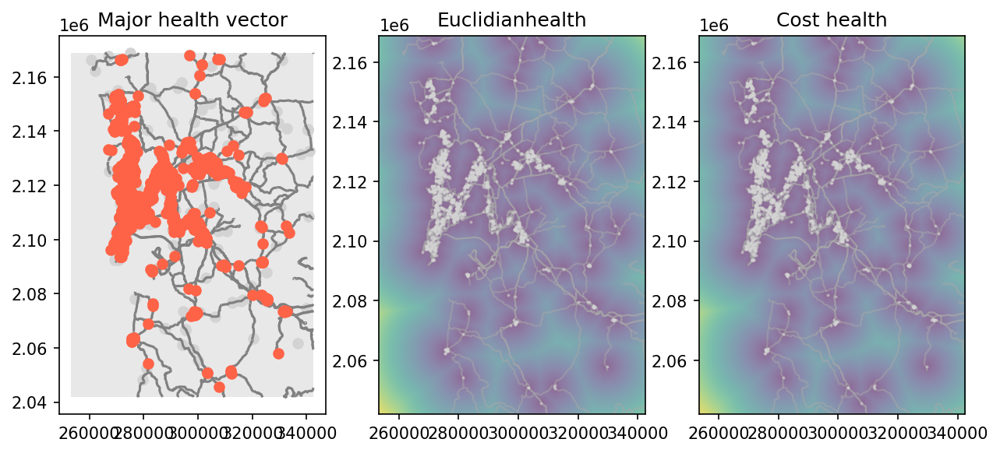

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb


### schools

#### fetch schools

Features fetched 1609
Features without duplicates 1609


<Axes: >

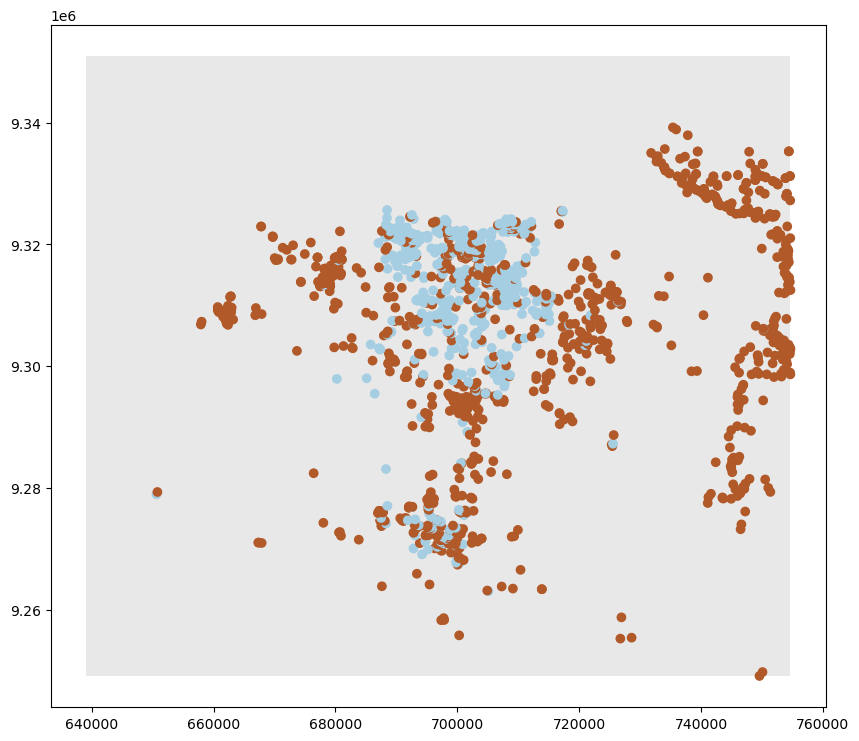

In [16]:
# get schools points from OSM
# List key-value pairs for tags
tags = {'amenity': ['kindergarten','college', 'university', 'school','language_school','music_school','dancing_school','prep_school','training']} # see https://wiki.openstreetmap.org/wiki/Tag:amenity=school for more info
col_list = ['id','name','geometry','amenity', 'isced:level'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns'source',
major_crit = {'amenity': ['college', 'university', 'school']}
geom_type = 'Point'

schools = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)
schools.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) #linewidth=1,'place',

#### rasterize

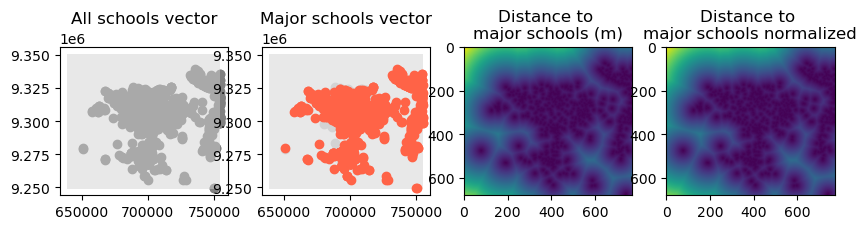

In [18]:
# rasterize and calculate distances
schools_major_raster, schools_full_raster, schools_distance_raster, schools_dist_normalized = get_distance_raster(schools, ref_raster_path)

# Plot the outputs
plot_vec_vec_ras_ras(schools, schools_distance_raster, schools_dist_normalized, 'schools')

#### export schools

In [31]:
schools_file_name = case_city + '_LOC_schools_OSM_2025'

export_files(gdf=schools, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=schools_dist_normalized, 
             out_path=interim_path, 
             file_name = schools_file_name)

### suburban_centres

#### fetch suburban_centres

Features fetched 1981
Features without duplicates 1981


<Axes: >

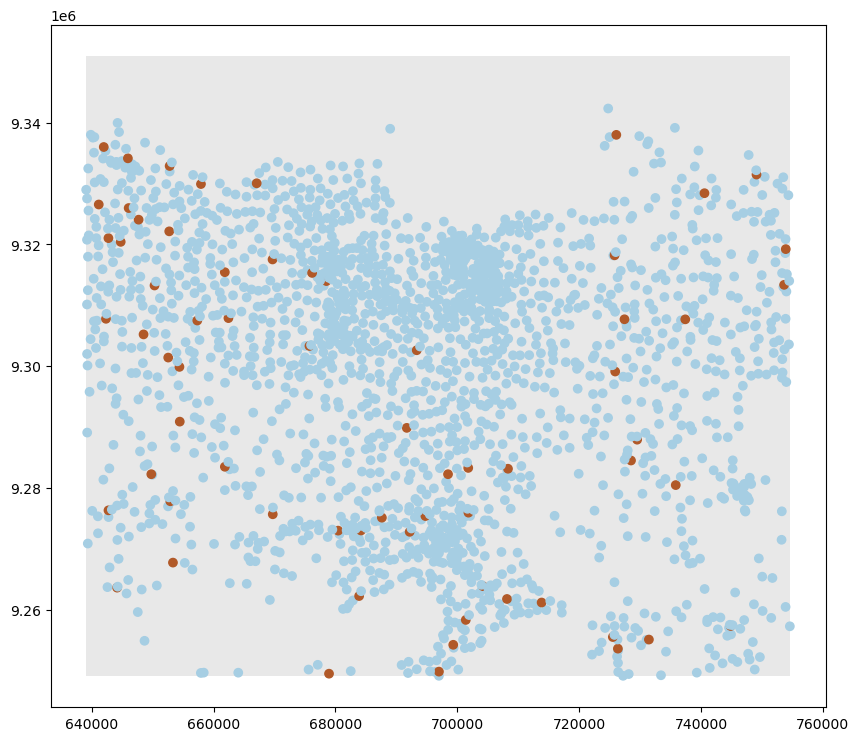

In [21]:
# get health facility points from OSM
# List key-value pairs for tags
tags = {'place': ['town', 'village', 'hamlet']} # see https://wiki.openstreetmap.org/wiki/Key:place for more info, #'city',
col_list = ['id','name','geometry', 'place','population'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns
major_crit = {'place':['town']} # other candidates'village', 'hamlet'
geom_type = 'Point'

suburbs = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)

#plot them
suburbs.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) 

#### rasterize

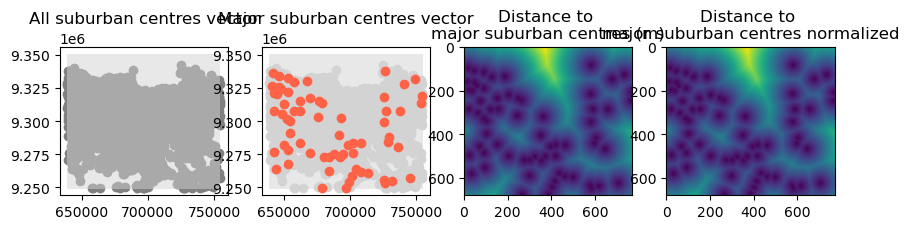

In [22]:
# rasterize and calculate distances
suburbs_major_raster, suburbs_full_raster, suburbs_distance_raster, suburbs_dist_normalized = get_distance_raster(suburbs, ref_raster_path)

# Plot the outputs
plot_vec_vec_ras_ras(suburbs, suburbs_distance_raster, suburbs_dist_normalized, 'suburban centres')

#### export suburban_centres

In [23]:
suburban_file_name = case_city + '_LOC_suburban_centres_OSM_2025'

export_files(gdf=suburbs, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=suburbs_dist_normalized, 
             out_path=interim_path, 
             file_name = suburban_file_name)

### shopping_malls

#### fetch shopping_malls

Features fetched 91
Features without duplicates 91


<Axes: >

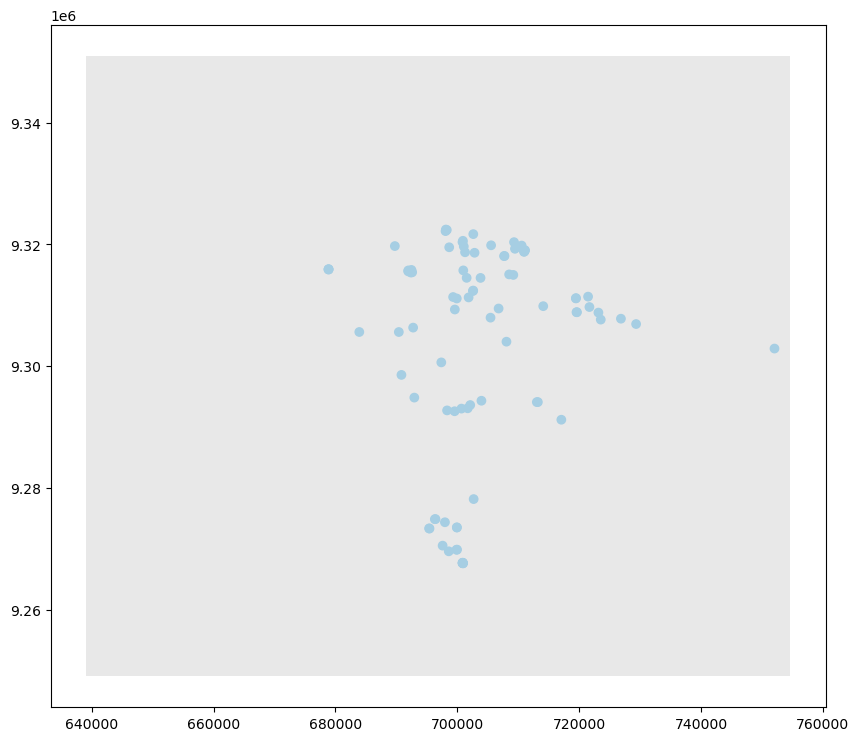

In [24]:
# get health facility points from OSM
# List key-value pairs for tags
tags = {'shop': ['mall']} # see https://wiki.openstreetmap.org/wiki/Tag:shop%3Dmall for more info, #'city',
col_list = ['id','name','geometry','shop'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns
major_crit = {'shop':['mall']}
geometry_type = 'Mixed'

malls = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)

malls.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) 

#### rasterize

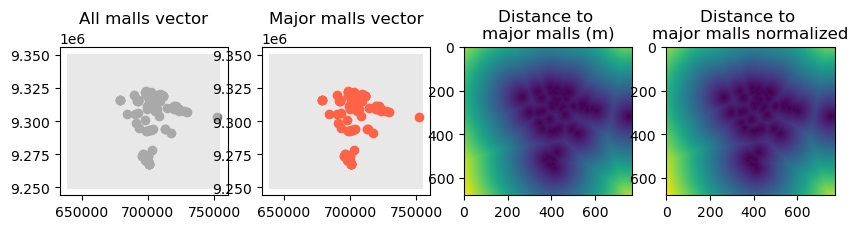

In [25]:
# rasterize and calculate distances
malls_major_raster, malls_full_raster, malls_distance_raster, malls_dist_normalized = get_distance_raster(malls, ref_raster_path)

# Plot the outputs
plot_vec_vec_ras_ras(malls, malls_distance_raster, malls_dist_normalized, 'malls')

#### export shopping_malls

In [30]:
malls_file_name = case_city + '_LOC_malls_OSM_2025'

export_files(gdf=malls, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=malls_dist_normalized, 
             out_path=interim_path, 
             file_name = malls_file_name)

### markets

#### fetch markets

Attention: Mixed geometry types found, will be converted to points
Features fetched 467
Features without duplicates 463


<Axes: >

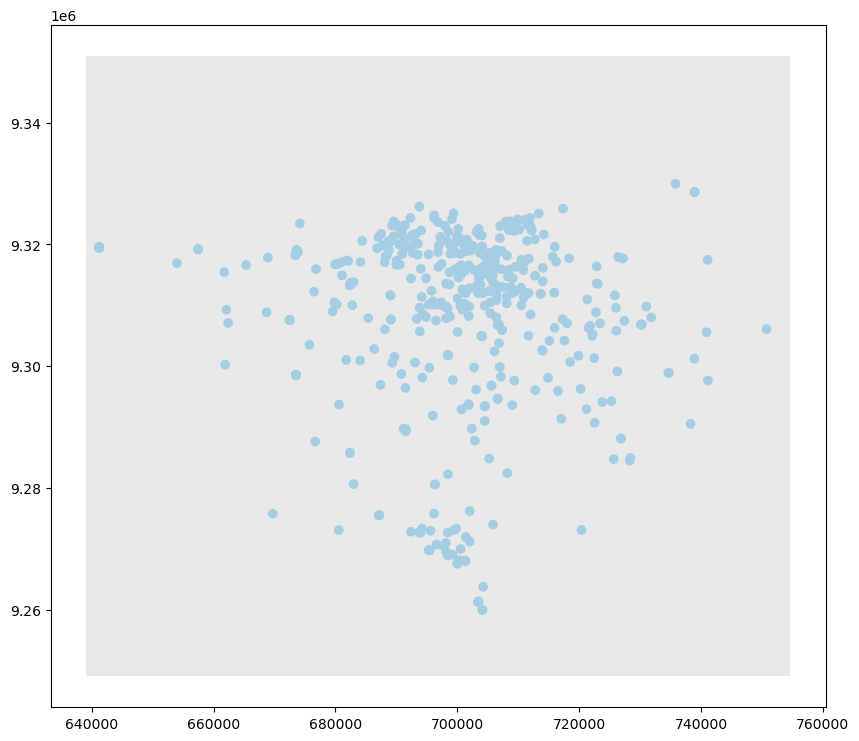

In [ ]:
# get health facility points from OSM
# List key-value pairs for tags
tags = {'amenity': ['marketplace']} # see https://wiki.openstreetmap.org/wiki/Tag:amenity%3Dmarketplace for more info, #'city',
col_list = ['id','name','geometry','amenity'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns
major_crit = {'amenity':['marketplace']} 
geom_type = 'Mixed'

markets = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)

#plot them
markets.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) 

#### rasterize

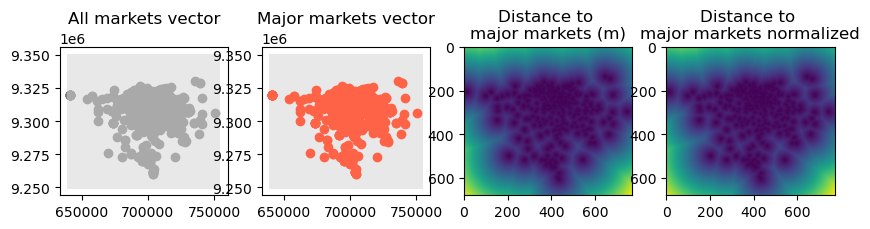

In [28]:
# rasterize and calculate distances
markets_major_raster, markets_full_raster, markets_distance_raster, markets_dist_normalized = get_distance_raster(markets, ref_raster_path)

# Plot the outputs
plot_vec_vec_ras_ras(markets, markets_distance_raster, markets_dist_normalized, 'markets')

#### export markets

In [29]:
markets_file_name = case_city + '_LOC_markets_OSM_2025'

export_files(gdf=markets, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=markets_dist_normalized, 
             out_path=interim_path, 
             file_name = markets_file_name)

### airport

#### fetch airport

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb

Attention: Mixed geometry types found, will be converted to points
Features fetched 10
Features without duplicates 10


<Axes: >

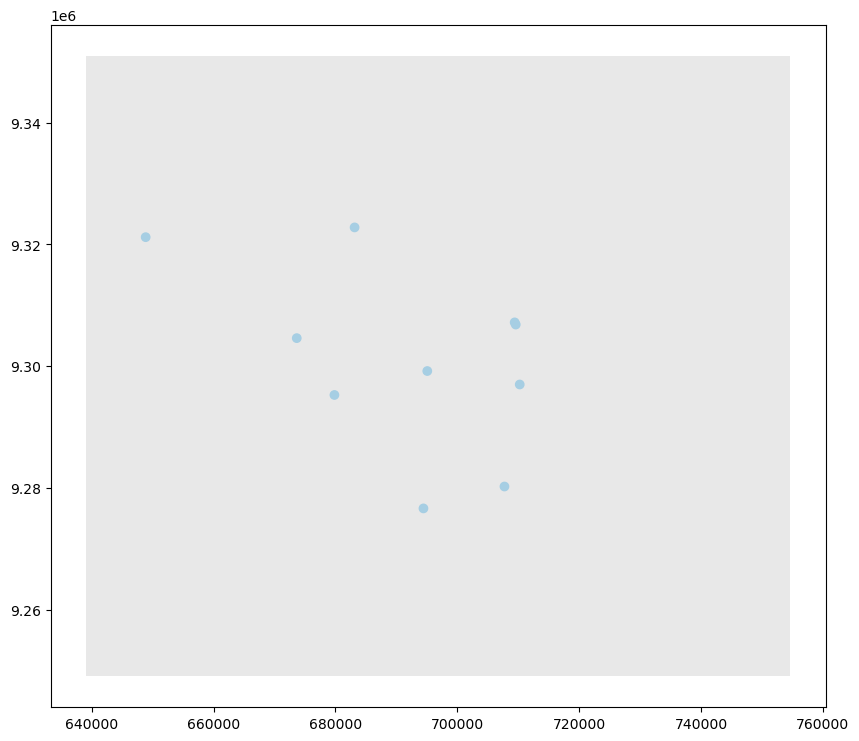

In [33]:
tags = {'aeroway': ['aerodrome','airstrip']} # see https://wiki.openstreetmap.org/wiki/Tag:aeroway%3Daerodrome for more info
col_list = ['id','name','geometry','aeroway','aerodrome:type'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns
major_crit = {'aeroway': ['aerodrome']} 
geometry_type = 'Mixed'

airports = get_osm_features(tags, col_list, geometry_type, major_crit, AOI_gdf)

#plot them
airports.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) 

#### rasterize

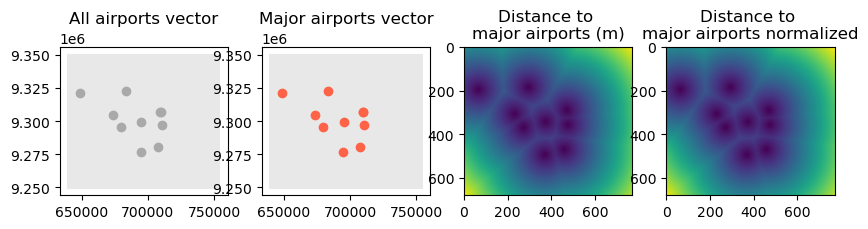

In [34]:
# rasterize and calculate distances
airports_major_raster, airports_full_raster, airports_distance_raster, airports_dist_normalized = get_distance_raster(airports, ref_raster_path)
# Plot the outputs
plot_vec_vec_ras_ras(airports, airports_distance_raster, airports_dist_normalized, 'airports')


#### export airport

In [35]:
airport_file_name = case_city + '_LOC_airports_OSM_2025'

export_files(gdf=airports, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=airports_dist_normalized, 
             out_path=interim_path, 
             file_name = airport_file_name)

### cbd

#### fetch cbd

In [45]:
## ATTENTION: there is no standardised definition of OSM tags for CBDs. We need to define for each case.

# get CBD points from OSM
# List key-value pairs for tags
tags = {'landuse': ['commercial','retail','industrial']} # see https://wiki.openstreetmap.org/wiki/Key:landuse for more info,
col_list = ['id','name','geometry','landuse'] #OSM has hundreds of cols, we just want a few. For info, check roads.columns
# finding the CBDs is tricky as there is no official tag for it in OSM
# hence, we define a ad hoc list of OSM names for the areas that we consider as CBDs

if case_city == 'MUM':
    # source: https://www.99acres.com/articles/the-cbds-in-Mumbai.html) and validated locally.
    name_list = ['CBD Belapur East','One BKC','Lodha Supremus','Peninsula Business Park','Tata Consultancy Services - TCS']  # other candidates: 'CIDCO Office - Kharghar', 
if case_city == 'MAN':
    # source: https://santosknightfrank.com/blogs/top-central-business-districts-in-metro-manila/) and validated locally.
    # source: https://weavergroup.ph/central-business-districts-an-overview-of-the-commercial-real-estate-in-metro-manila/ 
    name_list = ['BDO Corporate Center','Seda BGC','Metrobank Plaza',
                 'SM Mall of Asia','Filinvest Corporate City Marketing Office & Exhibit Center','Araneta City']
if case_city == 'JAK':
    # source: https://www.99acres.com/articles/central-business-districts-in-jakarta/) and validated locally.
    # source: https://www.flokq.com/blog/en/cbd-the-golden-triangle
    name_list = ['18 Parc Place','Mega Kuningan','Epiwalk Rasuna Epicentrum','Thamrin Nine']

major_crit = {'name': name_list} 
geom_type = 'Mixed'

cbd = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)
cbd_selected = cbd.loc[cbd.name.isin(name_list),:]

print('++++++++++++++++++++++++++++++++++++++++++++++++\n',len(name_list), len(cbd_selected))
for i in name_list:
    print(i)
cbd_selected

Attention: Mixed geometry types found, will be converted to points
Features fetched 3763
Features without duplicates 3694
++++++++++++++++++++++++++++++++++++++++++++++++
 4 4
18 Parc Place
Mega Kuningan
Epiwalk Rasuna Epicentrum
Thamrin Nine


,id,name,geometry,landuse,major
3191,1244589761,18 Parc Place,POINT (700284.841 9311045.318),commercial,1
2711,755299424,Mega Kuningan,POINT (701999.465 9311122.202),commercial,1
69,17448024,Epiwalk Rasuna Epicentrum,POINT (703034.463 9312401.91),retail,1
968,482904038,Thamrin Nine,POINT (701487.673 9314503.097),commercial,1


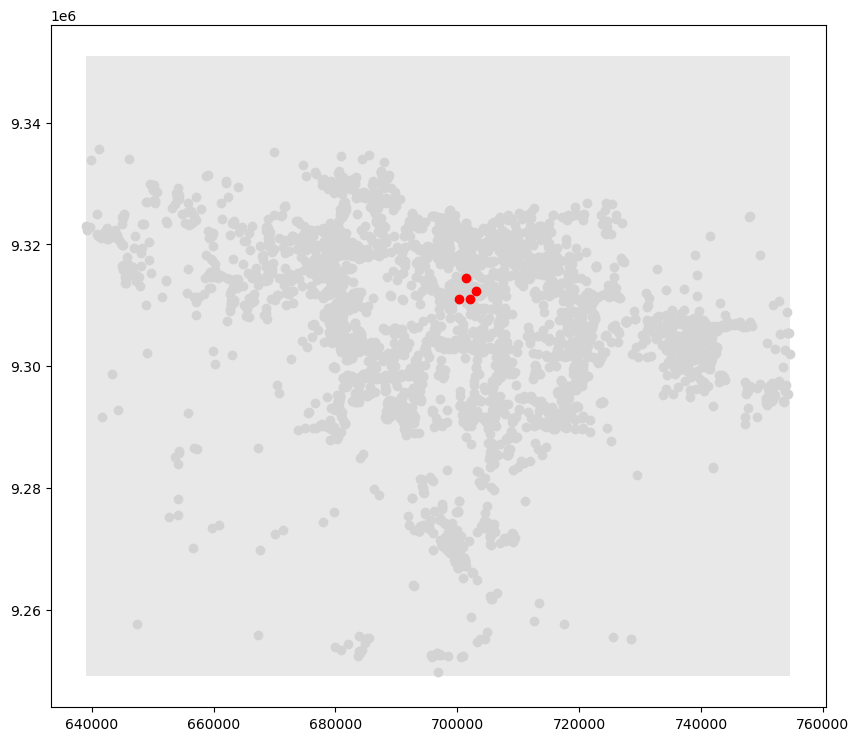

In [46]:
#plot them
f = plt.figure(figsize=(10, 10))
ax=f.add_subplot(111)

#cbd.loc[(cbd.major==1),:].plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired', zorder=1)
ax.plot(cbd.centroid.x,cbd.centroid.y,'o',color='lightgrey', marker='o', zorder=2) #cmap='Paired',
AOI_gdf.plot(ax=ax,  alpha=0.5, color='lightgray', zorder=1)
ax.plot(cbd_selected.centroid.x,cbd_selected.centroid.y, 'ro', zorder=3)
plt.show()

#### rasterize

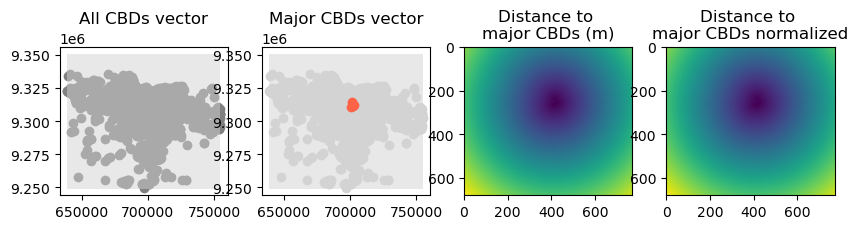

In [48]:
# rasterize and calculate distances
cbd_major_raster, cbd_full_raster, cbd_distance_raster, cbd_dist_normalized = get_distance_raster(cbd, ref_raster_path)

# Plot the outputs
plot_vec_vec_ras_ras(cbd, cbd_distance_raster, cbd_dist_normalized, 'CBDs')


#### export cbd

In [49]:
cbd_file_name = case_city + '_LOC_CBDs_OSM_2025'

export_files(gdf=cbd, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=cbd_dist_normalized, #
             out_path=interim_path, 
             file_name = cbd_file_name)

## Copy all the distance rasters to the model input folder

In [57]:
raster_list = [roads_file_name + '_distance_normal_150m.tif', 
               roads_file_name + '_major_150m.tif',
               health_file_name + '_distance_normal_150m.tif', 
               schools_file_name + '_distance_normal_150m.tif', 
               suburban_file_name + '_distance_normal_150m.tif', 
               malls_file_name + '_distance_normal_150m.tif', 
               markets_file_name + '_distance_normal_150m.tif', 
               airport_file_name + '_distance_normal_150m.tif', 
               cbd_file_name + '_distance_normal_150m.tif']

for file in raster_list:
    file_name = file 
    origin_path = interim_path / file_name
    destination_path = model_inputs_150m_path / file_name
    shutil.copy(origin_path, destination_path)
    print(str(destination_path))

FileNotFoundError: [Errno 2] No such file or directory: 'D:\\Dropbox\\x\\PostDoc\\23 10 LMU\\13 exp_cases\\24 01 Urban SSP MAN MUM JAK\\05_GIS_temp\\JAK\\interim\\JAK_TRA_roads_OSM_2025_distance_normal_150m.tif'

# 6. Cost-distance function

#### Fetch green areas from the LCZ classification

The reprojected LCZ raster already exists
Unique values [0 1] 
Min value 0 , Type: int64


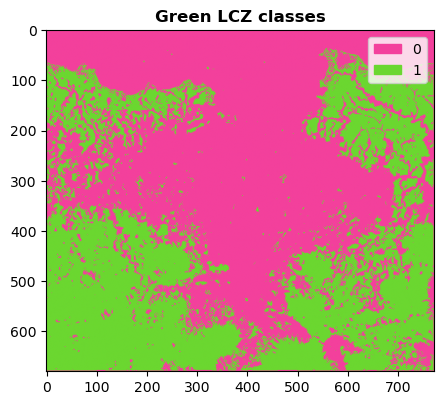

In [40]:
# import the LCZ classification. We'll work with Demuzere et al., 2022,  because it has global coverage
# paper: https://essd.copernicus.org/articles/14/3835/2022/
# data https://zenodo.org/records/8419340

#check if the reprojected file exists
reproj_lcz_file = case_city + '_URB_LCZ_classification_Demuzere_2022_150m.tif'
if (interim_path / reproj_lcz_file).exists():
    print('The reprojected LCZ raster already exists')
    greens_lcz_path = interim_path / reproj_lcz_file
    
else:
    original_lcz_file = case_city + '_URB_LCZ_classification_Demuzere_2022.tif'
    original_lcz_path = interim_path / original_lcz_file

    greens_lcz_path = Path('')

    # check if the LCZ raster needs reprojection and resampling
    with rasterio.open(original_lcz_path) as src:
            original_lcz_shape = src.read(1).shape
    with rasterio.open(ref_raster_150_path) as src:
        ref_raster = src.read(1)
        good_shape = src.shape
    if original_lcz_shape != good_shape:
        print('Attention: the LCZ raster shape is different from the reference raster')
        print('LCZ raster shape:', original_lcz_shape, 'ref raster shape:', good_shape)
        reproj_raster_name = original_lcz_file.replace('.tif','_150m.tif')
        print('Reprojecting and resampling the LCZ raster to match the reference raster')
            
        # reproject and resample the LCZ raster to match the reference raster
        reproj_match(infile = original_lcz_path, 
                    match = ref_raster_150_path, 
                    outfile = greens_lcz_path, 
                    resampling=Resampling.nearest)
        with rasterio.open(interim_path / reproj_raster_name) as src:
            greens_lcz_150_path = interim_path / reproj_raster_name
            greens_lcz_150_raster = src.read(1)
            #fig, ax = plt.subplots(1, 2, figsize=(10, 10))
            with rasterio.open(greens_lcz_path) as src:
                original_lcz_raster = src.read(1)
                plot_unique_value_raster(original_lcz_raster, title='Original LCZ classes') #, ax=ax[0]
                plot_unique_value_raster(greens_lcz_150_raster, title='Reprojected LCZ classes') #, ax=ax[1]
                

    else:
        print('The LCZ raster shape matches the reference raster')
        print('LCZ raster shape:', src.shape, 'ref raster shape:', ref_raster_150_path.shape)
        plot_unique_value_raster(greens_lcz_path, title='LCZ classes')
        greens_lcz_path = original_lcz_path

with rasterio.open(greens_lcz_path) as src:
        greens_lcz_raster = src.read(1)
        greens_lcz_meta = src.meta
# reclass the raster to green (1) and non-green (0) (11 = Dense trees, 12 = Scattered trees , 13 = Brush, scrub, 14 = Low plants)
greens_raster = np.where((greens_lcz_raster == 11)|(greens_lcz_raster == 12)|(greens_lcz_raster == 13)|(greens_lcz_raster == 14), 1, 0) 
# plot the LCZ raster
plot_unique_value_raster(greens_raster, title='Green LCZ classes') #, ax=ax[1]

### Urban

Unique values [-1  0] 
Min value -1 , Type: int64


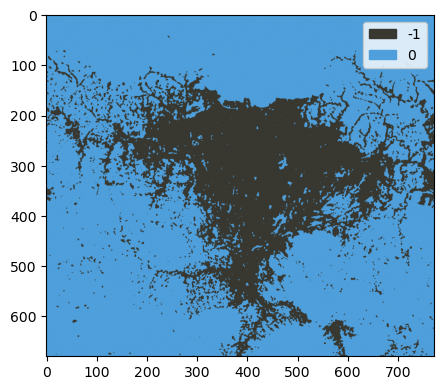

In [29]:
# import the urban areas raster
urban_file = case_city + '_URB_urbanisation_2015_GHSL_150m.tif'
urban_path = interim_path / urban_file

with rasterio.open(urban_path) as src:
    urban = src.read(1)
    urban_meta = src.meta

urban = np.where(urban == 1,-1, 0)
plot_unique_value_raster(urban)

### Roads

Unique values [-2  0] 
Min value -2 , Type: int16


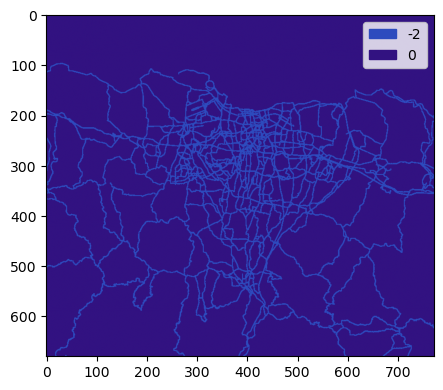

In [31]:
# detect if roads gdf exists
if 'roads' not in globals():
    roads_file_name = case_city + '_TRA_roads_OSM_2025_L.shp'
    roads_path = interim_path / roads_file_name
    roads = gpd.read_file(roads_path).to_crs(AOI_gdf.crs)
    
roads_cost_vector = roads.loc[:,['major','geometry']].copy()
roads_cost_vector['major'] = roads_cost_vector['major'] + 1
# roads_cost_vector.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) #linewidth=1,'place',

# add a 100 m buffer to the roads
roads_cost_vector['geometry'] = roads_cost_vector.buffer(100)

# the modeller must decide if the minor or major roads are to be used
selection = 'major' # 'major', 'minor', 'both'
if selection == 'major':
    vector = roads_cost_vector.loc[roads_cost_vector.major == 2]
    roads_cost_raster = rasterise_vector(
        vector = vector,
        ref_raster_path = ref_raster_150_path, 
        col='major', 
        default_value=None, 
        dtype=rasterio.int16)
    roads_cost_raster = -roads_cost_raster #np.where(roads_cost_raster > 0, -2, 0)
    
elif selection == 'minor':
    vector = roads_cost_vector.loc[roads_cost_vector.major == 1]
    roads_cost_raster = rasterise_vector(
        vector = vector,
        ref_raster_path = ref_raster_150_path, 
        col='major', 
        default_value=None, 
        dtype=rasterio.int16)
    roads_cost_raster = -roads_cost_raster

elif selection == 'both':
    vector_major = roads_cost_vector.loc[roads_cost_vector.major == 2]
    vector_minor = roads_cost_vector.loc[roads_cost_vector.major == 1]
    roads_cost_raster_major = rasterise_vector(
        vector = vector_major,
        ref_raster_path = ref_raster_150_path, 
        col='major', 
        default_value=None, 
        dtype=rasterio.int16)
    roads_cost_raster_minor = rasterise_vector(
        vector = vector_minor,
        ref_raster_path = ref_raster_150_path, 
        col='major', 
        default_value=None, 
        dtype=rasterio.int16)
    roads_cost_raster = roads_cost_raster_major + roads_cost_raster_minor
    roads_cost_raster = -roads_cost_raster
    roads_cost_raster = np.where(roads_cost_raster < -2, -2, roads_cost_raster)

plot_unique_value_raster(roads_cost_raster)

<Axes: >

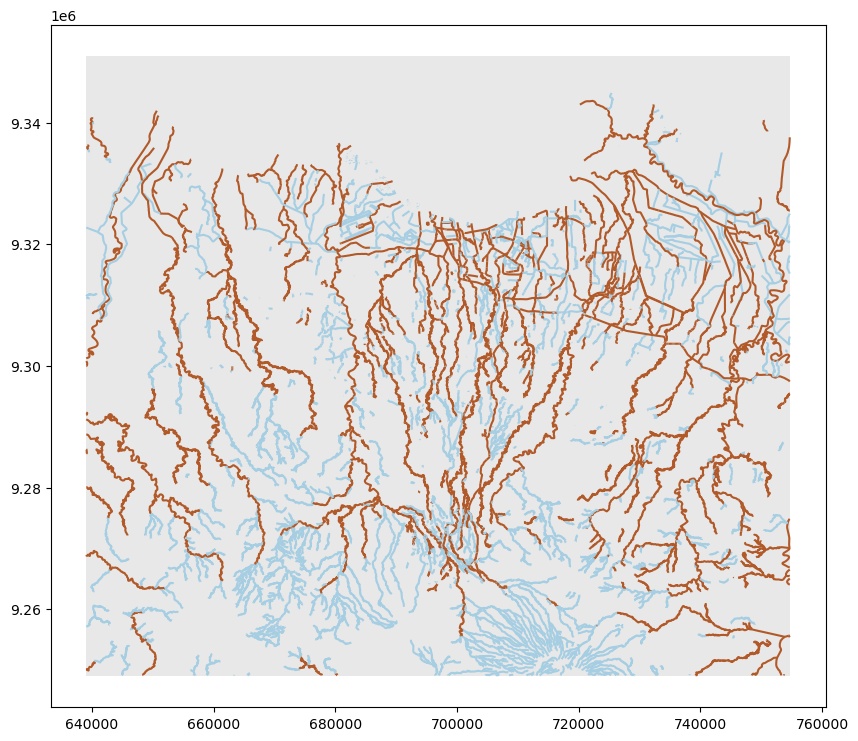

In [34]:
# get OSM data for rivers
# see full list of classes at https://wiki.openstreetmap.org/wiki/Waterways
if 'waters' not in globals():
    try:
        waters = gpd.read_file(interim_path / (case_city + '_HYD_rivers_OSM_2024_l.shp')).to_crs(AOI_gdf.crs)
        #"C:\Sciebo\05_GIS\JAK\interim\JAK_HYD_rivers_OSM_2024_L.shp"
    except FileNotFoundError:
        tags = {'waterway': ['river', 'stream', 'tidal_channel', 'canal', 'drain', 'ditch', 
                            'pressurised','fairway','fish_pass','canoe_pass']} 
        col_list = ['id','name','waterway','intermittent','usage','geometry']
        major_crit = {'waterway': ['river','tidal_channel' ]} #'canal'
        geom_type = 'LineString'

        waters = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)
waters.plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired',  zorder=2) #linewidth=1,'place',

Unique values [0 1] 
Min value 0 , Type: int16


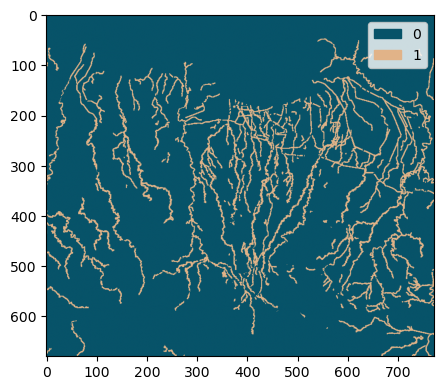

In [35]:
# rasterize the rivers
# first, let's add a 100 m buffer to the rivers
waters_toraster = waters.loc[:,['major','geometry']].copy()
waters_toraster['geometry'] = waters_toraster.buffer(100)
#waters_toraster['major'] = (waters_toraster['major'] + 1) * 2

waters_raster = rasterise_vector(
    vector = waters_toraster, 
    ref_raster_path = ref_raster_150_path, 
    col='major', 
    default_value=1, 
    dtype=rasterio.int16)


plot_unique_value_raster(waters_raster)

In [ ]:
# export the raster to a tiff
file_name = case_city + '_HYD_rivers_OSM_2025.tif'
export_path = interim_path/file_name
raster_data_type=rasterio.int16
export_raster(waters_raster,export_path,raster_data_type)


Slope file found in processed folder (680, 772)
Unique values [0. 1. 2. 4.] 
Min value 0.0 , Type: float32


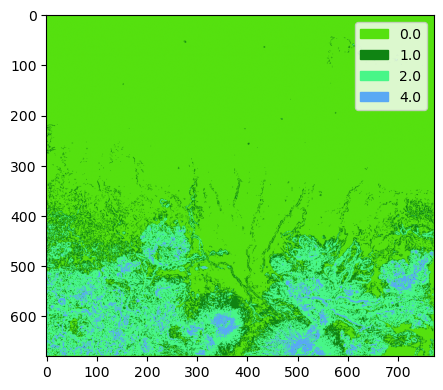

In [37]:
# get the slope raster
# let's try first the 150 m slope from the processed folder
try:
    slope_file = case_city + '_DEM_slope_pct_150m.tif'
    with rasterio.open(processed_path / slope_file) as src:        
        slope = src.read(1)        
        slope_meta = src.meta
        print('Slope file found in processed folder', src.shape)
#if it does not exist, use the slope from the interim folder (might lead to co-registration issues)
except:
    
    slope_file=case_city + '_DEM_slope_pct_TanDEM_X_150m.tif'
    slope_raster_path = interim_path / slope_file
    
    with rasterio.open(slope_raster_path) as src:
         slope = src.read(1)
         slope_meta = src.meta
         print('Slope file found in **interim** folder', src.shape)
    
# reclass the slope raster
slope = np.where(slope < 5, 0, slope)
slope = np.where((slope >= 5)&(slope < 10), 1, slope)
slope = np.where((slope >= 10)&(slope <35), 2, slope)
slope = np.where((slope >= 35), 4, slope)
slope_meta.update(dtype=rasterio.int16)

plot_unique_value_raster(slope)

### Cost summary

(680, 772) (680, 772) (680, 772) (680, 772) (680, 772)
(680, 772)
All rasters have the same shape
Min value: -5.0 , Max value: 6.0
Min value: 1 , Max value: 10


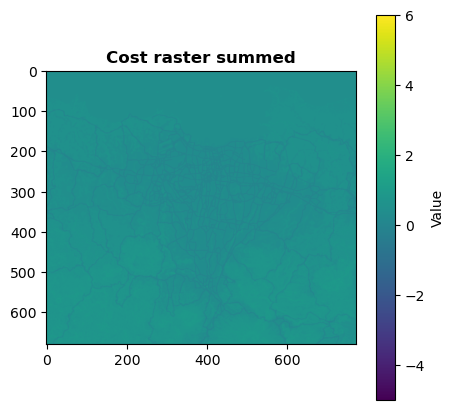

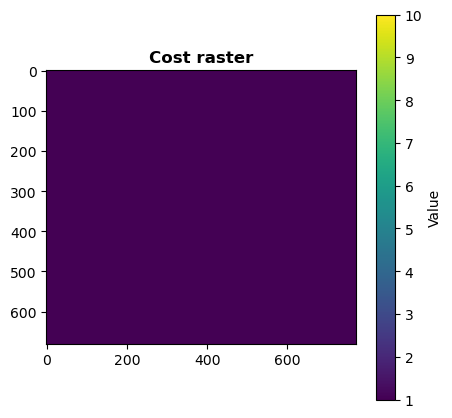

In [58]:
# check if the shape of the rasters is the same, report if not
print(greens_raster.shape, roads_cost_raster.shape, waters_raster.shape, slope.shape, urban.shape)
with rasterio.open(ref_raster_150_path) as src:
    ref_raster = src.read(1)
    good_shape = src.shape
print(good_shape)
if (greens_raster.shape != good_shape):
    print('Error: **greens raster** has different shape') 
elif (roads_cost_raster.shape != good_shape):
    print('Error: **roads raster** has different shape')
elif (waters_raster.shape != good_shape):
    print('Error: **waters raster** has different shape')
elif (slope.shape != good_shape):
    print('Error: **slope raster** has different shape')
elif (urban.shape != good_shape):
    print('Error: **urban raster** has different shape')
else: 
    shape_check = True
    print('All rasters have the same shape')
        

if shape_check == True:
    # add the cost layers together
    cost_raster_sum = greens_raster + (roads_cost_raster * 2) + waters_raster + slope + urban
    # normalize
    # normalize to 0-1 with guard for constant raster
    mn = np.nanmin(cost_raster_sum)
    mx = np.nanmax(cost_raster_sum )
    if mx == mn:
        norm = np.zeros_like(cost_raster_sum, dtype=float)
    else:
        norm = (cost_raster_sum - mn) / (mx - mn)

    # scale to desired integer range, e.g. 1..10
    cost_raster = np.round(norm * 9).astype(np.int16) + 1
    # round to integer
    cost_null = np.where(cost_raster == 0, 1, 0)
    plot_continuous_raster(cost_raster_sum, title='Cost raster summed')
    plot_continuous_raster(cost_raster, title='Cost raster')
    #plot_unique_value_raster(cost_null)


In [60]:
export_path = interim_path / (case_city + '_LOC_cost_raster_150m.tif')

export_raster(raster = cost_raster,
              url = export_path,
              ref_raster_path = ref_raster_150_path,
              data_type = rasterio.int16)

At this point, we continue in ArcGIS with [Cost Distance Accumulation tool](https://pro.arcgis.com/en/pro-app/3.4/tool-reference/spatial-analyst/distance-accumulation.htm)<br>
(APS, 21.08.2025)

## Reimport, normalise and reproject

In [ ]:
# re-import the distance accumulation raster, normalise it and co-reregister to the ref_raster_150_path
distance_acc_file = (case_city + '_TRA_roads_OSM_2025_distance_accumulation.tif')
distance_acc_raster_path = interim_path / distance_acc_file
output_path = interim_path / distance_acc_file.replace('.tif','_150m.tif')
reproj_match(infile = distance_acc_raster_path, 
                    match = ref_raster_150_path, 
                    outfile = output_path, 
                    resampling=Resampling.bilinear)


Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|


Min value: 0.0 , Max value: 1.0


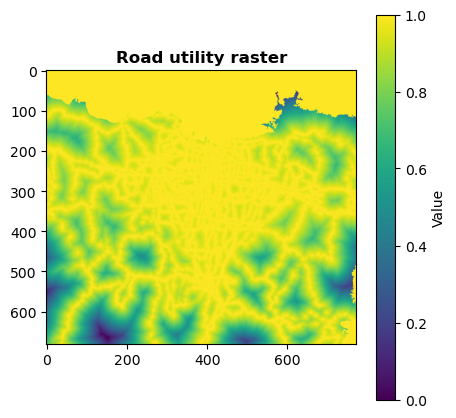

In [69]:
# prepare ASCII in the format required by the model
# first, convert the distance to utility (1-distance)
distance_acc_path = interim_path / (case_city + '_TRA_roads_OSM_2025_distance_accumulation_150m.tif')
with rasterio.open(distance_acc_path) as src:
    distance_acc_raster = src.read(1)
    distance_acc_meta = src.meta
    distance_acc_normalized = (distance_acc_raster - np.nanmin(distance_acc_raster)) / (np.nanmax(distance_acc_raster) - np.nanmin(distance_acc_raster))
    road_utility_raster = 1 - distance_acc_normalized
plot_continuous_raster(road_utility_raster, title='Road utility raster')
road_utility_path = interim_path / (case_city + '_TRA_roads_OSM_2025_cost_utility_150m.tif')
export = 'both' #'TIFF', 'ASCII', 'None', 'Both'
if export == 'TIFF':
    export_raster(raster = road_utility_raster,
                  url = road_utility_path, 
                  ref_raster_path = ref_raster_150_path,
                  data_type = rasterio.float32)
elif export == 'ASCII':
    export_raster_to_ascii(raster_obj = road_utility_raster,
        export_path = road_utility_path.with_suffix('.asc'), 
        ref_raster_path=ref_raster_path,
        raster_data_type=rasterio.float32)
elif export == 'both':
    export_raster(raster = road_utility_raster,
                  url = road_utility_path, 
                  ref_raster_path = ref_raster_150_path,
                  data_type = rasterio.float32)
    export_raster_to_ascii(raster_obj = road_utility_raster,
            export_path = road_utility_path.with_suffix('.asc'), 
            ref_raster_path=ref_raster_path,
            raster_data_type=rasterio.float32)
else:
    print('No export selected')



## Barriers: coastline

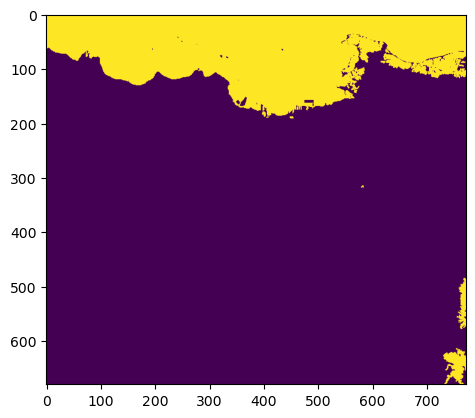

<Axes: >

In [57]:
# add the coastline
water_file = case_city + '_HYD_water_bodies_A.shp'

coast_gdf = gpd.read_file(interim_path / water_file)
aoi_boundary_list = AOI_gdf['geometry'].bounds.values.tolist()[0]
coast_gdf_clipped = gpd.clip(coast_gdf, mask=aoi_boundary_list, keep_geom_type=True)
coast_gdf_clipped['major'] = 1

coast_geom = [shapes for shapes in coast_gdf_clipped.geometry]

# rasterize the water bodies. note that we map the water bodies to 0 and the rest to 1
coastline_raster = rasterise_vector(
    vector = coast_gdf_clipped, 
    ref_raster_path = ref_raster_150_path, 
    col='major', 
    default_value=1, 
    dtype=rasterio.int16)
# water_raster = np.where(water_raster == 0, 1, 0)

# plot_unique_value_raster(water_raster)

# we ditched the rivers and kept only the water bodies.
barriers_raster =  coastline_raster # + rivers_raster
barriers_raster = np.where(barriers_raster == 2, 1, barriers_raster)
# ArcGIS requires the non-barrier areas to have NaN values
#barriers_raster = np.where(barriers_raster == 0, np.nan, barriers_raster)
#plot_unique_value_raster(barriers_raster)
show(barriers_raster)

In [56]:
# export the barriers raster
file_name = case_city + '_LOC_barriers_raster_150m.tif'

with rasterio.open(ref_raster_150_path, 'r') as ref_raster:
    export_geotiff(
        raster= barriers_raster, 
        out_transform = ref_raster.transform,
        out_meta = ref_raster.meta,
        export_path = interim_path / file_name,
        data_type = rasterio.int16)

C:\Sciebo\05_GIS\JAK\interim\JAK_LOC_barriers_raster_150m.tif


c:\Users\santos\.conda\envs\x\Lib\site-packages\numpy\_core\_asarray.py:122: RuntimeWarning: invalid value encountered in cast
  arr = array(a, dtype=dtype, order=order, copy=None, subok=subok)


### calculate distance to water features (rivers + coastline)

[1 0]
Unique values [0 1] 
Min value 0 , Type: int16


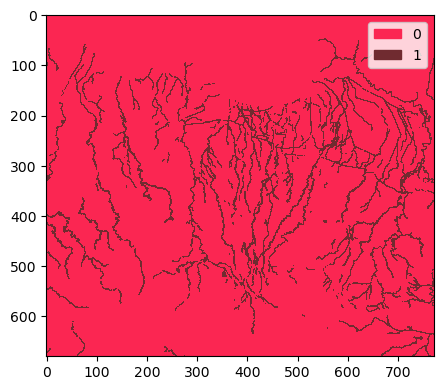

In [189]:
print(waters.major.unique())
plot_unique_value_raster(waters_raster)


Unique values [0 1] 
Min value 0 , Type: int32


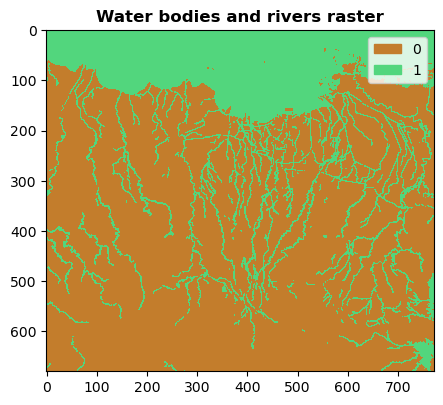

In [190]:
# add rivers and water bodies 
water_bodies_raster = coastline_raster + waters_raster
# reclass values with 2 to 1 (water bodies or rivers), and 0 to 1 (no water bodies or rivers)
water_bodies_raster = np.where(water_bodies_raster >= 1, 1, 0)

plot_unique_value_raster(water_bodies_raster, title='Water bodies and rivers raster')

Min value: 0.0 , Max value: 82.15229759416349


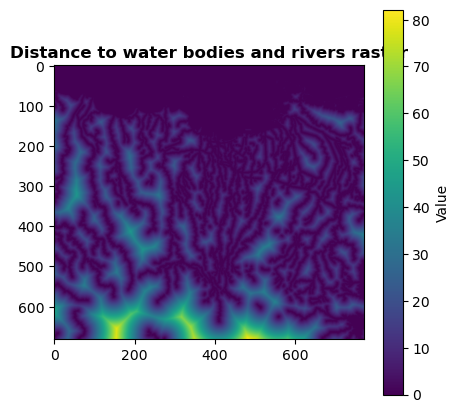

In [191]:
# calculate the distance to the water bodies and rivers

water_bodies_distance_raster = distance_transform_edt(1-water_bodies_raster) 
plot_continuous_raster(water_bodies_distance_raster, title='Distance to water bodies and rivers raster')

Min value: 0.0 , Max value: 1.0


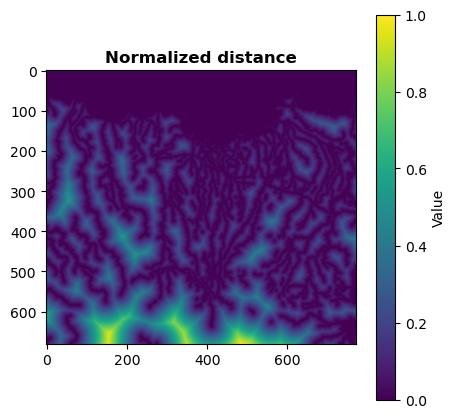

In [192]:
# normalize the distance raster
water_bodies_distance_raster_norm = (water_bodies_distance_raster - np.nanmin(water_bodies_distance_raster))/(np.nanmax(water_bodies_distance_raster) - np.nanmin(water_bodies_distance_raster))
plot_continuous_raster(water_bodies_distance_raster_norm, title='Normalized distance')

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb
# export the absolute and normalized distance raster
water_dist_file_name = case_city + '_HYD_water'

export_files(gdf=None, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=water_bodies_distance_raster, 
             distance_normal=water_bodies_distance_raster_norm, #
             out_path=interim_path, 
             file_name = water_dist_file_name)

# 7. Slope

## Conver slope in degrees to percentage
ArcGIS Pro seems to be calculating the slope in percentage wrong. There are values of up to 600%, which do not make sense. Let's instead use the version in degrees and calculate the percentage ourselves.

type: <class 'numpy.ndarray'> shape: (681, 773)
(681, 773) min: 0.0 max: inf
Adjusted min: 1.2879129e-07 max: 90.0
Min value: 1.2879129e-07 , Max value: 90.0


C:\Users\ra42zek\AppData\Local\Temp\ipykernel_25844\2214951859.py:9: RuntimeWarning: overflow encountered in multiply
  print(src.shape, 'min:', np.nanmin(slope_raster).round(2), 'max:', np.nanmax(slope_raster).round(2))


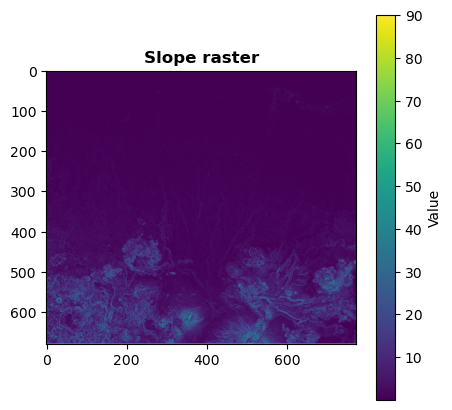

In [24]:
raster_file = case_city + '_DEM_slope_deg_TanDEM_X_150m.tif'
slope_raster_path = interim_path / raster_file
with rasterio.open(slope_raster_path, 'r') as src:
    slope_raster = src.read(1)
    print('type:',type(slope_raster),'shape:',slope_raster.shape)
    #for band in slope_raster:
        #print(type(band))
        #print('min:', np.nanmin(band), 'max:', np.nanmax(band))
    print(src.shape, 'min:', np.nanmin(slope_raster).round(2), 'max:', np.nanmax(slope_raster).round(2))
    if np.nanmin(slope_raster) < 0:
        slope_raster = np.where(slope_raster <0, 0, slope_raster)
        print('Negative values found, adjusted to min=0')
    if np.nanmax(slope_raster) > 90:
        slope_raster = np.where(slope_raster > 90, 90, slope_raster)
        print('Adjusted min:', np.nanmin(slope_raster), 'max:', np.nanmax(slope_raster))
    #show(slope_raster)
    plot_continuous_raster(slope_raster, title='Slope raster')



min: -2287733200.0 max: 170.74
Negative values found, adjusted to min=0
Min value: 0.0 , Max value: 170.74008


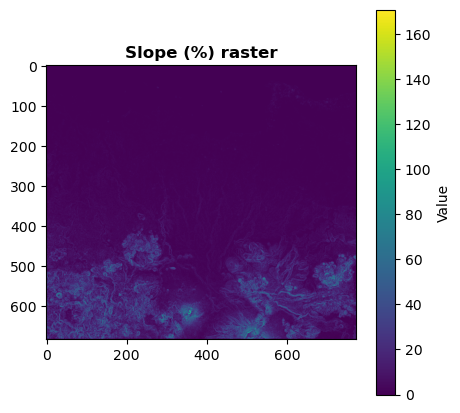

In [25]:
# calculate the slope in percentage
slope_pct_raster = (np.tan(np.radians(slope_raster)) * 100).astype(np.float32)
print('min:', np.nanmin(slope_pct_raster).round(2), 'max:', np.nanmax(slope_pct_raster).round(2))
if np.nanmin(slope_pct_raster) < 0:
    slope_pct_raster = np.where(slope_pct_raster <0, 0, slope_pct_raster)
    print('Negative values found, adjusted to min=0')
plot_continuous_raster(slope_pct_raster, title='Slope (%) raster')

## Co-register to the AOI

In [27]:
# export the slope pct raster
file_name = case_city + '_DEM_slope_pct_TanDEM_X_150m_temp.tif'
temp_url = interim_path / file_name
with rasterio.open(temp_url, 'w', driver='GTiff', height=slope_pct_raster.shape[0], width=slope_pct_raster.shape[1], count=1, dtype=slope_pct_raster.dtype, crs=src.crs, transform=src.transform) as dst:
    dst.write(slope_pct_raster, 1)
infile = temp_url
match = ref_raster_150_path
out_file_name = case_city + '_DEM_slope_pct_150m.tif'
outfile = interim_path / out_file_name
reproj_match(infile, match, outfile, resampling=Resampling.bilinear)

Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|


### check if reprojection worked

In [43]:
#import the AOI raster
with rasterio.open(ref_raster_150_path) as src:
    aoi_raster = src.read(1)
    print('type:',type(aoi_raster),'shape:',aoi_raster.shape)

# import the slope raster to check the size
slope_file = case_city + '_DEM_slope_pct_150m.tif'
with rasterio.open(processed_path / slope_file) as src:
    slope_raster = src.read(1)
    print('type:',type(slope_raster),'shape:',slope_raster.shape)

type: <class 'numpy.ndarray'> shape: (680, 772)
type: <class 'numpy.ndarray'> shape: (680, 772)


### if necessary export

In [76]:
file_name = case_city + '_DEM_slope_100pct_30m.tif'
with rasterio.open(ref_raster_path, 'r') as ref_raster:
        export_geotiff(
            raster= slope_array, 
            out_transform = ref_raster.transform,
            out_meta = ref_raster.meta,
            export_path = interim_path / file_name,
            data_type = rasterio.float32)

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MAN\interim\MAN_DEM_slope_100pct_30m.tif


## Copy the rasters to the model inputs folder

In [6]:
raster_file = case_city + '_DEM_slope_pct_150m.tif'

file_copy_list = [raster_file]
for file in file_copy_list:
    origin_path = processed_path / file
    destination_path = model_inputs_30m_path / file
    shutil.copy(origin_path, destination_path)
    print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\model_inputs\TIFF_30m\JAK_DEM_slope_pct_150m.tif


## Alternatively, check the resampled 150 m raster

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb
file_name = case_city + '_DEM_slope_100pct_150m.tif'

# we need to verify if the resampling added negative values to the slope raster
slope_path =  model_inputs_150m_path / file_name
with rasterio.open(slope_path, 'r') as slope:
    slope_array = slope.read(1)
    print('The min slope was', np.nanmin(slope_array), 'and the max slope was', np.nanmax(slope_array))
    #slope_array = np.where(slope_array > 100, 100, slope_array)
    slope_array = (slope_array - np.nanmin(slope_array))/(np.nanmax(slope_array) - np.nanmin(slope_array))
    
    # Create a new raster with the same meta as slope and fill it with 100
    constant_raster = np.full(slope_array.shape, 100, dtype=slope_array.dtype)
    slope_array = np.round(slope_array,4) * constant_raster
    print('The min slope now is', np.nanmin(slope_array), 'and the max slope now is', np.nanmax(slope_array))

The min slope was -1.1288191 and the max slope was 390.5473
The min slope now is 0.0 and the max slope now is 100.0


In [ ]:
# export to GeoTIFF
file_name = case_city + '_DEM_slope_100pct_150m.tif'
data_type = rasterio.int16
raster = slope_array
url = interim_path / file_name
#ref_raster = ref_raster

export_raster(raster = raster,
              url = url,
              data_type=rasterio.float64,
              ref_raster_path=ref_raster_150_path)

### Copy the rasters to the model inputs folder

In [ ]:
raster_file = case_city + '_DEM_slope_0_100pct_150m.tif'

file_copy_list = [raster_file]

for file in file_copy_list:
    origin_path = interim_path / file
    destination_path = model_inputs_150m_path / file
    shutil.copy(origin_path, destination_path)
    print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MUM\model_inputs\TIFF_150m\MUM_DEM_slope_0_100pct_150m.tif


# 8. Tenure status/informality


This data point is locally sourced, as there are not (to the best of our knowledge) any global or regional machine-readable data sources.<br>
Therefore, we will source each data from local information, often at the municipal or metropolitan level. <br>

<p> For **Mumbai**, there is available data for the Greater Mumbai area in the form of a slum clusters shapefile provided by the MMRDA. <br>
For Jakarta, there is slum-identification data for the Jakarta special administrative region. In this case, the workflow is similar to Mumbai.<br>
In these cases, the workflow is:</p>

- Import 2016 slum clusters
- Convert to raster
- Ressample and co-register to 150 m grid

<p> For **Manila**, there are 9 variables in the census identifying tenure. <br>
Census data source: https://data.humdata.org/dataset/philippines-subnational-population-and-housing-data-tables

Total household number with tenure = ['HU_TNOHL', 'HU_TNRHL','HU_TNOHRL','HU_TNNA','HU_TNND']

1. Housing unit tenure, own house and lot
2. Housing unit tenure, rent house and lot	
3. Housing unit tenure, own house and rent lot	
4. Housing unit tenure, not applicable	
5. Housing unit tenure, no data

Total household number without tenure = ['HU_TNFLWC','HU_TNFLNC', 'HU_TNRFWC','HU_TNRFNC']

1. Housing unit tenure, own house with free lot with consent	
2. Housing unit tenure, own house with free lot without consent	
3. Housing unit tenure, free house and lot with consent	
4. Housing unit tenure, free house and lot without consent	


- Reclassify the variables in a binary column</p>

### import & rasterise

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb

if case_city == 'MUM':
    # importing the slum data, created by the MMRDA in 2016
    slums_vector = gpd.read_file(external_path / 'MUM_URB_slum_clusters_MMRDA_2016_A.shp')

elif case_city == 'JAK':
    print('Jakarta slum data not available')
elif case_city == 'MAN':
    # we use census data to identify concentration of informal settlements
    # Cols for households with tenure = ['HU_TNOHL', 'HU_TNRHL','HU_TNOHRL','HU_TNNA','HU_TNND']
    # Cols for households without tenure = ['HU_TNFLWC','HU_TNFLNC', 'HU_TNRFWC','HU_TNRFNC']
    
    tenure_vector_temp = gpd.read_file(interim_path / 'MAN_POP_census_households_USCensus_2020_A.shp')
    tenure_vector = tenure_vector_temp.clip(AOI_gdf, keep_geom_type=True)
    tenure_vector.loc[:,'tenure_pct'] = round(tenure_vector.loc[:,['HU_TNOHL', 'HU_TNRHL','HU_TNOHRL','HU_TNNA','HU_TNND']].sum(axis=1) / tenure_vector['HU_HTOTL'] * 100, 3)
    tenure_vector.loc[:,'no_tenure_pct'] = round(tenure_vector.loc[:,['HU_TNFLWC','HU_TNFLNC', 'HU_TNRFWC','HU_TNRFNC']].sum(axis=1) / tenure_vector['HU_HTOTL'] * 100, 3)
    tenure_vector.loc[:,['HU_TNOHL', 'HU_TNRHL','HU_TNOHRL','HU_TNNA','HU_TNND','tenure_pct','HU_TNFLWC','HU_TNFLNC', 'HU_TNRFWC','HU_TNRFNC','no_tenure_pct']].head()
    tenure_vector.loc[:,'tenure_major'] = 0
    tenure_vector.loc[tenure_vector['no_tenure_pct'] > 30, 'tenure_major'] = 1
    slums_vector = tenure_vector.loc[tenure_vector['tenure_major'] == 1, ['geometry']]


<Axes: >

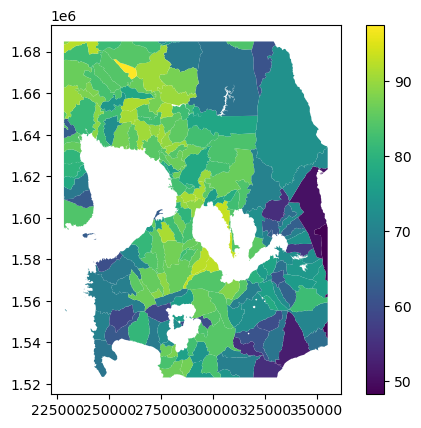

In [ ]:
tenure_vector.plot(column='tenure_pct', cmap='viridis', legend=True)


<Axes: >

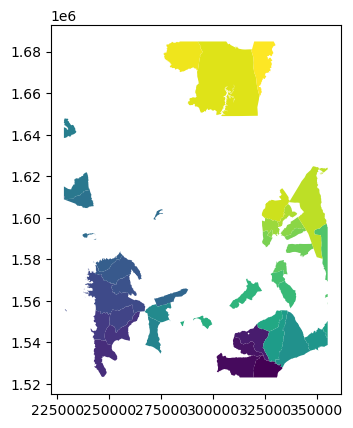

In [ ]:
slums_vector.plot(cmap='viridis', legend=True)

Unique values [0 1] 
Min value 0 , Type: int16


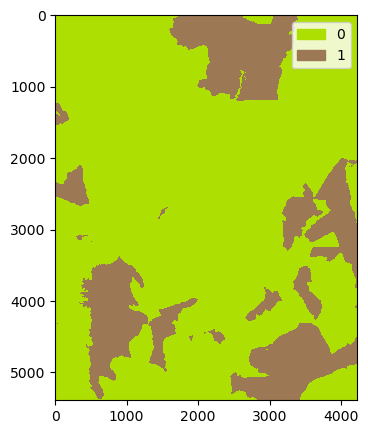

In [ ]:
slums_raster = rasterise_vector(
    vector = slums_vector, 
    ref_raster = ref_raster, 
    col=None, 
    default_value=1, 
    dtype = rasterio.int16)
# plot the result
plot_unique_value_raster(slums_raster)

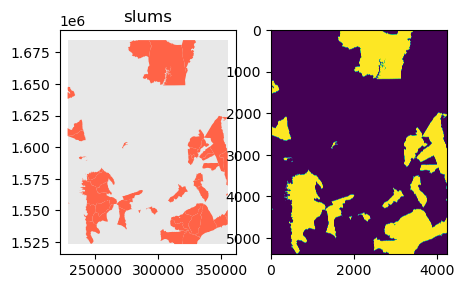

In [ ]:
# plot to check the conversion
vector = slums_vector
raster = slums_raster
title = 'slums'

def plot_vec_ras(vector, raster, title):
    fig, ax = plt.subplots(nrows=1, ncols = 2, figsize = (5, 5))
    vector.plot(ax=ax[0],color='tomato', linewidth=1, zorder=2)
    AOI_gdf.plot(ax=ax[0],  alpha=0.5, color='lightgray', zorder=1)
    
    AOI_gdf.plot(ax=ax[1],  alpha=0.5, color='lightgray', zorder=1)
    show(raster, ax = ax[1])
    
    ax[0].set_title( title)
    #ax[0].set_axis_off()
    plt.gca() 
    plt.show()

plot_vec_ras(vector, raster, title)

### subtract from the urban areas to get full_tenure = 1 and no_tenure = 0

Unique values [0 1 2] 
Min value 0 , Type: int32


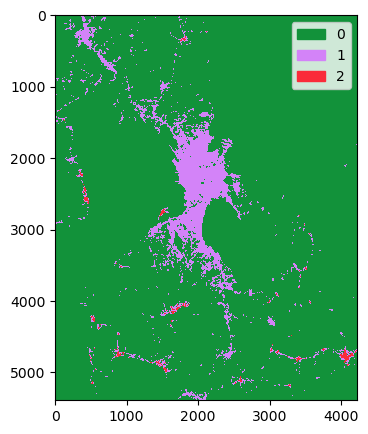

In [ ]:
#%run ./ti_city_00_raster_functions.ipynb
urb_file = case_city + '_URB_urbanisation_2015_EOC_WUF_30m.tif'
with rasterio.open(interim_path / urb_file,'r') as urban_raster:
    urban_areas = np.where(urban_raster.read(1) == 1, 1, 0)
    #tenure_mask = slums_raster.mask(urban_areas)
    tenure_masked = np.where((slums_raster == 1) & (urban_areas == 1), 1, 0)
    #urban_areas = np.where(urban_areas == 1, -1, urban_areas)
    tenure = urban_areas + tenure_masked
    #tenure = np.where(tenure < 0, -9999, tenure)

    #plot_ras_ras(urban_areas, tenure,  title1='some data', title2='some data', AOI_gdf = AOI_gdf)
    plot_unique_value_raster(tenure)

### export

In [ ]:
# export to GeoTIFF
data_type = rasterio.int16
raster = tenure
file_name = case_city + '_URB_tenure_30m.tif'
url = interim_path / file_name
#ref_raster = ref_raster

with rasterio.open(
    url, "w",
    driver = "GTiff",
    crs = ref_raster.crs,
    transform = ref_raster.transform,
    dtype = data_type,
    count = 1,
    width = ref_raster.width,
    height = ref_raster.height) as dst:
    dst.write(raster, indexes = 1)

In [ ]:
# export the shapefile
file_name = case_city + '_URB_tenure_30m.shp'
url = interim_path / file_name

tenure_vector.to_file(url, crs = ref_raster.crs)

In [ ]:
# export to ASCII
file_name = case_city + '_URB_tenure_30m.asc'
export_raster_to_ascii(slums_2016_raster, 
                       interim_path/file_name, 
                       ref_raster=ref_raster,
                       raster_data_type=rasterio.int16)

## Copy the rasters to the model inputs folder

In [ ]:
file_name = case_city + '_URB_tenure_30m.tif'

file_copy_list = [file_name]

for file in file_copy_list:
    origin_path = interim_path / file
    destination_path = model_inputs_30m_path / file
    shutil.copy(origin_path, destination_path)
    print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MAN\model_inputs\TIFF_30m\MAN_URB_tenure_30m.tif


# 9. Exclusion & water layers
- Import water bodies [Garmin World Water Bodies in ESRI Living Atlas](https://hub.arcgis.com/content/e750071279bf450cbd510454a80f2e63/about)
- Import protected areas [WDPA - World Database of Protected Areas in ESRI Living Atlas](https://www.arcgis.com/home/item.html?id=ae78aeb913a343d69e950b53e29076f7)
- Import OSM features: [natural](https://wiki.openstreetmap.org/wiki/Key:natural), [green landuses](https://wiki.openstreetmap.org/wiki/Key:landuse), [leisure areas](https://wiki.openstreetmap.org/wiki/Key:leisure), [airports](https://wiki.openstreetmap.org/wiki/Aeroways), [military installations](https://wiki.openstreetmap.org/wiki/Key:military)
- Convert to raster
- Add up areas
- Ressample and co-register to 150 m grid

Barriers raster found: JAK_LOC_barriers_raster_150m.tif with shape (680, 772)
Including national parks in the exclusion layer


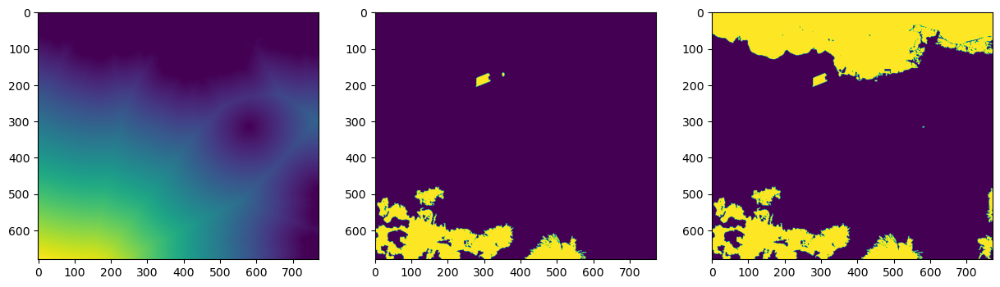

In [ ]:
# exclusion layer should include a) water bodies, b) envinronmental protected areas, 
# or c) other barriers to urban development (e.g., airport)
# Protected areas

# check if there is a barriers raster already created
barriers_file = case_city + '_LOC_barriers_raster_150m.tif'
barriers_path = interim_path / barriers_file
if os.path.exists(barriers_path):
    with rasterio.open(barriers_path) as src:
        water_raster = src.read(1)
        print('Barriers raster found:', barriers_file, 'with shape', src.shape)
        #plot_unique_value_raster(water_raster, title='Barriers raster from waters')
else:  
    print('No barriers raster found, creating exclusion raster from water bodies and national parks')
    water_file = case_city + '_HYD_water_bodies_A.shp'

    # calculate the exclusion layer
    water_gdf = gpd.read_file(interim_path / water_file)
    aoi_boundary_list = AOI_gdf['geometry'].bounds.values.tolist()[0]
    water_gdf_clipped = gpd.clip(water_gdf, mask=aoi_boundary_list, keep_geom_type=True)
    water_gdf_clipped['major'] = 1

    water_geom = [shapes for shapes in water_gdf_clipped.geometry]

    # rasterize the water bodies. note that we map the water bodies to 0 and the rest to 1
    water_raster = features.rasterize(water_geom,
                                        out_shape = ref_raster.shape,
                                        fill = 1,
                                        out = None,
                                        transform = ref_raster.transform,
                                        all_touched = True,
                                        default_value = 0,
                                        dtype = None)

water_distance_raster = distance_transform_edt(1 - water_raster)

# should we include national parks and protected areas in the exclusion layer?
# this should be the case ONLY when we expect them to be impermeable to future occupation.
# if that is not the case, include them in them in the planning layer instead

parks_choice = True #True or False
if parks_choice == True:
    print('Including national parks in the exclusion layer')
    parks_file = case_city + '_LIM_exclusion_features_A.shp'
    national_park_gdf = gpd.read_file(interim_path / parks_file)
    national_park_gdf_clipped = gpd.clip(national_park_gdf, mask=aoi_boundary_list, keep_geom_type=True)
    national_park_gdf_clipped['major'] = 1

    national_park_geom = [shapes for shapes in national_park_gdf_clipped.geometry]

    # rasterize the national parks
    national_park_raster = features.rasterize(national_park_geom,
                                        out_shape = ref_raster.shape,
                                        fill = 0,
                                        out = None,
                                        transform = ref_raster.transform,
                                        all_touched = True,
                                        default_value = 1,
                                        dtype = None)

    # combine water and national parks to create the exclusion layer
    exclusion_raster = water_raster + national_park_raster
    exclusion_raster = np.where(exclusion_raster > 1, 1, exclusion_raster)
    ax, fig = plt.subplots(1,3, figsize=(15,5))
    show(water_distance_raster, ax=fig[0])
    show(national_park_raster, ax=fig[1])
    show(exclusion_raster, ax=fig[2])

  
elif parks_choice == False:
    print('Not including national parks in the exclusion layer')
    exclusion_raster = np.where(water_raster == 0, 0, 1)  # for Manila, the team decided not to include national parks
    ax, fig = plt.subplots(1,2, figsize=(15,5))
    show(water_distance_raster, ax=fig[0])
    show(exclusion_raster, ax=fig[1])

plt.show()

Min value: 0.0 , Max value: 1.0


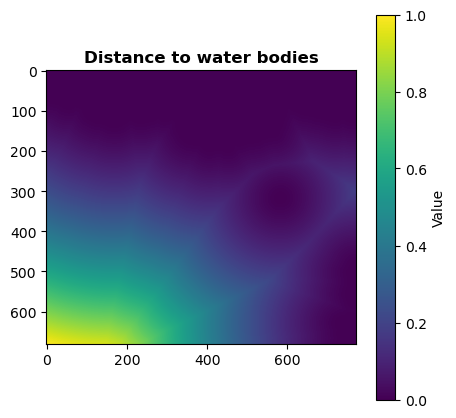

In [6]:
scale_factor = 1.5

water_influence = np.power(water_distance_raster, scale_factor)
water_influence_normal = (water_influence - np.nanmin(water_influence))/(np.nanmax(water_influence) - np.nanmin(water_influence))

plot_continuous_raster(water_influence_normal, title='Distance to water bodies')

Unique values [0 1] 
Min value 0 , Type: int32


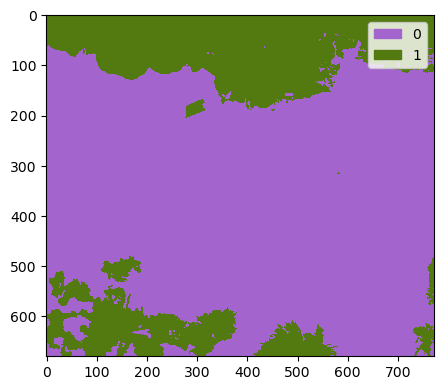

In [7]:
plot_unique_value_raster(exclusion_raster)

## export

In [9]:
file_copy_list = []

# export to GeoTIFF
data_type = rasterio.int16
raster = exclusion_raster
tiff_file_name = case_city + '_LIM_exclusion_layer_150m.tif'
file_copy_list.append(tiff_file_name)
tiff_path = interim_path / tiff_file_name

with rasterio.open(
    tiff_path, "w",
    driver = "GTiff",
    crs = ref_raster.crs,
    transform = ref_raster.transform,
    dtype = data_type,
    count = 1,
    width = ref_raster.width,
    height = ref_raster.height) as dst:
    dst.write(raster, indexes = 1)
print(tiff_path)

raster = water_influence_normal
data_type = rasterio.float64
tiff_file_name = case_city + '_HYD_water_distance_150m.tif'
tiff_path = interim_path / tiff_file_name
file_copy_list.append(tiff_file_name)

with rasterio.open(
    tiff_path, "w",
    driver = "GTiff",
    crs = ref_raster.crs,
    transform = ref_raster.transform,
    dtype = data_type,
    count = 1,
    width = ref_raster.width,
    height = ref_raster.height) as dst:
    dst.write(raster, indexes = 1)
print(tiff_path)


#for file in file_copy_list:
#    origin_path = interim_path / file
#    destination_path = model_inputs_150m_path / file
#    shutil.copy(origin_path, destination_path)
#    print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_LIM_exclusion_layer_150m.tif
D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_HYD_water_distance_150m.tif


# 10. Attractiveness
1. Used real estate portals information on most attractive neighbourhoods in each city. 
- MUM: https://www.nobroker.in/blog/posh-areas-in-mumbai/
- MAN: https://santosknightfrank.com/blogs/a-guide-to-the-most-exclusive-villages-in-metro-manila/ and https://www.spot.ph/newsfeatures/adulting/108119/most-expensive-subdivisions-metro-manila-2024-a5229-20240221
- JAK: https://expatindonesia.id/2025/5-most-expensive-jakarta-property-areas-in-2025/

2. calculated Euclidian distances and normalised (min-max).
3. export to ASCII

## Working with OSM point data and real estate market website info

Check
- https://workatflow.com/blog/jakarta-central-business-district-indonesias-premier-commercial-hub/
- 

Attention: Mixed geometry types found, will be converted to points
Features fetched 12099
Features without duplicates 11887


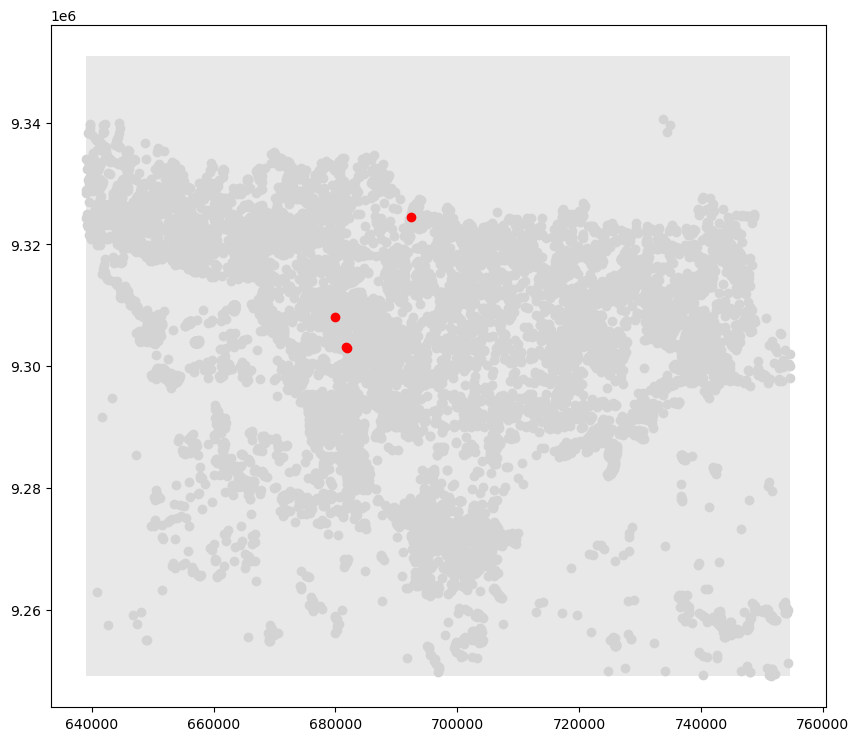

In [61]:
## ATTENTION:  attractiveness proxies are **manually** set for each case study. This is hard to automate.

# List key-value pairs for tags
tags = {'landuse': ['commercial','retail','residential'], 'place':['suburb','neighbourhood','quarter']} # see https://wiki.openstreetmap.org/wiki/Key:landuse for more info,
col_list = ['id','name','geometry','landuse', 'place'] 

# finding the 'attractive areas' is very subjective. We tried using centrality and accessibility as proxies, but the results were not satisfactory.
# hence, we define a ad hoc list of OSM names for the attractive areas using real estate websites and validate it locally

if case_city == 'MUM':
    # source: https://www.nobroker.in/blog/posh-areas-in-mumbai/)
    posh_list = ['Juhu', 'Malabar Hill', 'Cuffe Parade', 'Bandstand', 'Tardeo', 'Pali Hill', 'Worli Sea Face', 'Breach Candy',
             'Seven Bungalows', 'Versova', 'Hiranandani', 'Powai', 'Altamount Road', 'JVPD Scheme', 'Vile Parle East',
             'Andheri East','Dadar East', 'Parel']
elif case_city == 'MAN':
    # source: https://santosknightfrank.com/blogs/a-guide-to-the-most-exclusive-villages-in-metro-manila/
    # source: https://www.spot.ph/newsfeatures/adulting/108119/most-expensive-subdivisions-metro-manila-2024-a5229-20240221
    posh_list = ['Forbes Park','Dasmariñas Village','Urdaneta Village','Bel-Air Village Phase I and II',
                 'San Lorenzo Village','Magallanes Village','Ayala Alabang','Corinthian Gardens',
                 'Green Meadows','Greenhills East','Loyola Grand Villas','White Plains', 'AFPOVAI Phase V-A',
                 'McKinley Hill', 'BF Homes','Sikatuna Village'] #'Greenwoods Executive Homes',
elif case_city == 'JAK':
    # source: https://expatindonesia.id/2025/5-most-expensive-jakarta-property-areas-in-2025/
    posh_list = ['Menteng', 'Kuningan', 'Kemang', 'Pondok Indah', 'Senayan', 'Pantai Indah Kapuk', 'Gading Serpong', 'BSD City']

major_crit = {'name': posh_list} 
geom_type = 'Mixed'

attractive = get_osm_features(tags, col_list, geom_type, major_crit, AOI_gdf)
attractive_selected = attractive.loc[attractive.name.isin(posh_list),:]

#plot them
f = plt.figure(figsize=(10, 10))
ax=f.add_subplot(111)

#cbd.loc[(cbd.major==1),:].plot('major',ax=AOI_gdf.plot(figsize=(10, 10),  alpha=0.5, color='lightgray'),cmap='Paired', zorder=1)
ax.plot(attractive.centroid.x,attractive.centroid.y,'o',color='lightgrey', marker='o', zorder=2) #cmap='Paired',
AOI_gdf.plot(ax=ax,  alpha=0.5, color='lightgray', zorder=1)
ax.plot(attractive_selected.centroid.x,attractive_selected.centroid.y, 'ro', zorder=3)
plt.show()


In [63]:
for i in sorted(posh_list):
    print(i)
attractive_selected

BSD City
Gading Serpong
Kemang
Kuningan
Menteng
Pantai Indah Kapuk
Pondok Indah
Senayan


,id,name,geometry,landuse,place,major
378,10759331,BSD City,POINT (681867.175 9303020.365),residential,suburb,1
225,12553018899,BSD City,POINT (681748.266 9303151.277),NaN,suburb,1
265,6543247,Gading Serpong,POINT (679982.178 9308110.008),residential,NaN,1
135,9191746033,Pantai Indah Kapuk,POINT (692471.977 9324444.71),NaN,neighbourhood,1


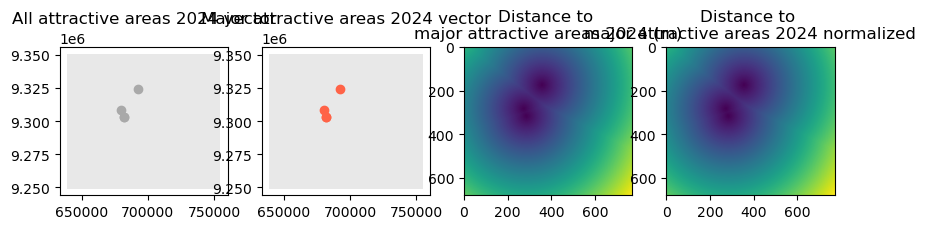

In [66]:
# rasterize and calculate distances
attractive_major_raster, attractive_full_raster, attractive_distance_raster, attractive_dist_normalized = get_distance_raster(attractive_selected, ref_raster_path)

# Plot the outputs
plot_vec_vec_ras_ras(attractive_selected, attractive_distance_raster, attractive_dist_normalized, 'attractive areas 2024')



In [68]:
print(type(attractive_dist_normalized),type(attractive_full_raster))

<class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [ ]:
file_name = case_city + '_LOC_attractive_areas_OSM_2025_P'
out_path = interim_path

normalized_raster_file = file_name + '_distance_normal_150m.tif'
normalized_url = out_path / normalized_raster_file
export_raster(raster = attractive_dist_normalized,
                url = normalized_url,
                data_type = rasterio.float32,
                ref_raster_path = ref_raster_path)

In [71]:
file_name = case_city + '_LOC_attractive_areas_OSM_2025'
out_path = interim_path


export_files(gdf = attractive_selected, 
             major_raster=None, 
             full_raster=None, 
             distance_raster=None, 
             distance_normal=attractive_dist_normalized, 
             out_path=interim_path, 
             file_name=file_name)

## do the same process with 2000 data
still need to implement this step

In [ ]:
# import 2000 OSM data


# 11. Income/wealth/GDP 2000, 2015 and 2025
- For **Mumbai**<br>
we use ArcGIS online information on income from 2001 and 2015 at the census subdistrict scale.
Variable: "Percentage of households having assets like TV, computer, mobile, and scooter or car' from the 2011 census. 
Reclassified to <1% = 1 (low income), 1.1-3% = 2 (medium income), and >3.01 = 3 (high income).<br>
This process includes: <br>
- Import shapefile with census district boundaries
- Clip to AOI
- Reclassify
- Rasterize
- Export to ASCII

- For **Jakarta** & **Manila** <br>
  We will prepare the data from Kummu M, Kosonen M, Masoumzadeh Sayyar S. Downscaled gridded global dataset for gross domestic product (GDP) per capita PPP over 1990–2022. Sci Data. 2025;12(1):178. doi:10.1038/s41597-025-04487-x. <br>
- Updated version of the dataset (19.03.2026): Kummu, M., Kosonen, M., & Masoumzadeh Sayyar, S. (2026). Data for: Downscaled gridded global dataset for Gross Domestic Product (GDP) per capita at purchasing power parity (PPP) over 1990-2022 (updated to 1990-2024) [Data set]. Zenodo. https://doi.org/10.5281/zenodo.18429133
  The data comes clipped and resampled (but not co-registered) to the AOIs. We need to co-register and extract the correct bands (Band 3 = 2000, Band 7 = 2020).
This process includes: <br>
- Import multi-band TIFF file
- Co-register to AOI reference
- Select the bands for 2000 and 2020
- Export to ASCII & TIFF


## Mumbai

In [ ]:
# APS, 01.11.2024: need to update the code below to use generic AOI definition
# ATTENTION: need to standardise the file names for the census layers

# import shapefile with census data
# the shapefile was created by merging the 2011 census data from ArcGIS online and the GADM4 level 3 polygons
census_path = interim_path / 'MUM_LIM_census_subdistricts_GADM4_A.shp'
census_gdf = gpd.read_file(census_path, include_fields = ['GID_3','NAME_3','geometry','CS_asset11']) # CS_asset11 is the percentage of households with assets like TV, computer, mobile, car or scooter.

### rasterise

income_class
1    10
2    10
3    10
Name: count, dtype: int64 30


<Axes: >

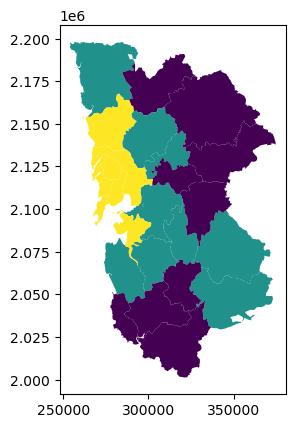

In [ ]:
# reclassify the CS_asset11 variable into income classes
census_gdf['income_class'] = pd.qcut(census_gdf['CS_asset11'], q=3, labels=[1,2,3])
print(census_gdf['income_class'].value_counts(), len(census_gdf))
census_gdf.plot('income_class', cmap='viridis')

In [ ]:
print(census_gdf.crs, ref_raster.crs, census_gdf.dtypes)

EPSG:32643 EPSG:32643 GID_3             object
NAME_3            object
CS_asset11       float64
geometry        geometry
income_class    category
dtype: object


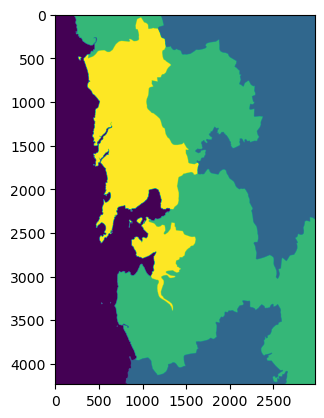

<Axes: >

In [ ]:
# rasterize the census data
geom_value = ((geom,value) for geom, value in zip(census_gdf.geometry, census_gdf['income_class']))
#census_raster = rasterise_vector(geom_value, ref_raster, -9999)

# Rasterize vector using the shape and transform of the raster
census_raster = features.rasterize(geom_value,
                                out_shape = ref_raster.shape,
                                transform = ref_raster.transform,
                                all_touched = True,
                                fill = 0,   # background value
                                #merge_alg = MergeAlg.replace,
                                dtype = rasterio.int16)

show(census_raster)

In [ ]:
file_name = case_city + '_POP_census_income_GADM4_30m.tif'

# export to GeoTIFF
with rasterio.open(ref_raster_path, 'r') as reference:
    with rasterio.open(interim_path / file_name, 
                       "w",
                        driver = "GTiff",
                        crs = reference.crs,
                        transform = reference.transform,
                        dtype = rasterio.int16,
                        count = 1,
                        width = reference.width,
                        height = reference.height) as dst:
        dst.write(census_raster, indexes = 1)

### Copy the rasters to the model inputs folder

In [ ]:
file_name = case_city + '_POP_census_income_GADM4_30m.tif'

file_copy_list = [file_name]
for file in file_copy_list:
    origin_path = interim_path / file
    destination_path = model_inputs_30m_path / file
    shutil.copy(origin_path, destination_path)
    print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MUM\model_inputs\TIFF_30m\MUM_POP_census_income_2015_30m.tif


## JAK & MAN

The raster CRS is: EPSG:32748
type: <class 'numpy.ndarray'> shape: (680, 772)
(680, 772) min: 0.0 max: 572264100.0
The admin units CRS is: EPSG:32748


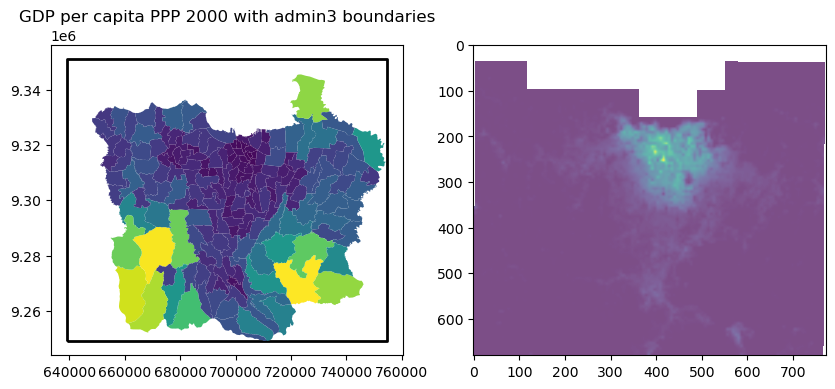

In [ ]:
# import the TIFF files
# adopting Kummu et al. 2025 dataset on downscaled GDP per capita PPP
# Kummu M, Kosonen M, Masoumzadeh Sayyar S. Downscaled gridded global dataset for gross domestic product (GDP) per capita PPP over 1990–2022. Sci Data. 2025;12(1):178. doi:10.1038/s41597-025-04487-x
# a global harmonised and gap-filled GDP per capita dataset (PPP) for 19902022 downscaled to the admin 2 level


gdp_file = case_city + '_ECO_GDP_PPP_1990_2024_Kummu_etal.tif' #APS: updated the filename with the new data
gdp_path = external_path / gdp_file

bands_dict = {'1990': 1, '1995': 2, '2000': 3, '2005': 4, '2010': 5, '2015': 6, '2020': 7, '2024':8}

with rasterio.open(gdp_path, 'r') as gdp_raster:
    gdp_array_2000 = gdp_raster.read(bands_dict['2000'])
    gdp_array_2015 = gdp_raster.read(bands_dict['2015'])
    gdp_array_2025 = gdp_raster.read(bands_dict['2024'])
    print('The raster CRS is:', gdp_raster.crs)
    print('type:',type(gdp_array_2000),'shape:',gdp_array_2000.shape)
    print(gdp_raster.shape, 'min:', np.nanmin(gdp_array_2000).round(2), 'max:', np.nanmax(gdp_array_2000).round(2))

# import the gadm units for the case study
gadm_file = case_city + '_ECO_GDP_PPP_A.shp'
gadm_path = interim_path / gadm_file
try:
    gadm_gdf = gpd.read_file(gadm_path)#.to_crs(ref_raster.crs, inplace=True)
except error as e:
    print('Error reading the GADM shapefile:', e)
print('The admin units CRS is:', gadm_gdf.crs)
# removing municipalities/regencies not in JAK metro
# we should update this later, based on a case study specific file
GADM2_list = ['Kota Jakarta Selatan', 'Kota Jakarta Timur', 'Kota Jakarta Pusat', 'Kota Jakarta Barat', 'Kota Jakarta Utara', 'Kota Bogor', 'Bogor', 'Kota Bekasi', 'Bekasi', 'Kota Depok', 'Kota Tangerang', 'Kota Tangerang Selatan', 'Tangerang']
gadm_gdf.drop(gadm_gdf[~gadm_gdf['ADM2_EN'].isin(GADM2_list)].index, inplace=True)

# plot the GDP raster for 2000 with the admin3 boundaries
figure, ax = plt.subplots(ncols=2, figsize=(10, 10))
AOI_gdf.boundary.plot(ax=ax[0], color='black', linewidth=2, zorder=2)
gadm_gdf.plot('Shape_Area', ax=ax[0],  linewidth=0.1, zorder=5)
gdp_show = ax[1].imshow(gdp_array_2000, cmap='viridis', alpha=0.7, zorder=3)
#figure.colorbar(gdp_show, ax=ax[0], fraction=0.03, pad=0.04, label='GDP per capita PPP (2000)')
ax[0].set_title('GDP per capita PPP 2000 with admin3 boundaries')
plt.show()




In [23]:
gadm_gdf.columns

Index(['ADM3_EN', 'ADM3_PCODE', 'ADM2_EN', 'ADM2_PCODE', 'Shape_Leng',
       'Shape_Area', 'geometry', 'mean_2000', 'min_2000', 'max_2000',
       'std_2000', 'percentile_25_2000', 'percentile_75_2000'],
      dtype='object')

In [27]:
# calculate summary statistics of GDP per capita PPP for each admin3 unit
import rasterstats
gadm_gdf['mean_2000'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2000, affine=gdp_raster.transform, stats=['mean'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['min_2000'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2000, affine=gdp_raster.transform, stats=['min'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['max_2000'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2000, affine=gdp_raster.transform, stats=['max'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['std_2000'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2000, affine=gdp_raster.transform, stats=['std'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['percentile_25_2000'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2000, affine=gdp_raster.transform, stats=['percentile_25'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['percentile_75_2000'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2000, affine=gdp_raster.transform, stats=['percentile_75'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)

# Extract just the numeric values from the dictionaries
for stat in ['mean', 'min', 'max', 'std', 'percentile_25', 'percentile_75']:
    col_name = f'{stat}_2000'
    if col_name in gadm_gdf.columns:
        gadm_gdf[col_name] = gadm_gdf[col_name].apply(lambda x: x[stat] if isinstance(x, dict) else x)




In [28]:
# calculate summary statistics of GDP per capita PPP for each admin2 unit
import rasterstats
gadm_gdf['mean_2015'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2015, affine=gdp_raster.transform, stats=['mean'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['min_2015'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2015, affine=gdp_raster.transform, stats=['min'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['max_2015'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2015, affine=gdp_raster.transform, stats=['max'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['std_2015'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2015, affine=gdp_raster.transform, stats=['std'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['percentile_25_2015'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2015, affine=gdp_raster.transform, stats=['percentile_25'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['percentile_75_2015'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2015, affine=gdp_raster.transform, stats=['percentile_75'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)

# Extract just the numeric values from the dictionaries
for stat in ['mean', 'min', 'max', 'std', 'percentile_25', 'percentile_75']:
    col_name = f'{stat}_2015'
    if col_name in gadm_gdf.columns:
        gadm_gdf[col_name] = gadm_gdf[col_name].apply(lambda x: x[stat] if isinstance(x, dict) else x)




In [29]:
# calculate summary statistics of GDP per capita PPP for each admin3 unit for 2025
gadm_gdf['gdp_mean_2025'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2025, affine=gdp_raster.transform, stats=['mean'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['gdp_min_2025'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2025, affine=gdp_raster.transform, stats=['min'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['gdp_max_2025'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2025, affine=gdp_raster.transform, stats=['max'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['gdp_std_2025'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2025, affine=gdp_raster.transform, stats=['std'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False) 
gadm_gdf['percentile_25_2025'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2025, affine=gdp_raster.transform, stats=['percentile_25'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['percentile_75_2025'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2025, affine=gdp_raster.transform, stats=['percentile_75'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)

# Extract just the numeric values from the dictionaries
for stat in ['mean', 'min', 'max', 'std', 'percentile_25', 'percentile_75']:
    col_name = f'{stat}_2025'
    if col_name in gadm_gdf.columns:
        gadm_gdf[col_name] = gadm_gdf[col_name].apply(lambda x: x[stat] if isinstance(x, dict) else x)

In [10]:
# Drop columns that contain dictionaries from the zonal stats results
cols_to_drop = []
for col in gadm_gdf.columns:
    if 'gdp_' in col:
        cols_to_drop.append(col)

# Drop the identified columns
if cols_to_drop:
    gadm_gdf = gadm_gdf.drop(columns=cols_to_drop)
    print(f"Dropped columns: {cols_to_drop}")

# Now we have clean numeric values for all statistics
gadm_gdf.head()

Dropped columns: ['gdp_mean_2025', 'gdp_min_2025', 'gdp_max_2025', 'gdp_std_2025']


,OBJECTID,Shape_Leng,Shape_Area,AREA_NAME,GEO_CONCAT,GEO_MATCH,CNTRY_NAME,ADM1_NAME,ADM2_NAME,ADM_LEVEL,...,area_km2,geometry,mean_2000,min_2000,max_2000,std_2000,percentile_25_2000,percentile_75_2000,percentile_25_2025,percentile_75_2025
0,157.0,0.838971,0.011834,KOTA JAKARTA SELATAN,INDONESIA_JAKARTA_KOTA JAKARTA SELATAN,IDN_06_02,INDONESIA,JAKARTA,KOTA JAKARTA SELATAN,2,...,144.813,"POLYGON ((701679.875 9314041.041, 701730.632 9...",1.848630e+08,1.263964e+07,572264128.0,6.902298e+07,132710576.0,232984416.0,6.817032e+08,1.120710e+09
1,158.0,1.021113,0.015089,KOTA JAKARTA TIMUR,INDONESIA_JAKARTA_KOTA JAKARTA TIMUR,IDN_06_03,INDONESIA,JAKARTA,KOTA JAKARTA TIMUR,2,...,184.658,"POLYGON ((714679.786 9319532.713, 714685.73 93...",1.801678e+08,4.567209e+06,325536032.0,7.549083e+07,121593866.0,245450496.0,6.452351e+08,1.170470e+09
2,159.0,0.383759,0.003913,KOTA JAKARTA PUSAT,INDONESIA_JAKARTA_KOTA JAKARTA PUSAT,IDN_06_04,INDONESIA,JAKARTA,KOTA JAKARTA PUSAT,2,...,47.887,"POLYGON ((702582.551 9321484.718, 702582.94 93...",2.816732e+08,1.266676e+08,542831872.0,5.471223e+07,241379832.0,315163840.0,1.069439e+09,1.403774e+09
3,160.0,0.590340,0.010251,KOTA JAKARTA BARAT,INDONESIA_JAKARTA_KOTA JAKARTA BARAT,IDN_06_05,INDONESIA,JAKARTA,KOTA JAKARTA BARAT,2,...,125.470,"POLYGON ((688670.713 9325974.502, 688673.262 9...",2.133454e+08,4.267164e+07,540413888.0,8.566760e+07,141807540.0,271820008.0,7.806171e+08,1.445560e+09
4,161.0,1.143005,0.011459,KOTA JAKARTA UTARA,INDONESIA_JAKARTA_KOTA JAKARTA UTARA,IDN_06_06,INDONESIA,JAKARTA,KOTA JAKARTA UTARA,2,...,140.264,"MULTIPOLYGON (((707699.026 9325346.397, 707609...",1.482401e+08,6.503068e+04,361887232.0,8.011645e+07,81639188.0,209249688.0,5.111548e+08,1.085975e+09


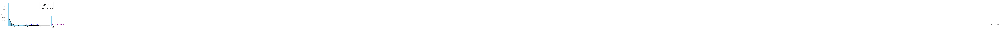

In [31]:
# count the number of cells in each admlevel3 unit
gadm_gdf['cell_count_2015'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2015, affine=gdp_raster.transform, stats=['count'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['cell_count_2015'] = gadm_gdf['cell_count_2015'].apply(lambda x: x['count'] if isinstance(x, dict) else x)

# raster between 0 and 25th percentile
# define the stats for the whole AOI
aoi_min_2015 = round(np.nanmin(gdp_array_2015), 2)
aoi_25_percentile_2015 = round(np.nanpercentile(gdp_array_2015, 25), 2)
aoi_75_percentile_2015 = round(np.nanpercentile(gdp_array_2015, 75), 2)
aoi_max_2015 = round(np.nanmax(gdp_array_2015), 2)

# Calculate IQR to identify outliers
aoi_iqr_2015 = aoi_75_percentile_2015 - aoi_25_percentile_2015
upper_bound_2015 = aoi_75_percentile_2015 + 1.5 * aoi_iqr_2015

# Get a max value that excludes outliers
aoi_max_no_outliers_2015 = round(min(aoi_max_2015, upper_bound_2015), 2)

gdp_array_2015_clipped = np.where(gdp_array_2015 > aoi_max_no_outliers_2015, aoi_max_no_outliers_2015, gdp_array_2015)
aoi_median_2015 = round(np.nanmedian(gdp_array_2015_clipped), 2)
aoi_mean_2015 = round(np.nanmean(gdp_array_2015_clipped), 2)


#plot the histogram of GDP per capita PPP for 2015 with vertical lines for the summary statistics
plt.figure(figsize=(10,5))
plt.hist(gdp_array_2015_clipped.flatten(), bins=50, color='skyblue', edgecolor='black')
plt.axvline(aoi_min_2015, color='red', linestyle='dashed', linewidth=1, label='Min')
plt.axvline(aoi_25_percentile_2015, color='orange', linestyle='dashed', linewidth=1, label='25th Percentile')
plt.axvline(aoi_median_2015, color='green', linestyle='dashed', linewidth=1, label='Median')
plt.axvline(aoi_75_percentile_2015, color='blue', linestyle='dashed', linewidth=1, label='75th Percentile')
plt.axvline(upper_bound_2015, color='purple', linestyle='dashed', linewidth=1, label='upper bound (no outliers)')
plt.title('Histogram of GDP per capita PPP (2015) with summary statistics')
# add a label to each line with the value
plt.text(aoi_min_2015, 1000, f'Min: {aoi_min_2015}', rotation=0, color='red', va='bottom', ha='left')
plt.text(aoi_25_percentile_2015, 2000, f'25th Percentile: {aoi_25_percentile_2015}', rotation=0, color='orange', va='bottom', ha='left')
plt.text(aoi_median_2015, 3000, f'Median: {aoi_median_2015}', rotation=0, color='green', va='bottom', ha='left')
plt.text(aoi_75_percentile_2015, 4000, f'75th Percentile: {aoi_75_percentile_2015}', rotation=0, color='blue', va='bottom', ha='left')
plt.text(upper_bound_2015, 5000, f'Upper bound: {upper_bound_2015}', rotation=0, color='purple', va='bottom', ha='left')
plt.text(aoi_max_2015, 6000, f'Max: {aoi_max_2015}', rotation=0, color='black', va='bottom', ha='left')
plt.xlabel('GDP per capita PPP')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [32]:
cols_to_drop = ['cells_25th_mean_2015', 'cells_mean_75th_2015']
for col in gadm_gdf.columns:
    if col in cols_to_drop:
        gadm_gdf = gadm_gdf.drop(columns=col)
        print(f"Dropped column: {col}")

gdp_array_2015_0_25th = np.where((gdp_array_2015 >= aoi_min_2015) & (gdp_array_2015 < aoi_25_percentile_2015), gdp_array_2015, np.nan)
# count the number of cells in each admin2 unit for 2015 between 0 and the 25th percentile
gadm_gdf['cells_0_25th_2015'] = rasterstats.zonal_stats(
    gadm_gdf, 
    gdp_array_2015_0_25th, 
    affine=gdp_raster.transform, 
    stats=['count'], 
    nodata=gdp_raster.nodata, 
    all_touched=False,
    geojson_out=False, 
    raster_out=False# ,
    #category_map={i: 'count' for i in range(0, int(gadm_gdf['percentile_25_2000'].max()) + 1)}
)
gadm_gdf['cells_0_25th_2015'] = gadm_gdf['cells_0_25th_2015'].apply(lambda x: x['count'] if isinstance(x, dict) else x)

# raster between the 25th percentile and the mean
gdp_array_2015_25_median = np.where((gdp_array_2015 >= aoi_25_percentile_2015) & (gdp_array_2015 < aoi_mean_2015), gdp_array_2015, np.nan)

# count the number of cells in each admin3 unit for 2015 between the 25th percentile and the median
gadm_gdf['cells_25th_median_2015'] = rasterstats.zonal_stats(
    gadm_gdf, 
    gdp_array_2015_25_median, 
    affine=gdp_raster.transform, 
    stats=['count'], 
    nodata=gdp_raster.nodata, 
    all_touched=False,
    geojson_out=False, 
    raster_out=False
)
gadm_gdf['cells_25th_median_2015'] = gadm_gdf['cells_25th_median_2015'].apply(lambda x: x['count'] if isinstance(x, dict) else x)
# raster between the mean and the 75th percentile

gdp_array_2015_median_75th = np.where((gdp_array_2015 >= aoi_median_2015) & (gdp_array_2015 < aoi_75_percentile_2015), gdp_array_2015, np.nan)
# count the number of cells in each admin3 unit for 2015 between the median and the 75th percentile
gadm_gdf['cells_median_75th_2015'] = rasterstats.zonal_stats(
    gadm_gdf, 
    gdp_array_2015_median_75th, 
    affine=gdp_raster.transform, 
    stats=['count'], 
    nodata=gdp_raster.nodata, 
    all_touched=False,
    geojson_out=False, 
    raster_out=False
)
gadm_gdf['cells_median_75th_2015'] = gadm_gdf['cells_median_75th_2015'].apply(lambda x: x['count'] if isinstance(x, dict) else x)

# repeat for cells above the 75th percentile
gdp_array_2015_75th = np.where((gdp_array_2015 > aoi_75_percentile_2015), gdp_array_2015, np.nan)
# count the number of cells in each admin3 unit for 2015 above the 75th percentile
gadm_gdf['cells_75th_max_2015'] = rasterstats.zonal_stats(
    gadm_gdf,
    gdp_array_2015_75th,
    affine=gdp_raster.transform,
    stats=['count'],
    nodata=gdp_raster.nodata,
    all_touched=False,
    geojson_out=False,
    raster_out=False
)
gadm_gdf['cells_75th_max_2015'] = gadm_gdf['cells_75th_max_2015'].apply(lambda x: x['count'] if isinstance(x, dict) else x)
gadm_gdf.head()

,ADM3_EN,ADM3_PCODE,ADM2_EN,ADM2_PCODE,Shape_Leng,Shape_Area,geometry,mean_2000,min_2000,max_2000,...,gdp_min_2025,gdp_max_2025,gdp_std_2025,percentile_25_2025,percentile_75_2025,cell_count_2015,cells_0_25th_2015,cells_25th_median_2015,cells_median_75th_2015,cells_75th_max_2015
1,Dramaga,ID3201060,Bogor,ID3201,41764.274838,2.560295e+07,"POLYGON ((690340.922 9266867.007, 690319.857 9...",8.931283e+06,1.310419e+06,25374336.0,...,{'min': 6293534.0},{'max': 115780856.0},{'std': 30070173.558246847},13026109.5,6.521459e+07,1131,0,631,725,404
2,Tanjung Priok,ID3175030,Kota Jakarta Utara,ID3175,34408.190734,2.243273e+07,"MULTIPOLYGON (((709230.77 9320652.394, 709230....",1.900308e+08,2.183574e+07,285240608.0,...,{'min': 144676960.0},{'max': 1454783232.0},{'std': 247338045.84105578},836029888.0,1.168528e+09,994,0,0,0,994
3,Babelan,ID3216090,Bekasi,ID3216,64962.606224,6.596211e+07,"POLYGON ((726616.911 9317178.419, 726626.763 9...",9.075047e+06,5.905180e+01,80008672.0,...,{'min': 295.751220703125},{'max': 576112512.0},{'std': 109830290.58210272},5801385.0,7.390318e+07,2937,165,1875,1159,787
4,Karang Tengah,ID3671012,Kota Tangerang,ID3671,18969.492864,9.849298e+06,"POLYGON ((690314.793 9313251.924, 690314.99 93...",5.394436e+07,1.933895e+07,99847840.0,...,{'min': 181507136.0},{'max': 673912448.0},{'std': 102620516.27408628},361695200.0,4.937879e+08,437,0,0,0,437
6,Ciledug,ID3671010,Kota Tangerang,ID3671,15279.927726,8.944131e+06,"POLYGON ((689186.943 9308629.595, 689149.261 9...",4.903508e+07,3.004989e+07,73889544.0,...,{'min': 291613440.0},{'max': 563890048.0},{'std': 72126099.23584892},359798544.0,4.907711e+08,400,0,0,0,400


## repeating for 2025

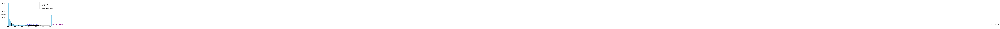

In [33]:
# count the number of cells in each admin3 unit
gadm_gdf['cell_count_2025'] = rasterstats.zonal_stats(gadm_gdf, gdp_array_2025, affine=gdp_raster.transform, stats=['count'], nodata=gdp_raster.nodata, geojson_out=False, raster_out=False)
gadm_gdf['cell_count_2025'] = gadm_gdf['cell_count_2025'].apply(lambda x: x['count'] if isinstance(x, dict) else x)

# raster between 0 and 25th percentile
# define the stats for the whole AOI
aoi_min_2025 = round(np.nanmin(gdp_array_2025), 2)
aoi_25_percentile_2025 = round(np.nanpercentile(gdp_array_2025, 25), 2)
aoi_75_percentile_2025 = round(np.nanpercentile(gdp_array_2025, 75), 2)
aoi_max_2025 = round(np.nanmax(gdp_array_2025), 2)

# Calculate IQR to identify outliers
aoi_iqr_2025 = aoi_75_percentile_2025 - aoi_25_percentile_2025
upper_bound_2025 = aoi_75_percentile_2025 + 1.5 * aoi_iqr_2025

# Get a max value that excludes outliers
aoi_max_no_outliers_2025 = round(min(aoi_max_2025, upper_bound_2025), 2)

gdp_array_2025_clipped = np.where(gdp_array_2025 > aoi_max_no_outliers_2025, aoi_max_no_outliers_2025, gdp_array_2025)
aoi_median_2025 = round(np.nanmedian(gdp_array_2025_clipped), 2)
aoi_mean_2025 = round(np.nanmean(gdp_array_2025_clipped), 2)


#plot the histogram of GDP per capita PPP for 2020
plt.figure(figsize=(10,5))
plt.hist(gdp_array_2025_clipped.flatten(), bins=50, color='skyblue', edgecolor='black')
plt.axvline(aoi_min_2025, color='red', linestyle='dashed', linewidth=1, label='Min')
plt.axvline(aoi_25_percentile_2025, color='orange', linestyle='dashed', linewidth=1, label='25th Percentile')
plt.axvline(aoi_median_2025, color='green', linestyle='dashed', linewidth=1, label='Median')
plt.axvline(aoi_75_percentile_2025, color='blue', linestyle='dashed', linewidth=1, label='75th Percentile')
plt.axvline(upper_bound_2025, color='purple', linestyle='dashed', linewidth=1, label='upper bound (no outliers)')
plt.title('Histogram of GDP per capita PPP (2025) with summary statistics')
# add a label to each line with the value
plt.text(aoi_min_2025, 1000, f'Min: {aoi_min_2025}', rotation=0, color='red', va='bottom', ha='left')
plt.text(aoi_25_percentile_2025, 2000, f'25th Percentile: {aoi_25_percentile_2025}', rotation=0, color='orange', va='bottom', ha='left')
plt.text(aoi_median_2025, 3000, f'Median: {aoi_median_2025}', rotation=0, color='green', va='bottom', ha='left')
plt.text(aoi_75_percentile_2025, 4000, f'75th Percentile: {aoi_75_percentile_2025}', rotation=0, color='blue', va='bottom', ha='left')
plt.text(upper_bound_2025, 5000, f'Upper bound: {upper_bound_2025}', rotation=0, color='purple', va='bottom', ha='left')
plt.text(aoi_max_2025, 6000, f'Max: {aoi_max_2025}', rotation=0, color='black', va='bottom', ha='left')
plt.xlabel('GDP per capita PPP')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [34]:
cols_to_drop = ['cells_25th_mean_2025', 'cells_mean_75th_2025']
for col in gadm_gdf.columns:
    if col in cols_to_drop:
        gadm_gdf = gadm_gdf.drop(columns=col)
        print(f"Dropped column: {col}")

gdp_array_2025_0_25th = np.where((gdp_array_2025 >= aoi_min_2025) & (gdp_array_2025 < aoi_25_percentile_2025), gdp_array_2025, np.nan)
# count the number of cells in each admin3 unit for 2025 between 0 and the 25th percentile
gadm_gdf['cells_0_25th_2025'] = rasterstats.zonal_stats(
    gadm_gdf, 
    gdp_array_2025_0_25th, 
    affine=gdp_raster.transform, 
    stats=['count'], 
    nodata=gdp_raster.nodata, 
    all_touched=False,
    geojson_out=False, 
    raster_out=False# ,
    #category_map={i: 'count' for i in range(0, int(gadm_gdf['percentile_25_2000'].max()) + 1)}
)
gadm_gdf['cells_0_25th_2025'] = gadm_gdf['cells_0_25th_2025'].apply(lambda x: x['count'] if isinstance(x, dict) else x)

# raster between the 25th percentile and the mean
gdp_array_2025_25_median = np.where((gdp_array_2025 >= aoi_25_percentile_2025) & (gdp_array_2025 < aoi_mean_2025), gdp_array_2025, np.nan)

# count the number of cells in each admin3 unit for 2025 between the 25th percentile and the median
gadm_gdf['cells_25th_median_2025'] = rasterstats.zonal_stats(
    gadm_gdf, 
    gdp_array_2025_25_median, 
    affine=gdp_raster.transform, 
    stats=['count'], 
    nodata=gdp_raster.nodata, 
    all_touched=False,
    geojson_out=False, 
    raster_out=False
)
gadm_gdf['cells_25th_median_2025'] = gadm_gdf['cells_25th_median_2025'].apply(lambda x: x['count'] if isinstance(x, dict) else x)
# raster between the mean and the 75th percentile

gdp_array_2025_median_75th = np.where((gdp_array_2025 >= aoi_median_2025) & (gdp_array_2025 < aoi_75_percentile_2025), gdp_array_2025, np.nan)
# count the number of cells in each admin3 unit for 2025 between the median and the 75th percentile
gadm_gdf['cells_median_75th_2025'] = rasterstats.zonal_stats(
    gadm_gdf, 
    gdp_array_2025_median_75th, 
    affine=gdp_raster.transform, 
    stats=['count'], 
    nodata=gdp_raster.nodata, 
    all_touched=False,
    geojson_out=False, 
    raster_out=False
)
gadm_gdf['cells_median_75th_2025'] = gadm_gdf['cells_median_75th_2025'].apply(lambda x: x['count'] if isinstance(x, dict) else x)

# repeat for cells above the 75th percentile
gdp_array_2025_75th = np.where((gdp_array_2025 > aoi_75_percentile_2025), gdp_array_2025, np.nan)
# count the number of cells in each admin3 unit for 2025 above the 75th percentile
gadm_gdf['cells_75th_max_2025'] = rasterstats.zonal_stats(
    gadm_gdf,
    gdp_array_2025_75th,
    affine=gdp_raster.transform,
    stats=['count'],
    nodata=gdp_raster.nodata,
    all_touched=False,
    geojson_out=False,
    raster_out=False
)
gadm_gdf['cells_75th_max_2025'] = gadm_gdf['cells_75th_max_2025'].apply(lambda x: x['count'] if isinstance(x, dict) else x)
gadm_gdf.head()

,ADM3_EN,ADM3_PCODE,ADM2_EN,ADM2_PCODE,Shape_Leng,Shape_Area,geometry,mean_2000,min_2000,max_2000,...,cell_count_2015,cells_0_25th_2015,cells_25th_median_2015,cells_median_75th_2015,cells_75th_max_2015,cell_count_2025,cells_0_25th_2025,cells_25th_median_2025,cells_median_75th_2025,cells_75th_max_2025
1,Dramaga,ID3201060,Bogor,ID3201,41764.274838,2.560295e+07,"POLYGON ((690340.922 9266867.007, 690319.857 9...",8.931283e+06,1.310419e+06,25374336.0,...,1131,0,631,725,404,1131,0,653,742,379
2,Tanjung Priok,ID3175030,Kota Jakarta Utara,ID3175,34408.190734,2.243273e+07,"MULTIPOLYGON (((709230.77 9320652.394, 709230....",1.900308e+08,2.183574e+07,285240608.0,...,994,0,0,0,994,994,0,0,0,994
3,Babelan,ID3216090,Bekasi,ID3216,64962.606224,6.596211e+07,"POLYGON ((726616.911 9317178.419, 726626.763 9...",9.075047e+06,5.905180e+01,80008672.0,...,2937,165,1875,1159,787,2937,122,1764,1278,829
4,Karang Tengah,ID3671012,Kota Tangerang,ID3671,18969.492864,9.849298e+06,"POLYGON ((690314.793 9313251.924, 690314.99 93...",5.394436e+07,1.933895e+07,99847840.0,...,437,0,0,0,437,437,0,0,0,437
6,Ciledug,ID3671010,Kota Tangerang,ID3671,15279.927726,8.944131e+06,"POLYGON ((689186.943 9308629.595, 689149.261 9...",4.903508e+07,3.004989e+07,73889544.0,...,400,0,0,0,400,400,0,0,0,400


In [47]:
writer.close()

IndexError: At least one sheet must be visible

In [49]:
# export the updated gadm_gdf with GDP statistics to a shapefile
gadm_output_file = case_city + '_ECO_GDP_PPP_admin3_stats_A.shp'
gadm_output_path = interim_path / gadm_output_file
gadm_gdf.to_file(gadm_output_path, crs = 'EPSG:32748', engine='fiona')

# export to excel
gadm_output_file_excel = case_city + '_ECO_GDP_PPP2.xlsx'
gadm_output_path_excel = interim_path / gadm_output_file_excel

#gadm_gdf.drop(columns='geometry').to_excel(writer, index=False, sheet_name='admin3_gdp_stats')

#for col in gadm_gdf.columns:
    #print(col, gadm_gdf[col].dtype)

# dissolve using per-column agg funcs based on data types
agg = {}
for col in gadm_gdf.columns:
    if col == 'geometry':
        continue
    if pd.api.types.is_numeric_dtype(gadm_gdf[col]):
        agg[col] = 'sum'
    elif gadm_gdf[col].dtype == object:
        # Check if the column contains dicts
        if gadm_gdf[col].apply(lambda x: isinstance(x, dict)).any():
            # For columns with dicts, use 'first' or drop them
            agg[col] = 'first'  # or you could skip: continue
        else:
            agg[col] = 'first'
    else:
        agg[col] = 'first'

gadm_lvl2_gdf = gadm_gdf.dissolve(by='ADM2_EN', aggfunc=agg)
#gadm_lvl2_gdf = gadm_lvl2_gdf.reset_index()
#gadm_lvl2_gdf.drop(columns='geometry').to_excel(writer, index=False, sheet_name='admin2_gdp_stats') #, mode='a'

with pd.ExcelWriter(gadm_output_path_excel, engine='openpyxl') as writer:  #, mode='a'
    gadm_gdf.drop(columns='geometry').to_excel(writer, sheet_name='admin3_gdp_stats')
    gadm_lvl2_gdf.drop(columns='geometry').to_excel(writer, sheet_name='admin2_gdp_stats')




# 12. Real estate prices
- Convert point data into raster
- Clip points to the AOI
- Interpolate to cover all AOI
- Ressample and co-register to 30 m grid
- Convert prices to USD <br>
Source: Lepetit Q, Viguié V, Liotta C. A gridded dataset on densities, real estate prices, transport, and land use inside 192 worldwide urban areas. Data in Brief. 2023;47:108962. doi:[10.1016/j.dib.2023.108962](https://linkinghub.elsevier.com/retrieve/pii/S235234092300080X)

## MUM & JAK: Working with Lepetit et al. 2023 data

In [44]:
# This section does not work with the generic AOI definition yet.
# the database takes 192 cities globally, so we need to filter the data to the city at hand

# import file to be clipped
real_estate_path = Path('\\WD PETIT et al Gridded Real Estate Population and Land Use\\RealEstateData.csv')

full_path = external_data_path.joinpath(*real_estate_path.parts[1:])
#print(real_estate_path,'\n', external_data_path,'\n', full_path)   

real_estate_df = pd.read_csv(full_path)
# convert values to USD
conversion_dict = {'INR':0.0113, 'IDR':0.000060} # values from google finance on 08.10.2025 https://www.google.com/finance/quote/INR-USD
for key, value in conversion_dict.items():
    real_estate_df.loc[real_estate_df['Currency'] == key, 'dolar_avgPriceSqm'] = round(real_estate_df['avgPriceSqm']*value,2)
    real_estate_df.loc[real_estate_df['Currency'] == key, 'dolar_medPriceSqm'] = round(real_estate_df['medPriceSqm']*value,2)

# check the case city 
if case_city == 'MUM': city_name = 'Mumbai'
elif case_city == 'JAK': city_name = 'Jakarta'

print('Total records:',real_estate_df.shape,'\n', 'Records for',city_name,':',real_estate_df[real_estate_df['City'] == city_name].shape)

Total records: (3339366, 40) 
 Records for Jakarta : (40608, 40)


In [47]:
# create a new dataframe with the cities and the average real estate price per square meter
city_df = real_estate_df.groupby('City').agg({'dolar_avgPriceSqm':'mean','dolar_medPriceSqm':'mean'}).reset_index()
city_df = city_df.dropna(axis=0,how='any',subset=['dolar_avgPriceSqm','dolar_medPriceSqm'])
city_df

,City,dolar_avgPriceSqm,dolar_medPriceSqm
4,Ahmedabad,288.440972,269.160648
12,Bandung,422.774010,414.750937
13,Bangalore,285.204956,275.227172
54,Delhi,588.047881,531.741269
75,Hyderabad,299.688349,287.693779
79,Jakarta,640.882269,633.714470
105,Medan,586.176933,560.620000
114,Mumbai,593.741661,578.029944
164,Surabaya,498.162486,475.615249


In [67]:
col_list = ['X','Y','avgSize','medSize','avgPriceSqm','medPriceSqm','Currency','avgPriceSqm_percentilesOutliers','medPriceSqm_percentilesOutliers',
                                            'TransactionType','TransactionMonth','TransactionYear','dolar_avgPriceSqm','dolar_medPriceSqm']

# Create a dictionary for renaming long column names to fit shapefile limitations
dict_rename_cols = {
    'avgPriceSqm': 'aPm2',
    'medPriceSqm': 'mPm2',
    'avgPriceSqm_percentilesOutliers': 'aPm2_pcO',
    'medPriceSqm_percentilesOutliers': 'mPm2_pcO',
    'dolar_avgPriceSqm': 'aPm2_USD',
    'dolar_medPriceSqm': 'mPm2_USD',
    'TransactionType': 'TrType',
    'TransactionMonth': 'TrMon',
    'TransactionYear': 'TrYear'
}

real_estate_sale = real_estate_df.loc[(real_estate_df.City==city_name)&(real_estate_df.TransactionType == 'Sale'),col_list]
real_estate_rent = real_estate_df.loc[(real_estate_df.City==city_name)&(real_estate_df.TransactionType == 'Rent'),col_list]
crs = 'EPSG:' + str(real_estate_df.loc[(real_estate_df.City==city_name)].GridEPSG.unique()[0])

# Creating GeoDataFrames
real_estate_sale_gdf = gpd.GeoDataFrame(real_estate_sale, geometry=gpd.points_from_xy(real_estate_sale.X, real_estate_sale.Y), crs=crs).to_crs(AOI_gdf.crs).clip(mask=AOI_gdf, keep_geom_type=True)
real_estate_rent_gdf = gpd.GeoDataFrame(real_estate_rent, geometry=gpd.points_from_xy(real_estate_rent.X, real_estate_rent.Y), crs=crs).to_crs(AOI_gdf.crs).clip(mask=AOI_gdf, keep_geom_type=True)
print('Real estate sales shape for {}:'.format(city_name), real_estate_sale_gdf.shape, '\nReal estate rentals shape for {}:'.format(city_name), real_estate_rent_gdf.shape)

## apply the dict to the gdf
real_estate_sale_gdf = real_estate_sale_gdf.rename(columns=dict_rename_cols)
real_estate_rent_gdf = real_estate_rent_gdf.rename(columns=dict_rename_cols)

rent_cols_list = real_estate_rent_gdf.columns

rent_big_cols_list = []

for col in rent_cols_list:
    if len(col) > 8:
        rent_big_cols_list.append(col)
print('Large col names in rentals:', rent_big_cols_list)

real_estate_sale_gdf.describe()

Real estate sales shape for Jakarta: (10580, 15) 
Real estate rentals shape for Jakarta: (10580, 15)
Large col names in rentals: []


,X,Y,avgSize,medSize,aPm2,mPm2,aPm2_pcO,mPm2_pcO,TrYear,aPm2_USD,mPm2_USD
count,10580.000000,1.058000e+04,488.000000,488.000000,4.880000e+02,4.880000e+02,4.630000e+02,4.630000e+02,10580.0,488.000000,488.000000
mean,696872.678900,9.305288e+06,97.545377,89.965164,1.898993e+07,1.878081e+07,1.878576e+07,1.870372e+07,2019.0,1139.395963,1126.848586
std,33197.954284,2.655780e+04,82.212951,81.081972,1.438419e+07,1.429553e+07,7.858299e+06,7.928150e+06,0.0,863.051459,857.731918
min,639872.678900,9.259788e+06,10.000000,10.000000,5.000000e+05,5.000000e+05,5.312500e+06,5.312500e+06,2019.0,30.000000,30.000000
25%,667872.678900,9.282538e+06,40.000000,36.000000,1.296296e+07,1.300000e+07,1.369524e+07,1.366342e+07,2019.0,777.780000,780.000000
50%,696872.678900,9.305288e+06,72.500000,63.000000,1.634802e+07,1.637880e+07,1.711628e+07,1.680000e+07,2019.0,980.880000,982.730000
75%,725872.678900,9.328038e+06,118.825000,110.250000,2.196074e+07,2.142857e+07,2.236024e+07,2.186221e+07,2019.0,1317.645000,1285.710000
max,753872.678900,9.350788e+06,550.000000,550.000000,2.678571e+08,2.678571e+08,5.000000e+07,5.000000e+07,2019.0,16071.430000,16071.430000


In [ ]:

print("Initial shape:", real_estate_sale_gdf.shape)
real_estate_sale_gdf = real_estate_sale_gdf[real_estate_sale_gdf[var1] >= 1]
print(f"Shape after filtering {var1} < 1:", real_estate_sale_gdf.shape)
print(f"Min {var1}: {real_estate_sale_gdf[var1].min():.2f}, Max {var1}: {real_estate_sale_gdf[var1].max():.2f}")

# Remove outliers using z-score for the selected variable
z_scores = stats.zscore(real_estate_sale_gdf[var1].dropna())
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3)
real_estate_sale_gdf = real_estate_sale_gdf[real_estate_sale_gdf[var1].notna()].loc[filtered_entries.index[filtered_entries]]
print(f"Shape after z-score filtering on {var1}:", real_estate_sale_gdf.shape)
print(f"Min {var1}: {real_estate_sale_gdf[var1].min():.2f}, Max {var1}: {real_estate_sale_gdf[var1].max():.2f}")

# Do the same for the second variable if it has different values
if not real_estate_sale_gdf[var1].equals(real_estate_sale_gdf[var2]):
    z_scores2 = stats.zscore(real_estate_sale_gdf[var2].dropna())
    abs_z_scores2 = np.abs(z_scores2)
    filtered_entries2 = (abs_z_scores2 < 3)
    real_estate_sale_gdf = real_estate_sale_gdf[real_estate_sale_gdf[var2].notna()].loc[filtered_entries2.index[filtered_entries2]]
    print(f"Shape after z-score filtering on {var2}:", real_estate_sale_gdf.shape)
    print(f"Min {var2}: {real_estate_sale_gdf[var2].min():.2f}, Max {var2}: {real_estate_sale_gdf[var2].max():.2f}")



### removing outliers

Initial shape: (466, 15)
After filtering aPm2_USD < 1, shape is: (466, 15)
After filtering aPm2_USD < 1 and z-score outliers, shape is: (466, 15)
Min aPm2_USD: 30.00, Max aPm2_USD: 2230.25
After filtering mPm2_USD < 1, shape is: (466, 15)
After filtering mPm2_USD < 1 and z-score outliers, shape is: (466, 15)
Min mPm2_USD: 30.00, Max mPm2_USD: 2229.73


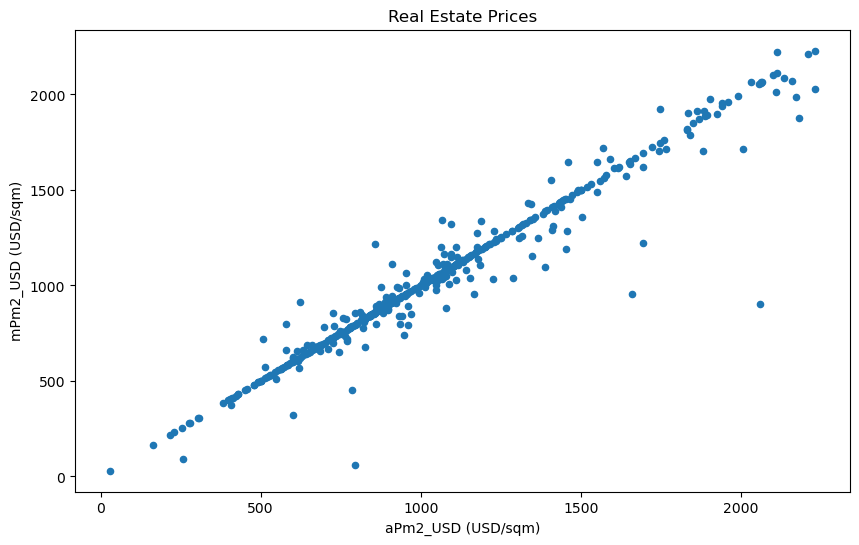

In [73]:
# let's use the Z-score to remove outliers
from scipy import stats

def remove_outliers(df, var_list): # Filter out invalid values first (less than 1 USD/sqm)
    print("Initial shape:", df.shape)
    for var in var_list:
        df = df[df[var] >= 1]
        print(f"After filtering {var} < 1, shape is: {df.shape}")
        # Remove outliers using z-score
        z_scores = stats.zscore(df[var].dropna())
        abs_z_scores = np.abs(z_scores)
        filtered_entries = (abs_z_scores < 3)
        df = df[df[var].notna()].loc[filtered_entries.index[filtered_entries]]
        print(f"After filtering {var} < 1 and z-score outliers, shape is: {df.shape}")
        print(f"Min {var}: {df[var].min():.2f}, Max {var}: {df[var].max():.2f}")
    return df


var_list = ['aPm2_USD', 'mPm2_USD'] # we'll mostly use the average price per square meter in USD
real_estate_sale_gdf = remove_outliers(real_estate_sale_gdf, var_list)

# Plot the data
fig, ax = plt.subplots(figsize=(10, 6))
real_estate_sale_gdf.plot(x=var_list[0], y=var_list[1], kind='scatter', ax=ax)
ax.set_xlabel(f'{var_list[0]} (USD/sqm)')
ax.set_ylabel(f'{var_list[1]} (USD/sqm)')
ax.set_title('Real Estate Prices')
plt.show()


Initial shape: (366, 15)
After filtering aPm2_USD < 1, shape is: (366, 15)
After filtering aPm2_USD < 1 and z-score outliers, shape is: (366, 15)
Min aPm2_USD: 1.00, Max aPm2_USD: 17.25
After filtering mPm2_USD < 1, shape is: (366, 15)
After filtering mPm2_USD < 1 and z-score outliers, shape is: (366, 15)
Min mPm2_USD: 1.00, Max mPm2_USD: 17.25


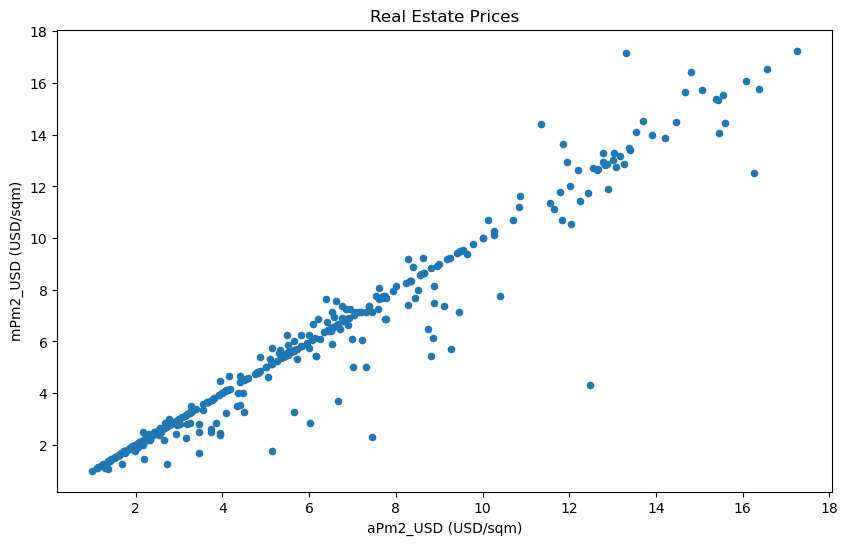

In [79]:
# repeat the process for the rental data
var_list = ['aPm2_USD', 'mPm2_USD'] # we'll mostly use the average price per square meter in USD
real_estate_rent_gdf = remove_outliers(real_estate_rent_gdf, var_list)

# Plot the data
fig, ax = plt.subplots(figsize=(10, 6))
real_estate_rent_gdf.plot(x=var_list[0], y=var_list[1], kind='scatter', ax=ax)
ax.set_xlabel(f'{var_list[0]} (USD/sqm)')
ax.set_ylabel(f'{var_list[1]} (USD/sqm)')
ax.set_title('Real Estate Prices')
plt.show()


In [ ]:
# let's use the Z-score to remove outliers
from scipy import stats
var1 = 'aPm2_USD' # we'll mostly use the average price per square meter in USD
var2 = 'mPm2_USD'
# Filter out invalid values first (less than 1 USD/sqm)
real_estate_rent_gdf = real_estate_rent_gdf[real_estate_rent_gdf[var1] >= 1]
print(f"Shape after filtering {var1} < 1:", real_estate_rent_gdf.shape)
print(f"Min {var1}: {real_estate_rent_gdf[var1].min():.2f}, Max {var1}: {real_estate_rent_gdf[var1].max():.2f}")

# Remove outliers using z-score for the selected variable
z_scores = stats.zscore(real_estate_rent_gdf[var1].dropna())
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3)
real_estate_sale_gdf = real_estate_sale_gdf[real_estate_sale_gdf[var1].notna()].loc[filtered_entries.index[filtered_entries]]
print(f"Shape after z-score filtering on {var1}:", real_estate_sale_gdf.shape)
print(f"Min {var1}: {real_estate_sale_gdf[var1].min():.2f}, Max {var1}: {real_estate_sale_gdf[var1].max():.2f}")

# Do the same for the second variable if it has different values
if not real_estate_sale_gdf[var1].equals(real_estate_sale_gdf[var2]):
    z_scores2 = stats.zscore(real_estate_sale_gdf[var2].dropna())
    abs_z_scores2 = np.abs(z_scores2)
    filtered_entries2 = (abs_z_scores2 < 3)
    real_estate_sale_gdf = real_estate_sale_gdf[real_estate_sale_gdf[var2].notna()].loc[filtered_entries2.index[filtered_entries2]]
    print(f"Shape after z-score filtering on {var2}:", real_estate_sale_gdf.shape)
    print(f"Min {var2}: {real_estate_sale_gdf[var2].min():.2f}, Max {var2}: {real_estate_sale_gdf[var2].max():.2f}")

# Plot the data
fig, ax = plt.subplots(figsize=(10, 6))
real_estate_sale_gdf.plot(x=var1, y=var2, kind='scatter', ax=ax)
ax.set_xlabel(f'{var1} (USD/sqm)')
ax.set_ylabel(f'{var2} (USD/sqm)')
ax.set_title('Real Estate Prices')
plt.show()

### exploring the real estate distribution

In [82]:
real_estate_sale

,X,Y,avgSize,medSize,avgPriceSqm,medPriceSqm,Currency,avgPriceSqm_percentilesOutliers,medPriceSqm_percentilesOutliers,TransactionType,TransactionMonth,TransactionYear,dolar_avgPriceSqm,dolar_medPriceSqm
575081,595872.6789,9352788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
575082,596872.6789,9352788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
575083,597872.6789,9352788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
575084,598872.6789,9352788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
575085,599872.6789,9352788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595380,806872.6789,9259788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
595381,807872.6789,9259788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
595382,808872.6789,9259788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN
595383,809872.6789,9259788.361,NaN,NaN,NaN,NaN,IDR,NaN,NaN,Sale,Jun,2019,NaN,NaN


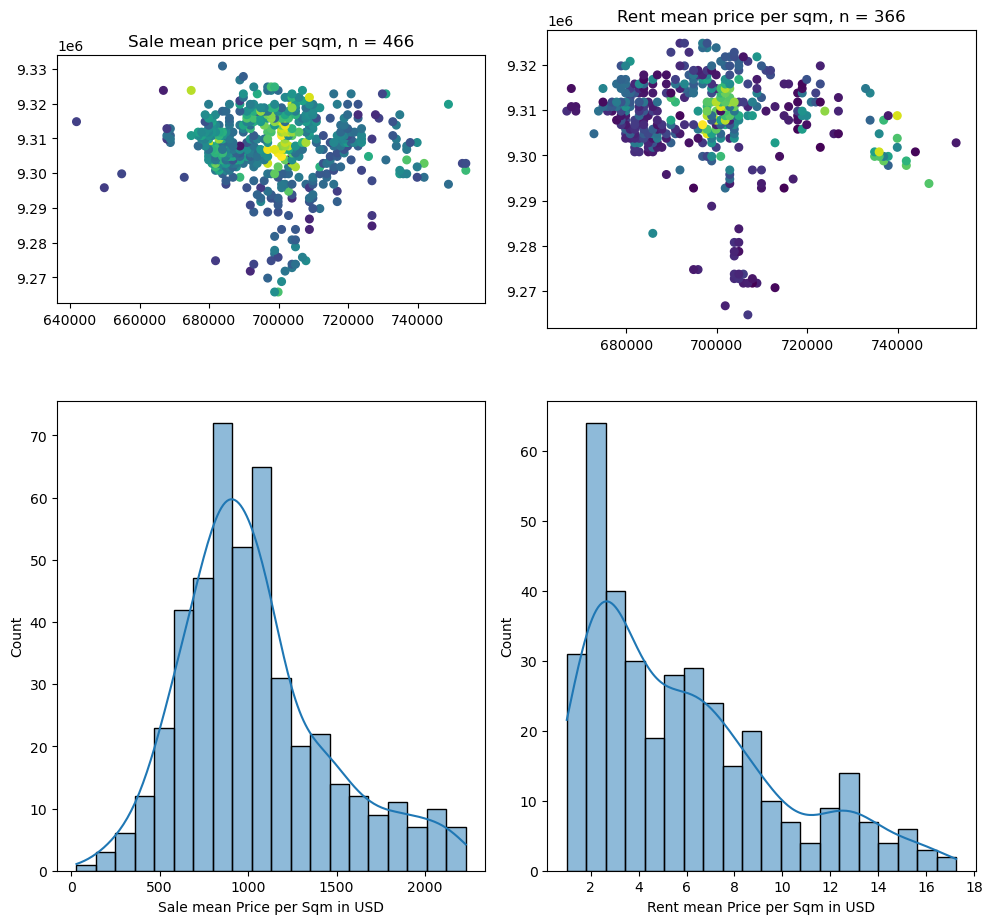

In [84]:
from matplotlib.gridspec import GridSpec
var = 'aPm2_USD'
# Create a figure with GridSpec
fig = plt.figure(figsize=(10, 10))
gs = GridSpec(2, 2, figure=fig)

# Create subplots
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[1, 1])

# Plot GeoDataFrames
real_estate_sale_gdf.plot(var, ax=ax0, legend=False, cmap='viridis', markersize=30)
real_estate_rent_gdf.plot(var, ax=ax1, legend=False, cmap='viridis', markersize=30)

# Plot histograms
vis1 = sns.histplot(x=var, data=real_estate_sale_gdf, bins=20, kde=True, ax=ax2)
vis2 = sns.histplot(x=var, data=real_estate_rent_gdf, bins=20, kde=True, ax=ax3)

# Set titles
ax0.set_title('Sale mean price per sqm, n = ' + str(len(real_estate_sale_gdf)))
ax1.set_title('Rent mean price per sqm, n = ' + str(len(real_estate_rent_gdf)))
# Set x-axis titles for histograms

ax2.set_xlabel('Sale mean Price per Sqm in USD')#+MUM_real_estate_sale.Currency.unique()[0])
ax3.set_xlabel('Rent mean Price per Sqm in USD')#'+MUM_real_estate_rent.Currency.unique()[0])
# Adjust layout to ensure equal column widths
plt.tight_layout()

# Show plot
plt.show()

## working with both JAK and MUM
> this section need adapting to the case-agnostic workflow

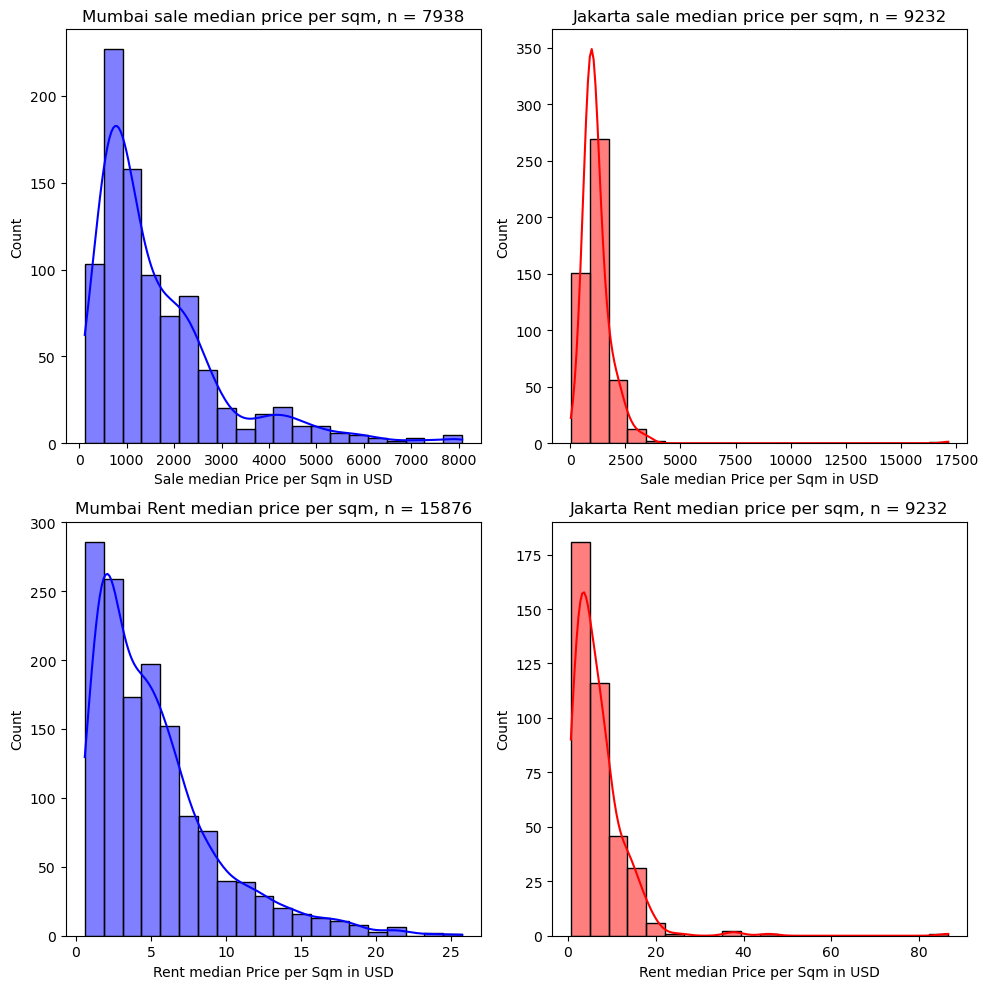

In [ ]:
# plotting and comparing MUM and JAK
fig = plt.figure(figsize=(10, 10))
gs = GridSpec(2, 2, figure=fig)
var = 'dolar_avgPriceSqm'

# Create subplots
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 1])

'''# Plot GeoDataFrames
MUM_real_estate_sale_gdf.plot('medPriceSqm', ax=ax0, legend=False, cmap='viridis', markersize=30)
MUM_real_estate_rent_gdf.plot('medPriceSqm', ax=ax1, legend=False, cmap='viridis', markersize=30)
'''

# Plot histograms
vis1 = sns.histplot(x=var, data=MUM_real_estate_sale, bins=20, kde=True, ax=ax0, color='blue')
vis2 = sns.histplot(x=var, data=MUM_real_estate_rent, bins=20, kde=True, ax=ax1, color='blue')
vis3 = sns.histplot(x=var, data=JAK_real_estate_sale, bins=20, kde=True, ax=ax2, color='red')
vis4 = sns.histplot(x=var, data=JAK_real_estate_rent, bins=20, kde=True, ax=ax3, color='red')

# Set titles
ax0.set_title('Mumbai sale median price per sqm, n = ' + str(len(MUM_real_estate_sale_gdf)))
ax1.set_title('Mumbai Rent median price per sqm, n = ' + str(len(MUM_real_estate_rent_gdf)))
ax2.set_title('Jakarta sale median price per sqm, n = ' + str(len(JAK_real_estate_sale_gdf)))
ax3.set_title('Jakarta Rent median price per sqm, n = ' + str(len(JAK_real_estate_rent_gdf)))

# Set x-axis titles for histograms
ax0.set_xlabel('Sale median Price per Sqm in USD')# '+MUM_real_estate_sale.Currency.unique()[0])
ax1.set_xlabel('Rent median Price per Sqm in USD')# '+MUM_real_estate_rent.Currency.unique()[0])
ax2.set_xlabel('Sale median Price per Sqm in USD')# '+JAK_real_estate_sale.Currency.unique()[0])
ax3.set_xlabel('Rent median Price per Sqm in USD')#'+JAK_real_estate_rent.Currency.unique()[0])

# Adjust layout to ensure equal column widths
plt.tight_layout()

# Show plot
plt.show()


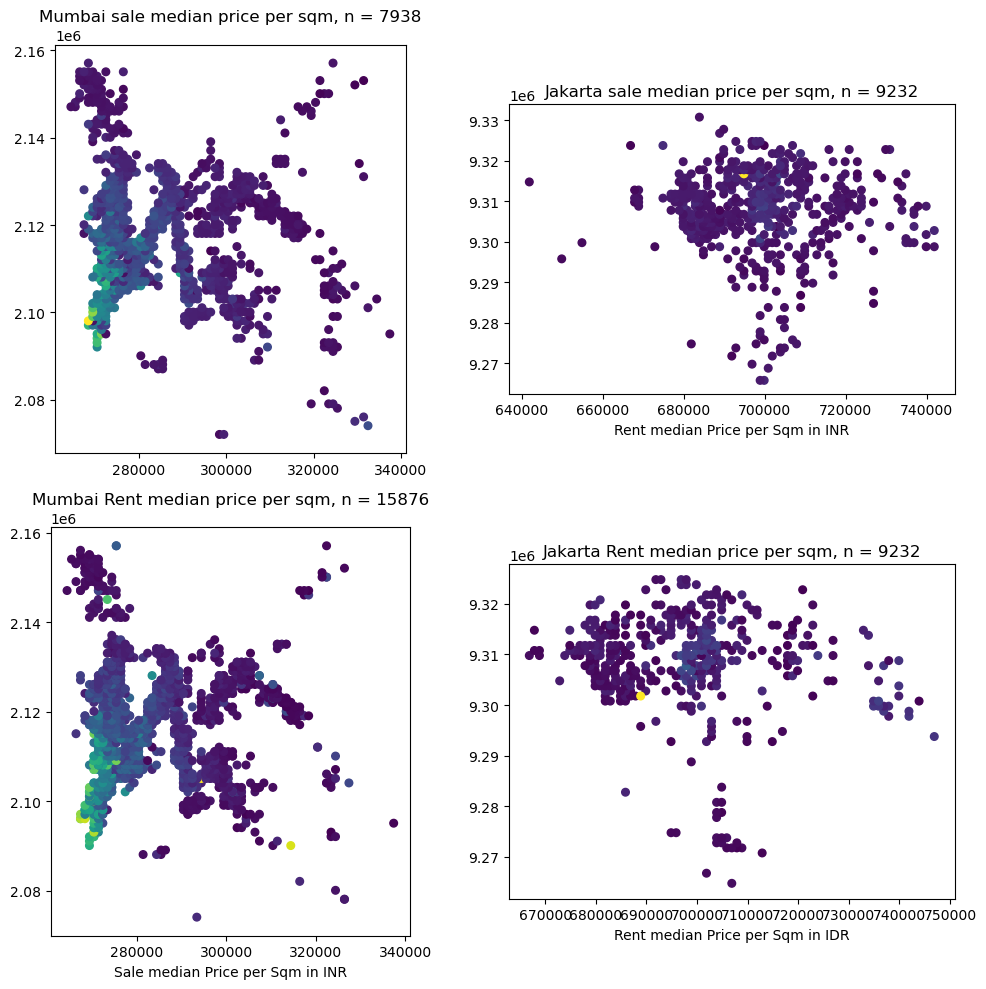

In [ ]:
# plotting and comparing MUM and JAK
fig = plt.figure(figsize=(10, 10))
gs = GridSpec(2, 2, figure=fig)

# Create subplots
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[1, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 1])

# Plot GeoDataFrames
MUM_real_estate_sale_gdf.plot('medPriceSqm', ax=ax0, legend=False, cmap='viridis', markersize=30)
MUM_real_estate_rent_gdf.plot('medPriceSqm', ax=ax1, legend=False, cmap='viridis', markersize=30)
JAK_real_estate_sale_gdf.plot('medPriceSqm', ax=ax2, legend=False, cmap='viridis', markersize=30)
JAK_real_estate_rent_gdf.plot('medPriceSqm', ax=ax3, legend=False, cmap='viridis', markersize=30)


'''# Plot histograms
vis1 = sns.histplot(x='medPriceSqm', data=MUM_real_estate_sale, bins=20, kde=True, ax=ax0)
vis2 = sns.histplot(x='medPriceSqm', data=MUM_real_estate_rent, bins=20, kde=True, ax=ax1)
vis3 = sns.histplot(x='medPriceSqm', data=JAK_real_estate_sale, bins=20, kde=True, ax=ax2)
vis4 = sns.histplot(x='medPriceSqm', data=JAK_real_estate_rent, bins=20, kde=True, ax=ax3)'''

# Set titles
ax0.set_title('Mumbai sale median price per sqm, n = ' + str(len(MUM_real_estate_sale_gdf)))
ax1.set_title('Mumbai Rent median price per sqm, n = ' + str(len(MUM_real_estate_rent_gdf)))
ax2.set_title('Jakarta sale median price per sqm, n = ' + str(len(JAK_real_estate_sale_gdf)))
ax3.set_title('Jakarta Rent median price per sqm, n = ' + str(len(JAK_real_estate_rent_gdf)))

# Set x-axis titles for histograms
ax1.set_xlabel('Sale median Price per Sqm in '+MUM_real_estate_sale.Currency.unique()[0])
ax2.set_xlabel('Rent median Price per Sqm in '+MUM_real_estate_rent.Currency.unique()[0])
ax3.set_xlabel('Sale median Price per Sqm in '+JAK_real_estate_sale.Currency.unique()[0])
ax3.set_xlabel('Rent median Price per Sqm in '+JAK_real_estate_rent.Currency.unique()[0])

# Adjust layout to ensure equal column widths
plt.tight_layout()

# Show plot
plt.show()


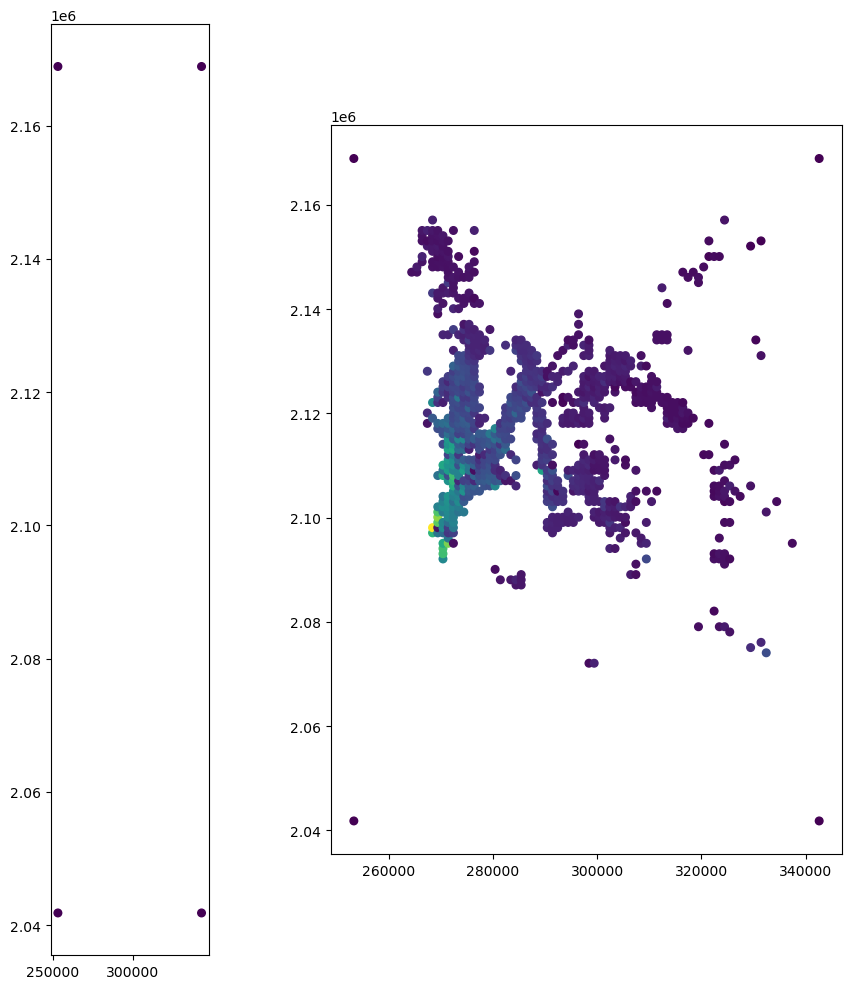

In [ ]:
# add fake points to the real estate data at the extremes of the AOI_gdf
min_avgPriceSqm = MUM_real_estate_sale_gdf['medPriceSqm'].min()
min_medPriceSqm = MUM_real_estate_sale_gdf['medPriceSqm'].min()
min_dolar_avgPriceSqm = MUM_real_estate_sale_gdf['dolar_medPriceSqm'].min()
min_dolar_medPriceSqm = MUM_real_estate_sale_gdf['dolar_medPriceSqm'].min()
# create a fake point at the extremes of the AOI_gdf
fake_points = gpd.GeoDataFrame({'X': [AOI_gdf.bounds.minx.min(), AOI_gdf.bounds.maxx.max(),AOI_gdf.bounds.minx.min(), AOI_gdf.bounds.maxx.max()],
                                'Y': [AOI_gdf.bounds.miny.min(), AOI_gdf.bounds.maxy.max(), AOI_gdf.bounds.maxy.max(),AOI_gdf.bounds.miny.min()],
                                'avgPriceSqm': [min_avgPriceSqm, min_avgPriceSqm, min_avgPriceSqm, min_avgPriceSqm],
                                'medPriceSqm': [min_medPriceSqm, min_medPriceSqm, min_medPriceSqm, min_medPriceSqm],
                                'dolar_avgPriceSqm': [min_dolar_avgPriceSqm, min_dolar_avgPriceSqm, min_dolar_avgPriceSqm, min_dolar_avgPriceSqm],
                                'dolar_medPriceSqm': [min_dolar_medPriceSqm, min_dolar_medPriceSqm, min_dolar_medPriceSqm, min_dolar_medPriceSqm],
                                'TransactionType': ['Sale', 'Sale', 'Sale', 'Sale'],
                                'TransactionMonth': ['Jul', 'Jul', 'Jul', 'Jul'],
                                'TransactionYear': [2019, 2019, 2019, 2019],
                                'Currency': ['INR', 'INR','INR','INR']})

fake_points_gdf = gpd.GeoDataFrame(fake_points, geometry=gpd.points_from_xy(fake_points.X, fake_points.Y), crs='EPSG:4326')

# append the fake points to the real estate data
MUM_real_estate_sale_AOI_gdf = MUM_real_estate_sale_gdf.merge(fake_points_gdf, how='outer')

# plotting and comparing MUM and JAK
fig = plt.figure(figsize=(10, 10))
gs = GridSpec(1, 2, figure=fig)

# Create subplots
ax0 = fig.add_subplot(gs[0])
ax1 = fig.add_subplot(gs[1])
'''ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, 1])
'''
# Plot GeoDataFrames
fake_points_gdf.plot('medPriceSqm', ax=ax0, legend=False, cmap='viridis', markersize=30)
MUM_real_estate_sale_AOI_gdf.plot('medPriceSqm', ax=ax1, legend=False, cmap='viridis', markersize=30)


# Adjust layout to ensure equal column widths
plt.tight_layout()

# Show plot
plt.show()


## exporting the GDFs

From here, we need to interpolate the points in ArcGIS.

In [85]:
# export the sale dfs to shapefiles

file_name = case_city + '_ECO_real_estate_sale_2019_LePetit_P.shp'

real_estate_sale_gdf.to_file(interim_path/file_name)
# real_estate_sale_AOI_gdf.to_file(interim_path/'MUM_ECO_real_estate_sale_2019_LePetit_AOI_P.shp')

In [86]:
## adding fake points to the real estate data at the extremes of the AOI_gdf

# check if real_estate_sale_gdf is empty
try:
    real_estate_gdf = real_estate_sale_gdf.copy()
except:
    print('real_estate_sale_gdf does not exist')
    real_estate_gdf = gpd.GeoDataFrame()  # create an empty GeoDataFrame if the variable doesn't exist
if real_estate_gdf.empty:
    print('real_estate_sale_gdf is empty, using real_estate_rent_gdf instead')
    if real_estate_gdf.empty:
        print('real_estate_rent_gdf is also empty, attempt to load from the shapefile')
        file_name = case_city + '_ECO_real_estate_sale_2019_LePetit_P.shp'
        real_estate_gdf = gpd.read_file(interim_path/file_name) 
        if real_estate_gdf.empty:
            print('The shapefile is also empty, please check the data source and the AOI extent')
            print('Exiting the script')
            # stop the script
            raise SystemExit
    

# add points at the edge of the AOI to ensure interpolation will include it all
#min_price_USD = real_estate_gdf['aPm2_USD'].min()
min_price_sqm_USD = real_estate_gdf['aPm2_USD'].min()
min_y = AOI_gdf.bounds.miny.min()
max_y = AOI_gdf.bounds.maxy.max()
min_x = AOI_gdf.bounds.minx.min()
max_x = AOI_gdf.bounds.maxx.max()
#print(min_price, '\ny',min_y, max_y, '\nx',min_x, max_x)
fake_points = pd.DataFrame({'description': ['fake1, min y/min x','fake2, min y/max x','fake3, max y/max x','fake4, min y/max x'],
                            #price_USD': [min_price_USD, min_price_USD, min_price_USD, min_price_USD],
                            'aPm2_USD': [min_price_sqm_USD, min_price_sqm_USD, min_price_sqm_USD, min_price_sqm_USD],
                            'category': ['fake', 'fake', 'fake', 'fake'],
                                'latitude': [min_y, min_y,max_y, max_y],
                                'longitude': [min_x, max_x, max_x,min_x],
                                'date_accessed': pd.to_datetime('today').strftime('%Y-%m-%d'),
                                'source': 'Estimated'})
fake_points_gdf= gpd.GeoDataFrame(fake_points, geometry=gpd.points_from_xy(fake_points.longitude, fake_points.latitude), crs=AOI_gdf.crs)
print('original len', len(real_estate_gdf))
# append the fake points to the real estate data
real_estate_AOI_gdf = real_estate_gdf.merge(fake_points_gdf, how='outer')
print('adjusted len', len(real_estate_AOI_gdf))

original len 466
adjusted len 470


In [87]:
# export the AOI real estate data to shapefiles
file_name = case_city + '_ECO_real_estate_sale_2019_LePetit_AOI_P.shp'
real_estate_AOI_gdf.to_file(interim_path/file_name)


## JAK: alternative, scrapping from rumah123
https://www.rumah123.com/en/sale/cari/

## MAN: scrapping data from Lamudi.com.ph

In [44]:
# code from https://github.com/arl7d/portfoilioprojects/blob/main/Web_scraping_Philippine_real_estate/V2_web_scrape_ph_house_lot.py
# data scrapped from https://www.lamudi.com.ph/

from bs4 import BeautifulSoup
import requests
import unicodedata
import lxml 
from lxml import etree

# function below taken from stack overflow to convert latin n to english n

def strip_accents(text):
    return ''.join(char for char in
                   unicodedata.normalize('NFKD', text)
                   if unicodedata.category(char) != 'Mn')

ModuleNotFoundError: No module named 'lxml'

In [ ]:
# main routine to sift through pages and take real estate info then load it into dataframe
# create empty dict as a container for our data later on
real_estate_dict = {}
# initialize page as zero
page = 0
max_page = 50

while page in range(0,max_page):
    page += 1
    html_text = requests.get(f'https://www.lamudi.com.ph/buy/?page={page}').text
    soup = BeautifulSoup(html_text,'lxml')  
    all_info = soup.find_all('div', class_='ListingCell-AllInfo ListingUnit')
    for i in range(len(all_info)):
        info = all_info[i]
        header = info.find('h3', class_='ListingCell-KeyInfo-title').text.strip()
        #print('begin add: ', header)  # used for testing/debugging
        location = info.find('span', class_='ListingCell-KeyInfo-address-text').text.strip()
        try:
            price = info.find('span', class_='PriceSection-FirstPrice').text.strip()
            price = price.lstrip("₱ ").replace(',','').replace(' ','')
        except AttributeError:
            price = np.nan
        try:
            bedrooms = '' 
            bath = ''
            floor_area = ''
            # the xml coding changed since the initial scrapping, so we need to adjust the code
            amenities = info.find_all('span', class_='KeyInformation-value_v2 KeyInformation-amenities-icon_v2')
            for item in amenities:
                if 'icon-bedrooms' in str(item):
                    bedrooms = str(item).split('>')[3].split('<')[0].strip()
                if 'icon-bathrooms' in str(item):
                    bath = str(item).split('>')[3].split('<')[0].strip()
                if 'icon-livingsize' in str(item):
                    floor_area = str(item).split('>')[3].split('<')[0].strip()
                    floor_area = floor_area.rstrip(" m²")
                if 'icon-land_size' in str(item):
                    land_area = str(item).split('>')[3].split('<')[0].strip().rstrip(" m²")
                    land_area = land_area.rstrip(" m²")
        except AttributeError:
            bedrooms =np.nan  # used numpy NaN objects instead of the string "an" to avoid errors when casting to integers later
            bath = np.nan
            floor_area = np.nan
        #print('bd:',bedrooms, '\n','ba:',bath, '\n','fa:',floor_area) # used for testing/debugging
        
        # get the geolocation
        geo_start = str(info).index('data-geo-point=')
        geo_end = str(info).index(']',geo_start) 
        # Calculating the end is better than assuming it will be in a certain position as the number of positions after the comma varies in the original data
        geo_location = str(info)[geo_start+17:geo_end]
        geo_location = geo_location.replace(']','')
        geo_location = geo_location.replace('"','')
        geo_location = geo_location.replace(' ','')
        geo_location = geo_location.replace('d','')
        geo_location = geo_location.replace('a','')
        geo = geo_location.split(",")
        longitude = geo[0].replace(r'[^0-9.]', '')
        latitude = geo[1].replace(r'[^0-9.]', '')
        
        # search for the type of property. this is critical for analysis, as we do not want to compare plots with apartments or houses.
        cat_start = str(info).index('data-subcategories=')
        cat_end = str(info).index(']',cat_start)
        cat = str(info)[cat_start+21:cat_end]
        cat = cat.replace('"','')
        subcat = cat.split(',')[1]
        cat = cat.split(',')[0]
        #print(cat, '\n',subcat) # used for testing/debugging
        
        link = info.a['href']
        # need to create an ID for the dict below. This will be our unique identifier in the df later
        
        id_var = str(page) + str(i)
        # print(id_var) # used for testing/debugging
        # working with a dict seems more economic than appending a df
        real_estate_dict[id_var] = {
                'description' : strip_accents(header),
                'location' : strip_accents(location),
                'price_PHP' : price,
                'bedrooms' : bedrooms,
                'bath' : bath,
                'floor_area_sqm' : floor_area,
                'land_area_sqm' : land_area,
                'category' : cat,
                'subcategory' : subcat,
                'latitude' : latitude,
                'longitude' : longitude,
                'link' : link}
        #print('\n++++++++ finished add ++++++++ \n')
                
    print(f'finished page {page}')

real_estate_df = pd.DataFrame.from_dict(real_estate_dict, orient='index')
print('+++++++++ finished all ++++++++++','\n', 'total entries:', len(real_estate_df))
    

finished page 1
finished page 2
finished page 3
finished page 4
finished page 5
finished page 6
finished page 7
finished page 8
finished page 9
finished page 10
finished page 11
finished page 12
finished page 13
finished page 14
finished page 15
finished page 16
finished page 17
finished page 18
finished page 19
finished page 20
finished page 21
finished page 22
finished page 23
finished page 24
finished page 25
finished page 26
finished page 27
finished page 28
finished page 29
finished page 30
finished page 31
finished page 32
finished page 33
finished page 34
finished page 35
finished page 36
finished page 37
finished page 38
finished page 39
finished page 40
finished page 41
finished page 42
finished page 43
finished page 44
finished page 45
finished page 46
finished page 47
finished page 48
finished page 49
finished page 50
+++++++++ finished all ++++++++++ 
 total entries: 1420


In [ ]:
real_estate_df = pd.DataFrame.from_dict(real_estate_dict, orient='index')

real_estate_df["latitude"] = pd.to_numeric(real_estate_df["latitude"], downcast="float") 
real_estate_df["longitude"] = pd.to_numeric(real_estate_df["longitude"], downcast="float") 
real_estate_df["floor_area_sqm"] = pd.to_numeric(real_estate_df["floor_area_sqm"], downcast="float") 
real_estate_df["bedrooms"] = pd.to_numeric(real_estate_df["bedrooms"], downcast="integer") 
real_estate_df["bath"] = pd.to_numeric(real_estate_df["bath"], downcast="integer", errors='coerce') 
real_estate_df["price_PHP"] = pd.to_numeric(real_estate_df["price_PHP"], downcast="float") 
real_estate_df['date_accessed'] = pd.to_datetime('today').strftime('%Y-%m-%d')
real_estate_df['source'] = 'Lamudi'
real_estate_df['price_USD'] = round(real_estate_df['price_PHP']*0.021, 3)
real_estate_df['price_sqm_USD'] = round(real_estate_df['price_USD']/real_estate_df['floor_area_sqm'], 3)
# move the column 'price_USD' and 'price_sqm_USD' to the third position
cols = real_estate_df.columns.tolist()
cols = cols[:2] + [cols[-2]] +[cols[-1]] + cols[2:-2]
#print(cols)
real_estate_df = real_estate_df[cols]
real_estate_df.head()

,description,location,price_USD,price_sqm_USD,price_PHP,bedrooms,bath,floor_area_sqm,land_area_sqm,category,subcategory,latitude,longitude,link,date_accessed,source
10,2 Bedroom House and Lot in a Beachfront Commun...,"Guinsay, Danao",189000.000,1219.355,9000000.0,2.0,NaN,155.0,220,house,single-family-house,10.545016,124.027977,https://www.lamudi.com.ph/projects/aduna-villa...,2024-11-14,Lamudi
11,3 Bedroom House for Sale fronting Amenity and ...,"Guinsay, Danao",283500.000,2025.000,13500000.0,3.0,NaN,140.0,225,house,beach-house,10.545016,124.027977,https://www.lamudi.com.ph/projects/aduna-villa...,2024-11-14,Lamudi
12,RFO DEC 2024 Exclusive Village BNEW House Sun...,"Sun Valley, Paranaque",987021.000,2946.331,47001000.0,6.0,NaN,335.0,350,house,single-family-house,14.491803,121.038010,https://www.lamudi.com.ph/projects/sun-valley-...,2024-11-14,Lamudi
13,1 Bedroom For sale Condo in San Lorenzo Place ...,"Magallanes, Makati",34006.245,1307.933,1619345.0,1.0,1.0,26.0,350,condo,condotel,14.543703,121.018524,https://www.lamudi.com.ph/buy/metro-manila/mak...,2024-11-14,Lamudi
14,East Gallery Place Prime 2BR unit For Sale- wi...,"Fort Bonifacio, Taguig",1785000.000,11666.667,85000000.0,2.0,2.0,153.0,350,condo,other-4,14.540867,121.050316,https://www.lamudi.com.ph/projects/east-galler...,2024-11-14,Lamudi


### remove the outliers from the data

Shape before z-score: (1322, 17) 
 min: 4.964 
 max: 7788.715
Shape after z-score: (1317, 17) 
 min: 4.964 
 max: 7691.014


<Axes: xlabel='price_sqm_USD', ylabel='price_USD'>

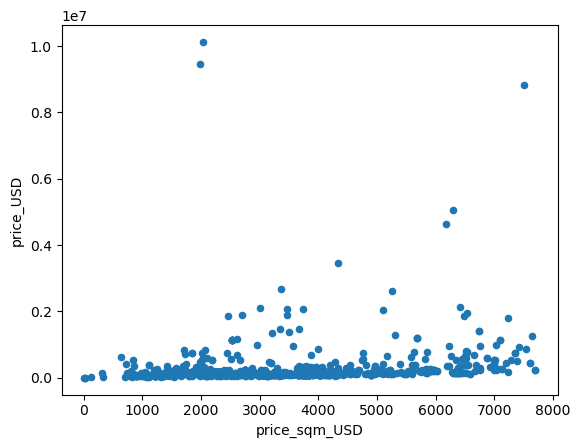

In [ ]:
# let's use the Z-score to remove outliers
from scipy import stats
real_estate_df = real_estate_df[real_estate_df['price_sqm_USD'] >= 1]
print('Shape before z-score:', real_estate_df.shape, '\n min:', real_estate_df['price_sqm_USD'].min(), '\n max:', real_estate_df['price_sqm_USD'].max())
real_estate_df['z_score'] = stats.zscore(real_estate_df['price_sqm_USD'])
real_estate_df = real_estate_df.loc[real_estate_df['z_score'].abs() < 3]
print('Shape after z-score:', real_estate_df.shape, '\n min:', real_estate_df['price_sqm_USD'].min(), '\n max:', real_estate_df['price_sqm_USD'].max())
real_estate_df.plot(x='price_sqm_USD', y='price_USD', kind='scatter')

In [ ]:

#remove empty values
real_estate_df = real_estate_df[real_estate_df['price_sqm_USD'] >= 1]

# determine the outliers via IQR
Q1 = real_estate_df['price_sqm_USD'].quantile(0.25)
Q3 = real_estate_df['price_sqm_USD'].quantile(0.75)
IQR = Q3 - Q1
top_limit = Q3 + 1.5 * IQR
bottom_limit = Q1 - 1.5 * IQR
print('Top limit:', top_limit, '\nBottom limit:', bottom_limit, '\nSTD:', real_estate_df['price_sqm_USD'].std())
real_estate_df = real_estate_df.loc[real_estate_df['price_USD'] < top_limit]


Top limit: 6881.0705 
Bottom limit: -816.8015000000005 
STD: 1685.896219423603


### create geodataframe

In [ ]:
real_estate_gdf_temp = gpd.GeoDataFrame(real_estate_df, geometry=gpd.points_from_xy(real_estate_df.longitude, real_estate_df.latitude), crs='EPSG:4326')
real_estate_gdf_temp = real_estate_gdf_temp.to_crs(AOI_gdf.crs)
real_estate_gdf = real_estate_gdf_temp.clip(AOI_gdf, keep_geom_type=True)

# add points at the edge of the AOI to ensure interpolation will include it all
min_price_USD = real_estate_gdf['price_USD'].min()
min_price_sqm_USD = real_estate_gdf['price_sqm_USD'].min()
min_y = AOI_gdf.bounds.miny.min()
max_y = AOI_gdf.bounds.maxy.max()
min_x = AOI_gdf.bounds.minx.min()
max_x = AOI_gdf.bounds.maxx.max()
#print(min_price, '\ny',min_y, max_y, '\nx',min_x, max_x)
fake_points = pd.DataFrame({'description': ['fake1, min y/min x','fake2, min y/max x','fake3, max y/max x','fake4, min y/max x'],
                            'price_USD': [min_price_USD, min_price_USD, min_price_USD, min_price_USD],
                            'price_sqm_USD': [min_price_sqm_USD, min_price_sqm_USD, min_price_sqm_USD, min_price_sqm_USD],
                            'category': ['fake', 'fake', 'fake', 'fake'],
                                'latitude': [min_y, min_y,max_y, max_y],
                                'longitude': [min_x, max_x, max_x,min_x],
                                'date_accessed': pd.to_datetime('today').strftime('%Y-%m-%d'),
                                'source': 'Estimated'})
fake_points_gdf= gpd.GeoDataFrame(fake_points, geometry=gpd.points_from_xy(fake_points.longitude, fake_points.latitude), crs=AOI_gdf.crs)
print('original len', len(real_estate_gdf))
# append the fake points to the real estate data
real_estate_AOI_gdf = real_estate_gdf.merge(fake_points_gdf, how='outer')
print('adjusted len', len(real_estate_AOI_gdf))


original len 793
adjusted len 797


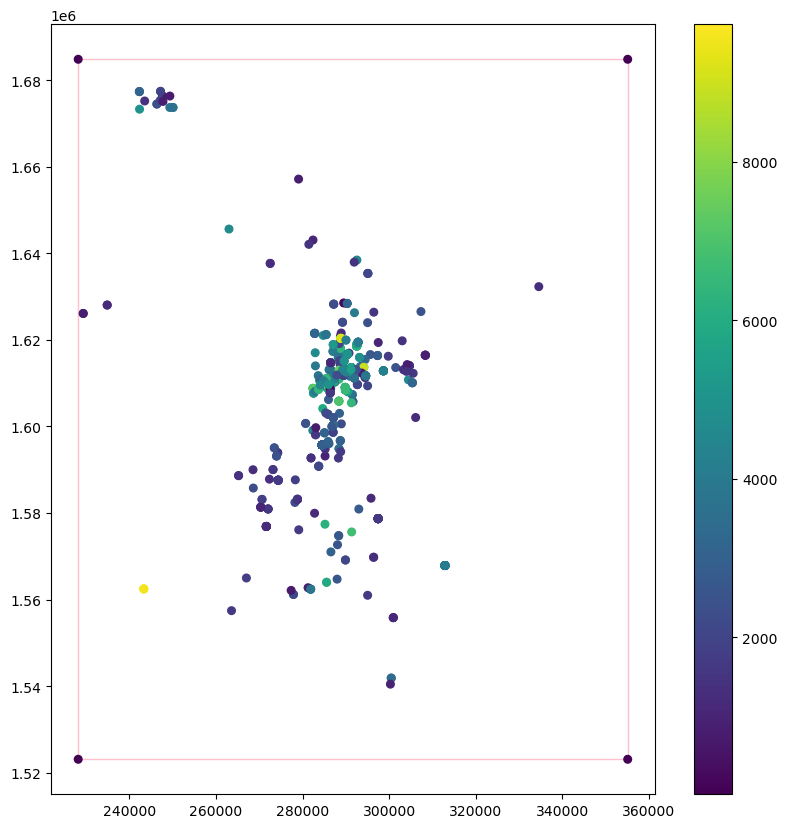

805 793 ['condo' 'house' 'fake']


In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
real_estate_residential = real_estate_gdf_AOI.loc[(real_estate_gdf_AOI['category']!='land') & (real_estate_gdf_AOI['category']!='commercial'), :]
real_estate_residential.plot('price_sqm_USD', cmap='viridis', legend=True, ax=ax, markersize=30, zorder=3)
#fake_points_gdf.plot('price_sqm_USD', cmap='viridis', legend=False, ax=ax, markersize=30, zorder=3)
AOI_gdf.boundary.plot(ax=ax, color='pink', linewidth=1, zorder=1)
#roads.loc[roads.major==1].plot(ax=ax, color='grey', linewidth=1, alpha=0.5, zorder=0) 
#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
print(len(real_estate_gdf_AOI), len(real_estate_residential), real_estate_residential['category'].unique())

In [ ]:
# export the data
file_name = case_city + '_ECO_real_estate_prices_2024_P.shp'
real_estate_gdf_AOI.to_file(interim_path/file_name, encoding = 'utf-8')

file_name = case_city + '_ECO_real_estate_prices_residential_2024_P.shp'
real_etate_residential.to_file(interim_path/file_name, encoding = 'utf-8')

## working with ARCGIS generated interpolations 

### For Mumbai:
In ArcGIS:
- applied Empirical Bayesian Krigging, see https://pro.arcgis.com/en/pro-app/3.0/tool-reference/geostatistical-analyst/empirical-bayesian-kriging.htm
- Resampled the raster to classes 0 (nodata), 1 (low income), 2 (middle income), and 3 (high income) <br>
- MHADA housing programe references: https://www.mhada.gov.in/en and https://housing.com/news/apply-mhada-lottery-scheme/

|    <br>Class    |    <br>USD/m2                                   |    <br>MHADA     |
|-----------------|-------------------------------------------------|------------------|
|    <br>0        |    <br>0                                        |    <br>n/a       |
|    <br>1        |    <br>Below   US$715.00/m2                     |    <br>LIG       |
|    <br>2        |    <br>Between   US$715.01 and US$835.00/m2     |    <br>MIG       |
|    <br>3        |    <br>Above   US$835.01/m2                     |    <br>HIG       |


+++++ real estate rater bounds +++++
228167.4357
1523098.4837
355157.43570000003
1684828.4837
+++++++++++++++++++++++++++++++++++

***** ref raster rater bounds *****
228167.4357
1523098.4837
355127.43570000003
1684828.4837
***********************************
Min value: 0.0 , Max value: 7167.217


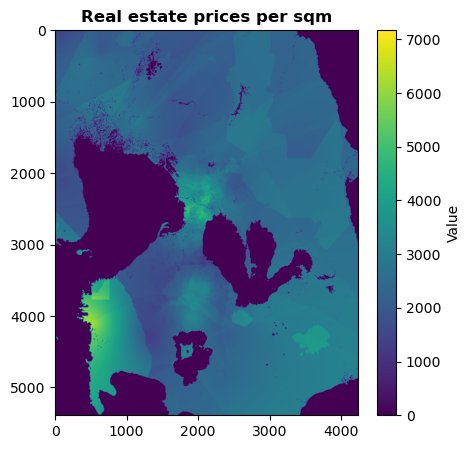

In [ ]:
# re-import the interpolated data from ArcGIS into raster
if case_city == 'MUM':
    real_estate_path = 'MUM_ECO_real_estate_sale_LePetit_extended_2019_150m.tif'
if case_city == 'JAK':
    real_estate_path = 'JAK_ECO_real_estate_sale_LePetit_extended_2019_150m.tif.tif'
if case_city == 'MAN':
    real_estate_path = 'MAN_ECO_real_estate_EBK_Lamuidi_extended_2024_150m.tif'

with rasterio.open(interim_path/ real_estate_path,'r') as real_estate_raster:
    # check values
    real_estate_raster_obj = np.where(real_estate_raster.read(1) < 0, 0, real_estate_raster.read(1))
    #print('Min val:',real_estate_raster_obj.min()) # check if the minimum value is 0
    
    # check bounds
    print('+++++ real estate rater bounds +++++')
    for b in real_estate_raster.bounds:
        print(b)
    print('+++++++++++++++++++++++++++++++++++\n\n***** ref raster rater bounds *****')
    for b in ref_raster.bounds:
        print(b)
    print('***********************************')
    plot_continuous_raster(real_estate_raster_obj, title='Real estate prices per sqm')
    

[2317.8005, 2953.2742309570312]
0.0 7167.217
Unique values [0 1 2 3] 
Min value 0 , Type: int32


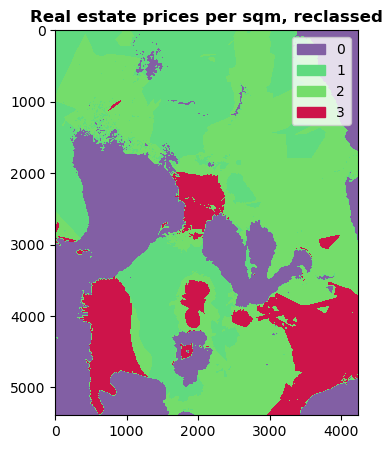

In [ ]:
## OPTIONAL: reclassify the raster to three classes

# optional, optional
# normal_real_estate_raster = np.round((real_estate_raster_obj - np.nanmin(real_estate_raster_obj))/(np.nanmax(real_estate_raster_obj) - np.nanmin(real_estate_raster_obj)),4)

# testing quantiles
real_estate_classes = [np.quantile(real_estate_raster_obj, 0.1), np.quantile(real_estate_raster_obj, 0.9), real_estate_raster_obj.max()]

# testing std. deviation: low income = below the median, middle income = median + std/2, high income = all above middle income
real_estate_std = np.std(real_estate_raster_obj)
#real_estate_classes = [np.median(real_estate_raster_obj)-(real_estate_std/3), np.median(real_estate_raster_obj)+(real_estate_std/3),  real_estate_raster_obj.max()]
real_estate_classes = [np.median(real_estate_raster_obj), np.median(real_estate_raster_obj)+(real_estate_std/2)]
print(real_estate_classes)
print(real_estate_raster_obj.min(), real_estate_raster_obj.max())

reclass_raster1 = np.where((real_estate_raster_obj > 0) & (real_estate_raster_obj <= real_estate_classes[0]), 1, 0)
reclass_raster2 = np.where((real_estate_raster_obj > real_estate_classes[0]) & (real_estate_raster_obj <= real_estate_classes[1]), 2, 0)
reclass_raster3 = np.where((real_estate_raster_obj > real_estate_classes[1]), 3, 0)

reclass_raster = reclass_raster1 + reclass_raster2 + reclass_raster3

plot_unique_value_raster(reclass_raster, title='Real estate prices per sqm, reclassed')

### For Jakarta:
In ArcGIS:
- [applied Forest-based and Boosted Classification and Regression (Spatial Statistics)](https://pro.arcgis.com/en/pro-app/3.4/tool-reference/spatial-statistics/forestbasedclassificationregression.htm)
- Used [nighttime light data from WorldPop](https://hub.worldpop.org/geodata/summary?id=62751) as additional training data. Data from D. Woods, T. McKeen, A. Cunningham, R. Priyatikanto, A. Sorichetta , A.J. Tatem and M. Bondarenko. 2024 "WorldPop high resolution, harmonised annual global geospatial covariates. Version 1.0." University of Southampton: Southampton, UK. DOI:10.5258/SOTON/WP00772

Need to substitute the following with references for **Jakarta**
- Resampled the raster to classes 0 (nodata), 1 (low income), 2 (middle income), and 3 (high income) <br>
- MHADA housing programe references: https://www.mhada.gov.in/en and https://housing.com/news/apply-mhada-lottery-scheme/

|    <br>Class    |    <br>USD/m2                                   |    <br>MHADA     |
|-----------------|-------------------------------------------------|------------------|
|    <br>0        |    <br>0                                        |    <br>n/a       |
|    <br>1        |    <br>Below   US$715.00/m2                     |    <br>LIG       |
|    <br>2        |    <br>Between   US$715.01 and US$835.00/m2     |    <br>MIG       |
|    <br>3        |    <br>Above   US$835.01/m2                     |    <br>HIG       |


+++++ real estate raster shape +++++ (632, 770) 
real estate raster bounds
639000.0000000009
9249150.0
754500.0000000009
9343950.0
+++++ ref raster shape +++++ (680, 772) 
ref raster bounds
639000.0
9249000.0
754800.0
9351000.0
***********************************
Min value: 0.0 , Max value: 1902.7820833333335


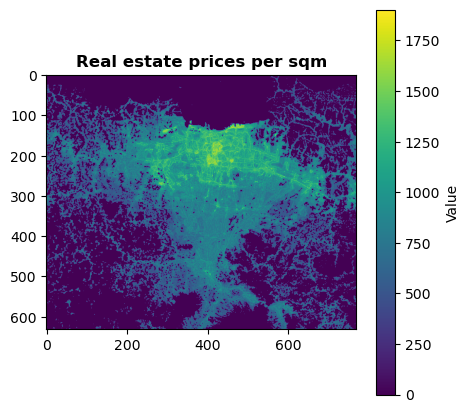

In [9]:
# re-import the interpolated data from ArcGIS into raster
if case_city == 'MUM':
    real_estate_path = 'MUM_ECO_real_estate_sale_LePetit_extended_2019_150m.tif'
if case_city == 'JAK':
    real_estate_path = 'JAK_ECO_real_estate_sale_2019_LePetit_RF.tif'
if case_city == 'MAN':
    real_estate_path = 'MAN_ECO_real_estate_EBK_Lamuidi_extended_2024_150m.tif'

with rasterio.open(interim_path/ real_estate_path,'r') as real_estate_raster:
    # check values
    real_estate_raster_obj = np.where(real_estate_raster.read(1) < 0, 0, real_estate_raster.read(1))
    #print('Min val:',real_estate_raster_obj.min()) # check if the minimum value is 0
    
    # check bounds
    print('+++++ real estate raster shape +++++', real_estate_raster.shape, '\nreal estate raster bounds')
    for b in real_estate_raster.bounds:
        print(b)
    print('+++++ ref raster shape +++++', ref_raster.shape, '\nref raster bounds')
    for b in ref_raster.bounds:
        print(b)
    print('***********************************')
    plot_continuous_raster(real_estate_raster_obj, title='Real estate prices per sqm')
    

In [10]:
# if the shapes of the rasters are different, we need to resample the real estate raster to match the reference raster
infile = interim_path/ real_estate_path
match = ref_raster_150_path
out_name = case_city + '_ECO_real_estate_prices_150m.tif'
outfile = interim_path/ out_name
resampling=Resampling.nearest
reproj_match(infile,
             match,
             outfile,
             resampling=resampling)

Coregistered to shape: 680 772 
 Affine | 150.00, 0.00, 639000.00|
| 0.00,-150.00, 9351000.00|
| 0.00, 0.00, 1.00|


Min val: 0.0
+++++ real estate raster shape +++++ (680, 772) 
real estate raster bounds
639000.0
9249000.0
754800.0
9351000.0
+++++ ref raster shape +++++ (680, 772) 
ref raster bounds
639000.0
9249000.0
754800.0
9351000.0
***********************************
Min value: 0.0 , Max value: 1902.7820833333335


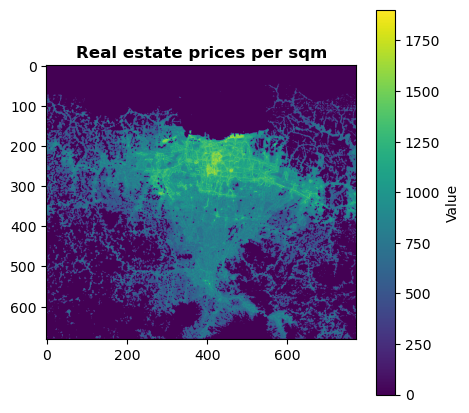

In [4]:
# import the co-registered file and reclassify it
real_estate_file = case_city + '_ECO_real_estate_prices_150m.tif'
with rasterio.open(interim_path/ real_estate_file,'r') as real_estate_raster:
    # check values
    real_estate_raster_obj = np.where(real_estate_raster.read(1) < 0, 0, real_estate_raster.read(1))
    print('Min val:',real_estate_raster_obj.min()) # check if the minimum value is 0
    
    # check bounds
    print('+++++ real estate raster shape +++++', real_estate_raster.shape, '\nreal estate raster bounds')
    for b in real_estate_raster.bounds:
        print(b)
    print('+++++ ref raster shape +++++', ref_raster.shape, '\nref raster bounds')
    for b in ref_raster.bounds:
        print(b)
    print('***********************************')
    plot_continuous_raster(real_estate_raster_obj, title='Real estate prices per sqm')



## Reclassifying

Deprived:  557.09 ( 9284833.33 ) 
Low:       676.06 ( 11267666.67 ) 
Middle:    795.04 ( 13250666.67 ) 
High:      1032.99 ( 17216500.0 )
[557.09, 676.06, 795.04, 1032.99]


Text(0.5, 1.0, 'Histogram of Real Estate Prices per Sqm with Class Breaks')

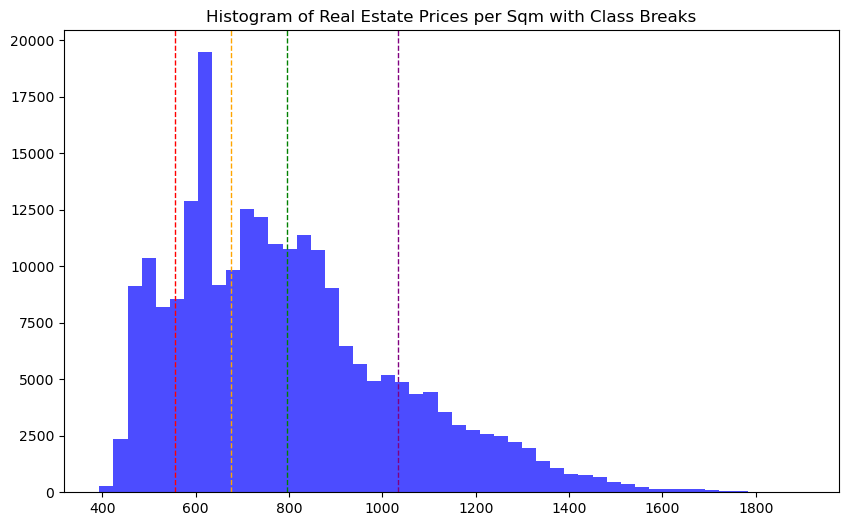

In [56]:
# classify the raster into three classes
real_estate_positives = real_estate_raster_obj[real_estate_raster_obj > 0]
real_estate_std = np.std(real_estate_positives)
real_estate_mean = np.mean(real_estate_positives)
conversion = conversion_dict['IDR']
real_estate_classes = [round((real_estate_mean-(real_estate_std)),2), # deprived
                       round(real_estate_mean-(real_estate_std/2),2), # low
                       round(real_estate_mean,2),                     # middle
                       round(real_estate_mean+(real_estate_std),2)] # high
print('Deprived: ', real_estate_classes[0],'(', round(real_estate_classes[0]/conversion,2),')', 
      '\nLow:      ', real_estate_classes[1],'(', round(real_estate_classes[1]/conversion,2),')', 
      '\nMiddle:   ',real_estate_classes[2],'(', round(real_estate_classes[2]/conversion,2),')', 
      '\nHigh:     ', real_estate_classes[3],'(', round(real_estate_classes[3]/conversion,2),')')
print(real_estate_classes)
# plot the histogram of the raster values with extra lines for the classes
plt.figure(figsize=(10, 6))
plt.hist(real_estate_positives.flatten(), bins=50, color='blue', alpha=0.7)
plt.axvline(real_estate_classes[0], color='red', linestyle='dashed', linewidth=1, label='Deprived class break')
plt.axvline(real_estate_classes[1], color='orange', linestyle='dashed', linewidth=1, label='Low class break')
plt.axvline(real_estate_classes[2], color='green', linestyle='dashed', linewidth=1, label='Middle class max')
plt.axvline(real_estate_classes[3], color='purple', linestyle='dashed', linewidth=1, label='High class max')
plt.title('Histogram of Real Estate Prices per Sqm with Class Breaks')
#reclass_raster1 = np.where((real_estate_raster_obj > 0) & (real_estate_raster_obj <= real_estate_classes[1]), 1, 0)

Unique values [0 1 2 3 4] 
Min value 0 , Type: int32


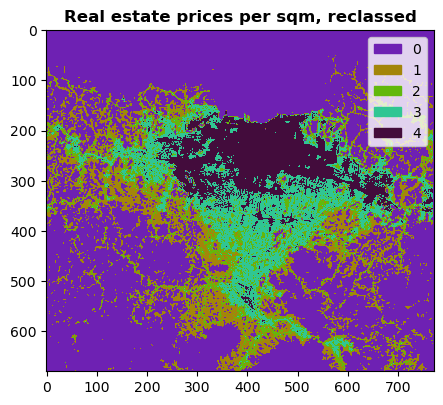

In [57]:
# reclassify the raster according the the class breaks above
reclass_raster1 = np.where((real_estate_raster_obj > 0) & (real_estate_raster_obj <= real_estate_classes[1]), 1, 0)
reclass_raster2 = np.where((real_estate_raster_obj > real_estate_classes[1]) & (real_estate_raster_obj <= real_estate_classes[2]), 2, 0)
reclass_raster3 = np.where((real_estate_raster_obj > real_estate_classes[2]) & (real_estate_raster_obj <= real_estate_classes[3]), 3, 0)
reclass_raster4 = np.where((real_estate_raster_obj > real_estate_classes[3]), 4, 0)
real_estate_reclass_raster = reclass_raster1 + reclass_raster2 + reclass_raster3 + reclass_raster4
plot_unique_value_raster(real_estate_reclass_raster, title='Real estate prices per sqm, reclassed')

In [ ]:
# export the reclassed raster
out_name = case_city + '_ECO_real_estate_reclass_150m.tif'
outfile = interim_path / out_name
export_raster(real_estate_reclass_raster, outfile)

In [ ]:
# export to TIFF and ASCII

if case_city == 'MUM':
    real_estate_tiff_file = 'MUM_ECO_real_estate_LePetit_reclass_2019_30m.tif'
if case_city == 'JAK':
    real_estate_tiff_file = 'JAK_ECO_real_estate_LePetit_reclass_2019_30m.tif'
if case_city == 'MAN':
    real_estate_tiff_file = 'MAN_ECO_real_estate_EBK_Lamudi_reclass_2024_30m.tif'


# export to TIFF
export_tiff_path = interim_path/real_estate_tiff_file
export_raster(raster = reclass_raster,
              url = export_tiff_path,
              data_type=rasterio.int16,
              ref_raster_path=ref_raster_path)

# real_estate_ascii_file = real_estate_tiff_file.replace('.tif','.asc')
# export to ASCII
# export_ascii_path = interim_path/real_estate_ascii_file
#export_raster_to_ascii(normal_real_estate_raster, export_ascii_path, ref_raster,raster_data_type)

## Copy the rasters to the model inputs folder

In [ ]:

origin_path = interim_path / real_estate_tiff_file
destination_path = model_inputs_30m_path / real_estate_tiff_file

shutil.copy(origin_path, destination_path)
print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MAN\model_inputs\TIFF_30m\MAN_ECO_real_estate_EBK_Lamuidi_reclass_2024_30m.tif


## re-import the 150m raster and check the extent

0
BoundingBox(left=253336.3548, bottom=2041681.0224, right=342586.3548, top=2168881.0224)
bounds should be: BoundingBox(left=253336.3548, bottom=2041831.0224, right=342586.3548, top=2168881.0224)
Unique values [0 1 2 3] 
Min value 0 , Type: uint8


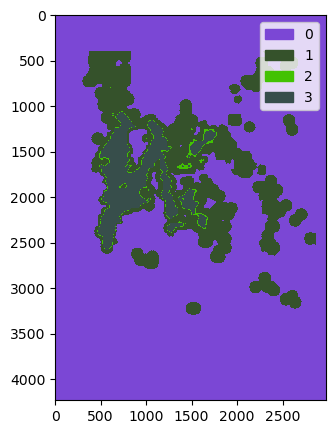

In [ ]:
# APS, 01.11.2024: need to update the code below to use generic AOI definition

# import the 150m raster
real_estate_path = 'MUM_ECO_real_estate_sale_2019_LePetit_extended_150m.tif'
with rasterio.open(model_inputs_150m_path/ real_estate_path,'r') as real_estate_raster:
    print(real_estate_raster_obj.min()) # check if the minimum value is 0
    # check the raster's extents
    print(real_estate_raster.bounds)
    print('bounds should be:',ref_raster.bounds)
    plot_unique_value_raster(real_estate_raster_obj)
    

# 13. Planning

- Acquire OSM parks outlines
- Rasterize them 150 m resolution

## 150 m resolution

Unique values [0 1] 
Min value 0 , Type: int16


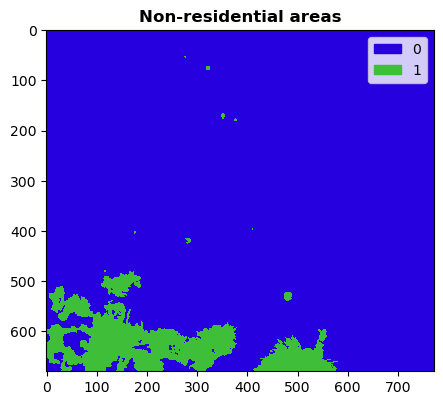

In [17]:
# import non-residential areas shapefile
non_residential_path = case_city + '_LIM_non_residential_areas_150m_A.shp'
non_residential_gdf = gpd.read_file(interim_path/non_residential_path)

# rasterise the layer
non_residential_raster = rasterise_vector(vector = non_residential_gdf, 
                 ref_raster_path = ref_raster_path, 
                 col=None, 
                 default_value=1, 
                 dtype=rasterio.int16)

# export the tiff file
file_name = case_city + '_LIM_non_residential_areas_150m.tif'
non_residential_raster_path = interim_path / file_name
export_raster(raster = non_residential_raster,
              url = non_residential_raster_path,
              data_type=rasterio.int16,
              ref_raster_path=ref_raster_path)
plot_unique_value_raster(non_residential_raster, title='Non-residential areas')

In [12]:
# copy the file to the model inputs folder
origin_path = interim_path / file_name
destination_path = model_inputs_30m_path / file_name

shutil.copy(origin_path, destination_path)
print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MAN\model_inputs\TIFF_30m\MAN_LIM_non_residential_areas_30m.tif


## 150 m resolution

In [15]:
# rasterise with the 150 m resolution
non_residential_raster_150 = rasterise_vector(vector = non_residential_gdf, 
                 ref_raster_path = ref_raster_150_path, 
                 col=None, 
                 default_value=1, 
                 dtype=rasterio.int16)
# export the tiff file

file_name = case_city + '_LIM_non_residential_areas_150m.tif'
non_residential_raster_path = interim_path / file_name

export_raster(raster = non_residential_raster_150,
              url = non_residential_raster_path,
              data_type=rasterio.int16,
              ref_raster_path=ref_raster_150_path)

# copy the file to the model inputs folder
origin_path = interim_path / file_name
destination_path = model_inputs_150m_path / file_name

shutil.copy(origin_path, destination_path)
print(str(destination_path))

D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\MAN\model_inputs\TIFF_150m\MAN_LIM_non_residential_areas_150m.tif


# 14. Hazards
for each case study, import the local hazard information (no single source at the moment), add them together and export as a binary (hazard = 1) and classified (categorical, where 0 = no hazard, 1 = low, 2 = mid, 3 = high). Hazard levels assume ??

Roadmap <br>
1. Import hazard files for each CS
2. Rasterize and add rasters
3. Establish hazard level assumptions (are are adopting the union of hazards, without combining multiple effects)
4. Export the results as binary and 4-levels classification

In [6]:
hazards_gdf_dict = {}
# create a raster stack for the hazards
hazards_raster_dict = {}
surge_raster_dict = {}

def rasterise_hazard_files(hazards_file_list, hazards_file_path, col = None, replace_value = None, key_complement='_flood'):
    hazard_dict = {}
    
    for file in hazards_file_list: #[0:2]
        zipfile = 'zip://' + str(external_data_path) + (hazards_file_path + file)
        key = file.split('.')[0] + key_complement
        print(zipfile)
        try:
            hazards_gdf = gpd.read_file(zipfile).to_crs(AOI_gdf.crs) #/file
            if col is None:
                col = hazards_gdf.columns[0]
            #hazards_gdf_dict[key] = hazards_gdf
            hazards_raster = rasterise_vector(vector = hazards_gdf, 
                                            ref_raster_path = ref_raster_150_path, 
                                            col=col, 
                                            default_value=0, 
                                            dtype=rasterio.int16)
            # replace values with the default value 
            if replace_value is not None:
                hazard_dict[key] = np.where(hazards_raster>0, replace_value, 0)
            else:
                hazard_dict[key] = hazards_raster
            
        except Exception as e:
            print(e)
    hazard_dict['total'] =  np.sum(list(hazard_dict.values()), axis=0)

    return hazard_dict

if (case_city == 'MAN'):
    flood_hazards_file_path = '\\MAN NOAH Hazard data\\Flood 25yr\\' 
    surge_SSA1_hazards_file_path = '\\MAN NOAH Hazard data\\StormSurgeAdvisory1\\'
    surge_SSA2_hazards_file_path = '\\MAN NOAH Hazard data\\StormSurgeAdvisory2\\'
    surge_SSA3_hazards_file_path = '\\MAN NOAH Hazard data\\StormSurgeAdvisory3\\'
    surge_SSA4_hazards_file_path = '\\MAN NOAH Hazard data\\StormSurgeAdvisory4\\'
    hazards_file_list = ['Bulacan.zip', 'Cavite.zip', 'Laguna.zip',
                     'MetroManila.zip', 'NuevaEcija.zip', 'Bataan.zip',
                     'Pampanga.zip', 'Batangas.zip']    
elif case_city == 'MUM':
    hazards_file_path = '' + case_city + '' 
    hazards_file_list = []
elif case_city == 'JAK':
    # coastal is a raster, riverine is a vector
    surge_hazards_file_path = external_path / (case_city + '_DEM_coastal elevation_DeltaDTM_150m.tif')
    riverine_hazards_file =  (case_city + '_HYD_rivers_500m buffer_OSM_2024_A.shp')
    
    hazards_file_list = [riverine_hazards_file]


## 14.1 import and rasterise hazard vectors

### MAN: flood vectors

In [ ]:
flood_dict = rasterise_hazard_files(hazards_file_list = hazards_file_list, 
                                    hazards_file_path = external_path, 
                                    col = 'Var',
                                    replace_value = None, 
                                    key_complement='_flood')

plot_unique_value_raster(flood_dict['total'], title='Flood hazard areas')

4.0
Unique values [0 1 2 3] 
Min value 0 , Type: int32


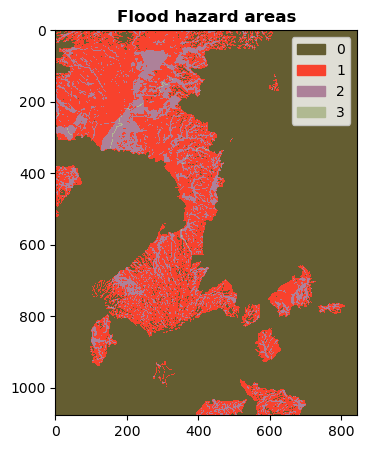

In [108]:
total_array = flood_dict['total']
flood_dict['reclass'] = np.zeros_like(total_array)
hazard_max = np.nanmax(total_array)
print((hazard_max /3 )* 2)
hazards_raster_class_1 = np.where((total_array > 0 )&(total_array <= (hazard_max/3)), 1, 0)
hazards_raster_class_2 = np.where((total_array> (hazard_max/3))&(total_array <= ((hazard_max/3)*2.5))  , 2, 0)
hazards_raster_class_3 = np.where(total_array > ((hazard_max/3)*2.5), 3, 0)
flood_dict['reclass'] += hazards_raster_class_1 + hazards_raster_class_2 + hazards_raster_class_3
plot_unique_value_raster(flood_dict['reclass'], title='Flood hazard areas')

### JAK: import OSM river features, extract buffer, and rasterise

Unique values [0 1] 
Min value 0 , Type: int16


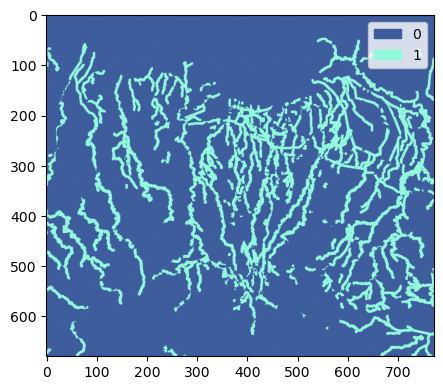

In [23]:
# rasterize the rivers
# check if the waters gdf exists
rivers_file_name = case_city + '_HYD_rivers_OSM_2024_L.shp'
rivers_path = interim_path / rivers_file_name
rivers_vector = gpd.read_file(rivers_path).to_crs(AOI_gdf.crs)
# first, let's add a 100 m buffer to the rivers
rivers_raster = rivers_vector.loc[:,['major','geometry']].copy()
rivers_raster['geometry'] = rivers_raster.buffer(300)
#rivers_raster['major'] = (rivers_raster['major'] + 1) * 2

rivers_raster = rasterise_vector(
    vector = rivers_raster, 
    ref_raster_path = ref_raster_150_path, 
    col='major', 
    default_value=1, 
    dtype=rasterio.int16)


plot_unique_value_raster(rivers_raster)

## surge layers

### MAN: rasterise surge vectors

zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\Bulacan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\Cavite.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\Laguna.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\Laguna.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\MetroManila.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\NuevaEcija.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\NuevaEcija.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\Bataan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\Pampanga.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory1\Batangas.zip
Unique values [0 1] 
Min value 0

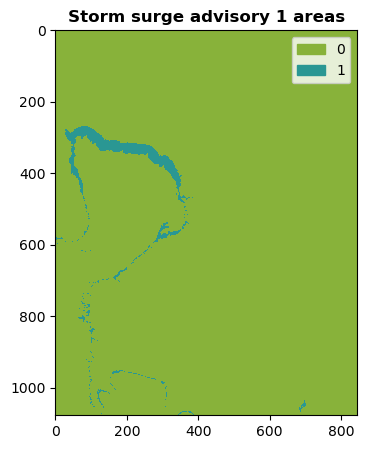

In [96]:
SSA1_raster_dict = rasterise_hazard_files(hazards_file_list = hazards_file_list, 
                                    hazards_file_path = surge_SSA1_hazards_file_path, 
                                    col = 'HAZ',
                                    replace_value = 1, 
                                    key_complement='_SSA1')
SSA1_raster_dict['total'] = np.where(SSA1_raster_dict['total']>0, 1, 0)
plot_unique_value_raster(SSA1_raster_dict['total'], title='Storm surge advisory 1 areas')

zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\Bulacan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\Cavite.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\Laguna.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\Laguna.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\MetroManila.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\NuevaEcija.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\NuevaEcija.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\Bataan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\Pampanga.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory2\Batangas.zip
Unique values [0 2] 
Min value 0

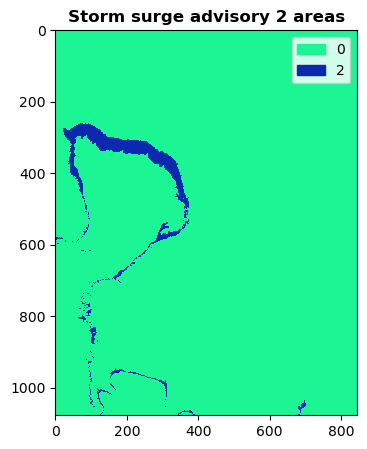

In [97]:
SSA2_raster_dict = rasterise_hazard_files(hazards_file_list = hazards_file_list, 
                                    hazards_file_path = surge_SSA2_hazards_file_path, 
                                    col = 'HAZ',
                                    replace_value = 2, 
                                    key_complement='_SSA2')
SSA2_raster_dict['total'] = np.where(SSA2_raster_dict['total']>0, 2, 0)
plot_unique_value_raster(SSA2_raster_dict['total'], title='Storm surge advisory 2 areas')

zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\Bulacan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\Cavite.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\Laguna.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\Laguna.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\MetroManila.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\NuevaEcija.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\NuevaEcija.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\Bataan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\Pampanga.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory3\Batangas.zip
Unique values [0 3] 
Min value 0

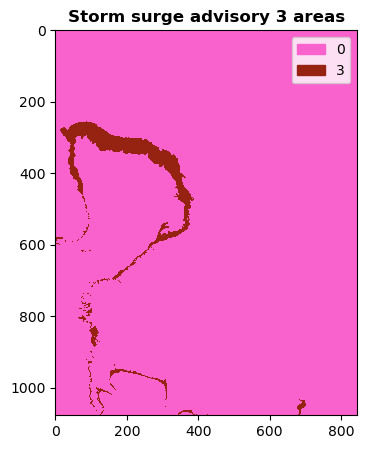

In [98]:
SSA3_raster_dict = rasterise_hazard_files(hazards_file_list = hazards_file_list, 
                                    hazards_file_path = surge_SSA3_hazards_file_path, 
                                    col = 'HAZ',
                                    replace_value = 3, 
                                    key_complement='_SSA3')
SSA3_raster_dict['total'] = np.where(SSA3_raster_dict['total']>0, 3, 0)
plot_unique_value_raster(SSA3_raster_dict['total'], title='Storm surge advisory 3 areas')

zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\Bulacan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\Cavite.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\Laguna.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\Laguna.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\MetroManila.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\NuevaEcija.zip
'/vsizip/D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\NuevaEcija.zip' does not exist in the file system, and is not recognized as a supported dataset name.
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\Bataan.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\Pampanga.zip
zip://D:\Dropbox\x\_data\MAN NOAH Hazard data\StormSurgeAdvisory4\Batangas.zip
Unique values [0 4] 
Min value 0

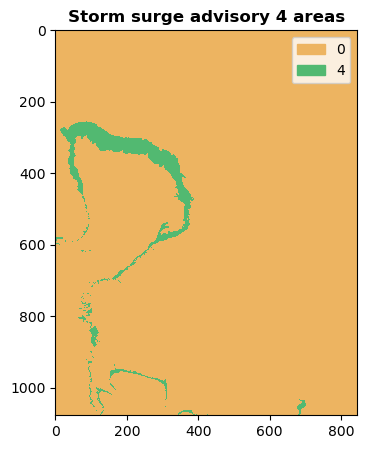

In [100]:
SSA4_raster_dict = rasterise_hazard_files(hazards_file_list = hazards_file_list, 
                                    hazards_file_path = surge_SSA4_hazards_file_path, 
                                    col = 'HAZ',
                                    replace_value = 4, 
                                    key_complement='_SSA4')
SSA4_raster_dict['total'] = np.where(SSA3_raster_dict['total']>0, 4, 0)
plot_unique_value_raster(SSA4_raster_dict['total'], title='Storm surge advisory 4 areas')

6.666666666666667
Unique values [0 1 2 3] 
Min value 0 , Type: int32


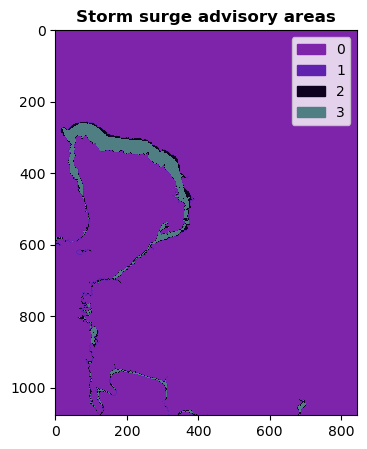

In [106]:
surge_raster_total = SSA1_raster_dict['total'] + SSA2_raster_dict['total'] + SSA3_raster_dict['total'] + SSA4_raster_dict['total']
# reclassify the raster total in 3 classes (low, mid, high)
surge_raster_reclass = np.zeros_like(surge_raster_total)
hazard_max = np.nanmax(surge_raster_total)
print((hazard_max /3 )* 2)
hazards_raster_class_1 = np.where((surge_raster_total > 0 )&(surge_raster_total <= (hazard_max/3)), 1, 0)
hazards_raster_class_2 = np.where((surge_raster_total> (hazard_max/3))&(surge_raster_total <= ((hazard_max/3)*2.5))  , 2, 0)
hazards_raster_class_3 = np.where(surge_raster_total > ((hazard_max/3)*2.5), 3, 0)
surge_raster_reclass += hazards_raster_class_1 + hazards_raster_class_2 + hazards_raster_class_3
plot_unique_value_raster(surge_raster_reclass, title='Storm surge advisory areas')

### JAK: import DeltaDTM raster

(1, 680, 772)
Unique values [0 1 2] 
Min value 0 , Type: int64


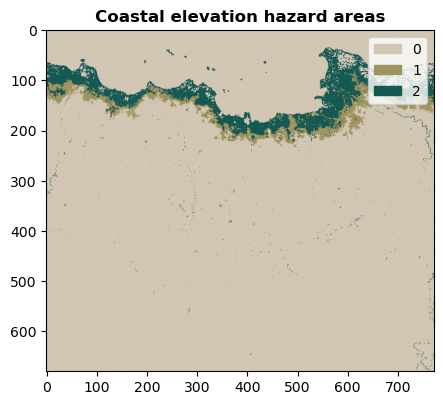

In [36]:
surge_hazards_file_path = case_city + '_DEM_coastal elevation_DeltaDTM_150m.tif'
with rasterio.open(external_path / surge_hazards_file_path, 'r') as src:
    # clip the surge raster to the AOI    
    surge_raster, src_transform = mask(src, getFeatures(AOI_gdf), crop=True)
    # let's reclassify the surge raster into three classes: 0-2 m, 2-3 m, >3 m
    surge_raster_reclass = np.zeros_like(surge_raster)
    surge_raster_class_1 = np.where((surge_raster > 0) & (surge_raster <= 2), 2, 0)
    surge_raster_class_2 = np.where((surge_raster > 2) & (surge_raster <= 3), 1, 0)
    surge_raster_class_3 = np.where(surge_raster > 3, 0, 0)
    surge_raster_reclass = surge_raster_class_1 + surge_raster_class_2 + surge_raster_class_3
    print(surge_raster_reclass.shape)
    
    #surge_raster_reclass = surge_raster_reclass.clip(AOI_gdf)
    plot_unique_value_raster(surge_raster_reclass, title='Coastal elevation hazard areas')
    
    #plot_continuous_raster(surge_raster, title='Coastal elevation hazard areas')


## 14.2 combine surge and river

### MAN: combine flood dict

Unique values [0 1 2 3 4 5 6] 
Min value 0 , Type: int32


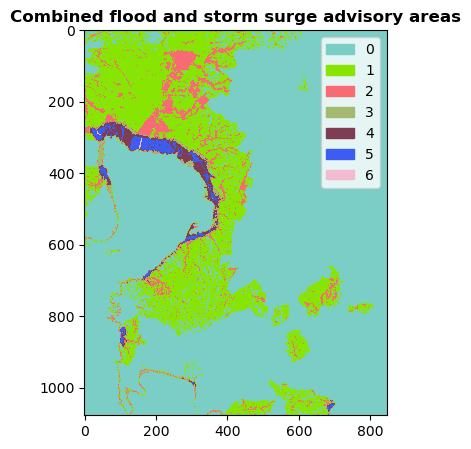

In [112]:
# now combine the flood and surge reclassified rasters, where 1 = surge or flood low, 2 = surge or flood mid, 3 = surge or flood high
hazard_raster_combined_reclass = np.maximum(flood_dict['reclass'], surge_raster_reclass)
hazard_raster_combined_total = flood_dict['reclass'] + surge_raster_reclass
plot_unique_value_raster(hazard_raster_combined_total, title='Combined flood and storm surge advisory areas')

### JAK: add coastal surge + rivers flood raster

(1, 680, 772)
Unique values [0 1 2 3] 
Min value 0 , Type: int64


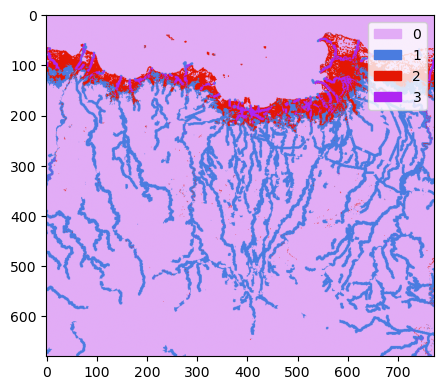

In [39]:
hazard_raster_combined = surge_raster_reclass + rivers_raster
print(surge_raster_reclass.shape)
plot_unique_value_raster(hazard_raster_combined)

## 14.3 export

### MAN:

In [ ]:
# export the tiff file
export_file = True
if export_file:
    file_name = case_city + '_HYD_25_year_flooding_surgeSSA1_150m.tif'
    url = interim_path / file_name
    export_raster(raster = hazard_raster_combined_total,
                url = url,
                data_type=rasterio.int16,
                ref_raster_path=ref_raster_150_path)


if export_file:
    file_name = case_city + '_HYD_25_year_flooding_surgeSSA1_reclass_150m.tif'
    url = interim_path / file_name
    export_raster(raster = hazard_raster_combined_reclass,
                url = url,
                data_type=rasterio.int16,
                ref_raster_path=ref_raster_150_path)

In [116]:
# reproject the rasters to the SLEUTH AOI
file_name = case_city + '_HYD_25_year_flooding_surgeSSA1_150m.tif'
in_url = interim_path / file_name
out_url = model_inputs_SLEUTH_150m_path / file_name

reproj_match(infile = in_url, 
             match = ref_raster_sleuth_path, 
             outfile = out_url, 
             resampling=Resampling.nearest)

file_name = case_city + '_HYD_25_year_flooding_surgeSSA1_reclass_150m.tif'
in_url = interim_path / file_name
out_url = model_inputs_SLEUTH_150m_path / file_name

reproj_match(infile = in_url, 
             match = ref_raster_sleuth_path, 
             outfile = out_url, 
             resampling=Resampling.nearest)

Coregistered to shape: 704 533 
 Affine | 150.00, 0.00, 244017.74|
| 0.00,-150.00, 1659562.60|
| 0.00, 0.00, 1.00|
Coregistered to shape: 704 533 
 Affine | 150.00, 0.00, 244017.74|
| 0.00,-150.00, 1659562.60|
| 0.00, 0.00, 1.00|


### JAK

In [48]:
export_file = True
if export_file:
    try:
        file_name = case_city + '_HYD_flood_hazard_150m.tif'
        url = interim_path / file_name
        export_raster(raster = hazard_raster_combined.squeeze(),
                    url = url,
                    data_type=rasterio.int16,
                    ref_raster_path=ref_raster_150_path)
        print('Exported file:', url)
    except Exception as e:
        print('Error exporting file:', e)


Exported file: D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\interim\JAK_HYD_flood_hazard_150m.tif


# The end (for now).

In [ ]:
# open the file: "D:\Dropbox\x\PostDoc\23 10 LMU\13 exp_cases\24 01 Urban SSP MAN MUM JAK\05_GIS_temp\JAK\external\JAK_POP_exposure_vulnerability_HEIGIT_2026_A.gpkg" wiht geopandas
# read the columnns names
file_path = external_path / "JAK_POP_exposure_vulnerability_HEIGIT_2026_A.gpkg"
gdf = gpd.read_file(file_path)

# create a list with the columns names that have 'IDN_ADM2_' in their name
column_list = [col for col in gdf.columns if 'IDN_ADM2_' in col]
# drop columns that have "_ADM_PCODE" in their name
adm_column_list = [col for col in gdf.columns if '_ADM_PCODE' in col]
gdf.drop(columns=adm_column_list, inplace=True)
column_list = [col for col in gdf.columns if 'IDN_ADM2_' in col]
for c in column_list:
    print(c)
#print(column_list)

#asawas

IDN_ADM2_flood_exposure_RP10_female_pop_30cm
IDN_ADM2_flood_exposure_RP10_children_u5_30cm
IDN_ADM2_flood_exposure_RP10_female_u5_30cm
IDN_ADM2_flood_exposure_RP10_elderly_30cm
IDN_ADM2_flood_exposure_RP10_pop_u15_30cm
IDN_ADM2_flood_exposure_RP10_female_u15_30cm
IDN_ADM2_flood_exposure_RP10_education_30cm_pct
IDN_ADM2_flood_exposure_RP10_education_30cm_count
IDN_ADM2_flood_exposure_RP10_hospitals_30cm_pct
IDN_ADM2_flood_exposure_RP10_hospitals_30cm_count
IDN_ADM2_flood_exposure_RP10_primary_healthcare_30cm_pct
IDN_ADM2_flood_exposure_RP10_primary_healthcare_30cm_count
IDN_ADM2_flood_exposure_RP50_female_pop_30cm
IDN_ADM2_flood_exposure_RP50_children_u5_30cm
IDN_ADM2_flood_exposure_RP50_female_u5_30cm
IDN_ADM2_flood_exposure_RP50_elderly_30cm
IDN_ADM2_flood_exposure_RP50_pop_u15_30cm
IDN_ADM2_flood_exposure_RP50_female_u15_30cm
IDN_ADM2_flood_exposure_RP50_education_30cm_pct
IDN_ADM2_flood_exposure_RP50_education_30cm_count
IDN_ADM2_flood_exposure_RP50_hospitals_30cm_pct
IDN_ADM2_flood